In [20]:
import os
import sys
import glob
import datetime

import gzip
import pickle

import numpy as np
import pandas as pd
import scipy 


import matplotlib.pyplot as plt
import seaborn as sns

import biosppy
from biosppy.signals import ecg
from scipy import signal
import pyhrv
import pyhrv.tools as tools
import pyhrv.time_domain as td

import heartpy as hp
from scipy.signal import resample
# import matplotlib as mpl
# # %matplotlib
# mpl.use('TkAgg')

In [21]:
# current work directory
path = os.path.abspath(os.getcwd())
print('경로:',path)
# directory file list
# file_list = glob.glob(path+ '/**/*.csv')

DEVICES = ['H10', 'VERITY']
PROTOCOL = ['RESTING', 'MAST']

# 시간은 초

RESTING_TIME = [420]
MAST_TIME = [300, 90, 45, 60, 60, 60, 90, 90, 45, 60]

# 데이터 시간, 인덱스, ppg 센서 3개, ambient 센서, 수동 입력 marker
##(중요) ppg 처리 로직 있는지 확인 중!!!!!!!!
VERITY_COL = ['time', 'idx', 'ppg0', 'ppg1', 'ppg2', 'ambient', 'marker']
VERITY_FS = 55.0
# 심박 ecg 센서
H10_COL = ['time', 'idx', 'sensor', 'marker']
H10_FS = 130.0

TIME_FORMAT = "%Y%m%d%H%M%S%f"

# time interval caculation을 위한 
Z_list = [0]

경로: /home/pilab/workspace/Stress_sensor_data_processing


In [22]:
def file_search(path):
    '''
        Mast, Resting csv 파일 찾는 함수
        근데 이거 왜 만듬?
        
        path = 현재 작업 디렉토리 절대 위치
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    try:
        filenames = os.listdir(path)
        for filename in filenames:
            full_filename = os.path.join(path, filename)
            if filename == 'Mast':
                # mast_path = full_filename
                file_list_mast = sorted([f for f in os.listdir(full_filename) if f.startswith('(M)')])
            elif filename == 'Resting':
                # resting_path = full_filename
                file_list_resting = sorted([f for f in os.listdir(full_filename) if f.startswith('(H)')])
            else:
                pass 
        # return file_list_mast, file_list_resting, resting_path, mast_path
        return file_list_mast, file_list_resting
    
    except PermissionError:
        print('file search fail')
        pass
    
# file_list_mast, file_list_resting, resting_path, mast_path = file_search(path)
file_list_mast, file_list_resting = file_search(path)
# file_search(path)

In [23]:
def device_listing(file_list):
    '''
        기기 별 csv 파일 찾는 함수
        기기 별로 찾아야 할지, 피험자 별로 찾아야할지 아직 모르겠음, 둘다 해야겠지?
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    # polar sensor data list
    try:
        if file_list[0][:3] == ('(H)'):
            print('Resting data')
        elif file_list[0][:3] == ('(M)'):
            print('Mast data')
            
        file_list_h10 = sorted([f for f in file_list if f.endswith('H10.csv')])
        file_list_verity = sorted([f for f in file_list if f.endswith('Verity.csv')])
        print('Got list')
    except:
        print('wrong list or files')

    return {'h10':file_list_h10, 'verity': file_list_verity}
    

resting_device_dict = device_listing(file_list_resting)
mast_device_dict = device_listing(file_list_mast)

Resting data
Got list
Mast data
Got list


In [24]:
def id_listing():
    return
# print('*** Rest h10 데이터:',rest_file_list_h10)
print('h10 데이터 개수',len(resting_device_dict['h10']),'개')
# print('*** Rest verity 데이터:',rest_file_list_verity)
print('verity 데이터 개수',len(resting_device_dict['verity']),'개')

# 파일 별  분석하려고 대충 보고 있는 for loop
if len(resting_device_dict['h10']) == len(resting_device_dict['verity']):
    print('Number of Data equl')
#     i = 1
#     for h10, verity in zip(rest_file_list_h10, rest_file_list_verity):
        
#         print()
#         print(f'{i}-1:',h10)
#         print('ID:',h10[3:6])
#         print('Date:',h10[7:22])

#         print(f'{i}-2:',verity)
#         print('ID:',verity[3:6])
#         print('Date:',verity[7:22])
        
#         i += 1
else:
    print('expected data missing')

h10 데이터 개수 39 개
verity 데이터 개수 40 개
expected data missing


In [25]:
def date_data_load(device_file_dict = {}, date = '20230101', task = 'resting'):
    date_h10_dict = {}
    date_verity_dict = {}
    if task == 'resting':
        task_path = path + '/Resting/'
    else:
        task_path = path + '/Mast/'
    
    for i in device_file_dict:
        if i == 'h10':
            date_h10 = [data for data in device_file_dict[i] if date in data]
        elif i == 'verity':
            date_verity = [data for data in device_file_dict[i] if date in data]
        else:
            print('someting is wrong')
            
    print('Data Loading...')
    for df in  date_h10:
        date_h10_dict[df] = pd.read_csv(task_path + df, names = H10_COL)
    for df in  date_verity:
        date_verity_dict[df] = pd.read_csv(task_path + df, names = VERITY_COL)
    print('Data Load complete')

    print(f'{date} - H10 데이터: {len(date_h10_dict)} 개')
    print(f'{date} - Verity 데이터: {len(date_verity_dict)} 개')
            
    return {'h10_dict': date_h10_dict, 'verity_dict': date_verity_dict}


# rest_h10_dict, rest_verity_dict =  date_listing(rest_file_list_h10, rest_file_list_verity)
# dir(rest_file_list_h10)
resting_date_dict_list = date_data_load(resting_device_dict, '20230506')

Data Loading...
Data Load complete
20230506 - H10 데이터: 18 개
20230506 - Verity 데이터: 19 개


In [26]:
# Data check 1
for i in resting_date_dict_list:

    with gzip.open(f'{i}task.pickle','rb') as f:
        df = pickle.load(f)

    if len(df) == 0 :
        df = pd.DataFrame(columns = ['id', 'date', 'protocol', 'device', 'start', 'end', 'total', 'avg', 'fs'])
    
    for j in resting_date_dict_list[i]:
        # print(j)
        if j.endswith('H10.csv'):
            # print('H10 모양 :', resting_date_dict_list[i][j].shape)
            h10_rows, h10_columns = resting_date_dict_list[i][j].shape
            if h10_columns == 4:
                # print('H10 Data columns length is correct')
                pass
            else:
                break
                print('H10 Data columns length is Not correct')
        elif j.endswith('Verity.csv'):
            # print('verity 모양 :', resting_date_dict_list[i][j].shape)
            verity_rows, verity_columns = resting_date_dict_list[i][j].shape
            if verity_columns == 7:
                # print('Verity sensor Data columns length is correct')
                pass
            else:
                break
                print('Verity sensor Data columns length is Not correct')
    print(i + ' OK!')
    
    for j in resting_date_dict_list[i]:
        print(j)
        resting_date_dict_list[i][j]['times'] = pd.to_datetime(resting_date_dict_list[i][j]['time'], 
                                                               format = TIME_FORMAT)
        resting_date_dict_list[i][j]['interval'] = \
            Z_list + [resting_date_dict_list[i][j]['times'].loc[k+1]-resting_date_dict_list[i][j]['times'].loc[k] 
                      for k in range(len(resting_date_dict_list[i][j])-1)]
        
        resting_start_time = resting_date_dict_list[i][j].iloc[0][-2]
        resting_end_time = resting_date_dict_list[i][j].iloc[-1][-2]
        resting_total_time = resting_end_time-resting_start_time
        resting_time_resolution = (resting_end_time-resting_start_time)/ len(resting_date_dict_list[i][j])
        resting_fs = 1/ resting_time_resolution.total_seconds()
        
        print('Time domain window')
        print('시작 시간:',resting_start_time, '종료 시간:',resting_end_time, '총 측정 시간:', resting_total_time)
        
        if 20 <= abs(resting_total_time.total_seconds()-RESTING_TIME[0]):
            print('Wrong measurement time')

        print('해상도:', resting_time_resolution, 'fs:', resting_fs)

        row = pd.DataFrame({'id':[j[3:6]], 'date':[j[7:22]], 'protocol':[j[1:2]], 'device':[j[23:-4]], 
                        'start':[resting_start_time], 'end':[resting_end_time], 'total':[resting_total_time],
                        'avg':[resting_time_resolution], 'fs':[resting_fs]})
        df = pd.concat([df, row]).drop_duplicates().reset_index(drop=True)
        
#         if 'h10' in i:

#             if resting_fs <= 0.07693 and resting_fs >= 0.07692:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
#         else:
#             print('해상도:', resting_time_resolution, 'fs:', resting_fs)
#             if rest_h10_fs <= 0.018182 and rest_h10_fs >= 18181:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
        # print('interval data...')
        # print(resting_date_dict_list[i][j]['interval'])
            # time col datatype cast to datetime 

        print('----------------------------------------------------------------------')

    if 'h10' in i:
        resting_h10_dict = resting_date_dict_list[i]
    else:
        resting_verity_dict = resting_date_dict_list[i]
    
    with gzip.open(f'{i}task.pickle', 'wb') as f:
        pickle.dump(df, f)

h10_dict OK!
(H)021_20230506_091434_H10.csv
Time domain window
시작 시간: 2023-05-06 09:14:34.521366 종료 시간: 2023-05-06 09:21:48.325326 총 측정 시간: 0 days 00:07:13.803960
해상도: 0 days 00:00:00.007697564 fs: 129.92074834351047
----------------------------------------------------------------------
(H)022_20230506_090752_H10.csv
Time domain window
시작 시간: 2023-05-06 09:07:52.406296 종료 시간: 2023-05-06 09:14:52.713640 총 측정 시간: 0 days 00:07:00.307344
해상도: 0 days 00:00:00.007697372 fs: 129.92074834351047
----------------------------------------------------------------------
(H)023_20230506_091654_H10.csv
Time domain window
시작 시간: 2023-05-06 09:16:54.864576 종료 시간: 2023-05-06 09:23:56.240945 총 측정 시간: 0 days 00:07:01.376369
해상도: 0 days 00:00:00.007696372 fs: 129.93762993762994
----------------------------------------------------------------------
(H)024_20230506_101829_H10.csv
Time domain window
시작 시간: 2023-05-06 10:18:29.229189 종료 시간: 2023-05-06 10:25:31.233467 총 측정 시간: 0 days 00:07:02.004278
해상도: 0 days 

In [27]:
# pd.set_option('display.max_row', None)
# pd.set_option('display.max_columns', None)
# print(resting_h10['interval'])

In [28]:
# index to time 사실 필요없고 오히려 방해됨... 수정 필수
# resting_h10 = resting_h10.set_index('times')
# resting_verity = resting_verity.set_index('times')
# sns.set(rc={'figure.figsize':(11, 4)})

In [29]:
def reject_outliers(sr, iq_range=0.5):
    pcnt = (1 - iq_range) / 2
    qlow, median, qhigh = sr.dropna().quantile([pcnt, 0.50, 1-pcnt])
    iqr = qhigh - qlow
    return sr[ (sr - median).abs() <= iqr]

(H)021_20230506_091434_Verity.csv
인덱스 길이: 23842
ppg0 - skew 0.6269479776370905
ppg0 - kutosis 0.18419549090942722


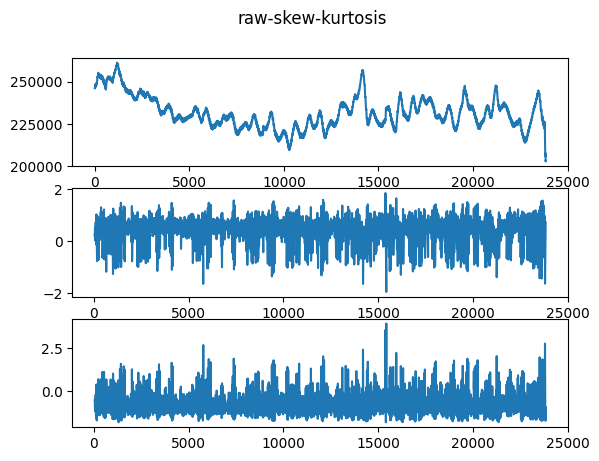

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.5123416716655006
ppg1 - kutosis 0.26927819871836745


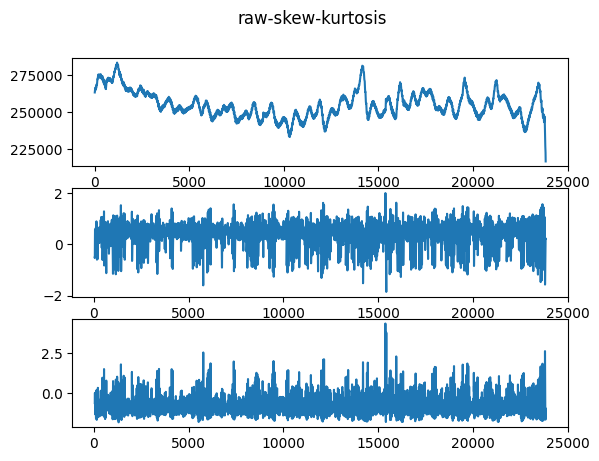

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.45102622382719143
ppg2 - kutosis -0.00844296686974566


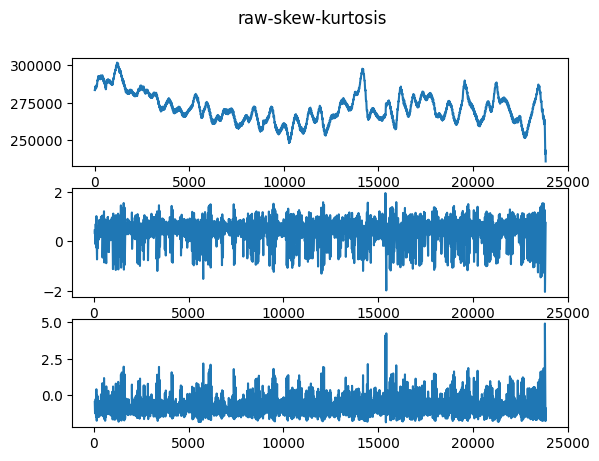

<Figure size 1200x800 with 0 Axes>

(H)022_20230506_090752_Verity.csv
인덱스 길이: 23082
ppg0 - skew 0.5337501149784669
ppg0 - kutosis 0.8415709292606817


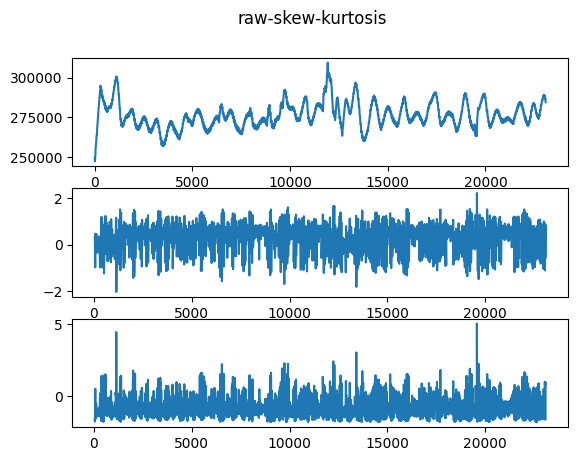

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.5120418370721155
ppg1 - kutosis 1.1608878961565745


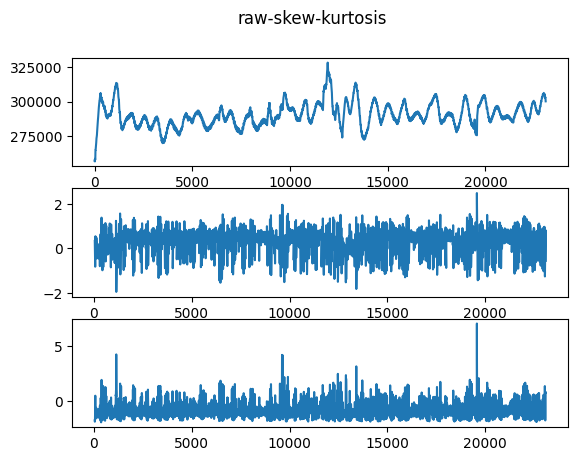

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.5274915941891355
ppg2 - kutosis 0.9750866166891208


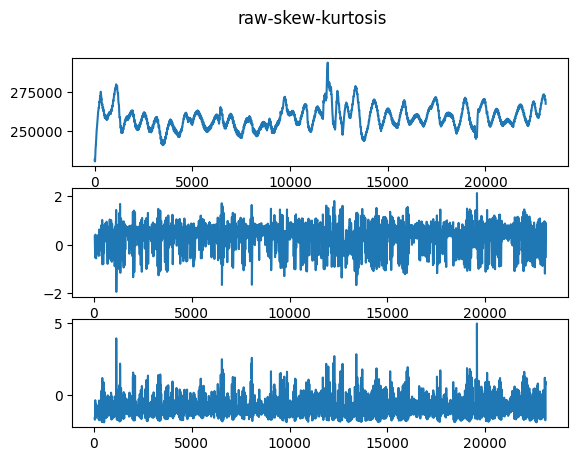

<Figure size 1200x800 with 0 Axes>

(H)023_20230506_091654_Verity.csv
인덱스 길이: 23060
ppg0 - skew 0.37642854825835054
ppg0 - kutosis -0.4432899540656492


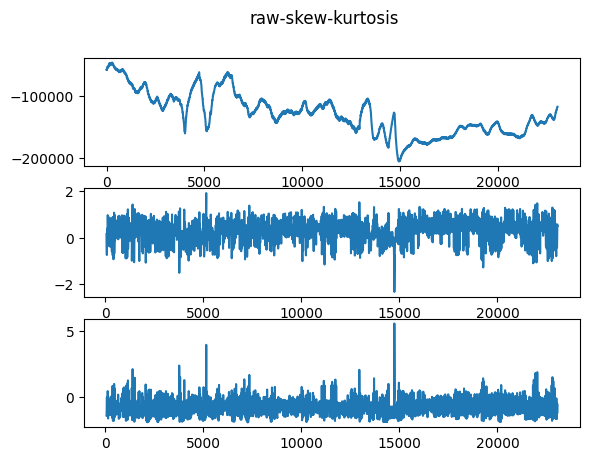

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.30917872860553397
ppg1 - kutosis -0.4378924891521505


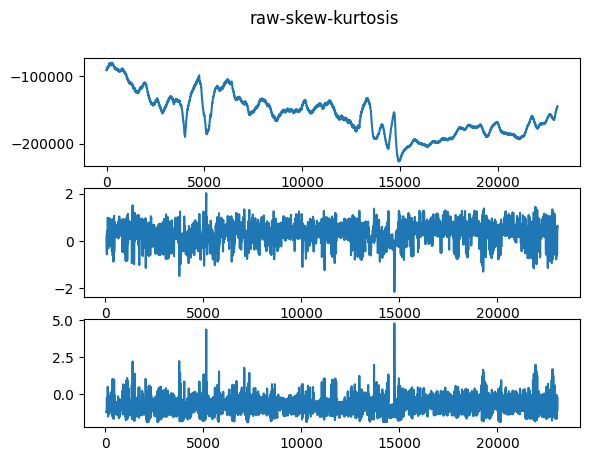

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.34780950644579534
ppg2 - kutosis -0.35268896068847555


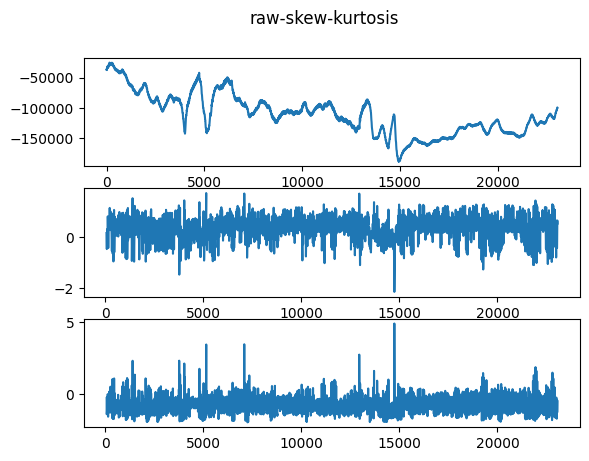

<Figure size 1200x800 with 0 Axes>

(H)024_20230506_101829_Verity.csv
인덱스 길이: 23190
ppg0 - skew 0.32480185918352933
ppg0 - kutosis 0.8145397383380155


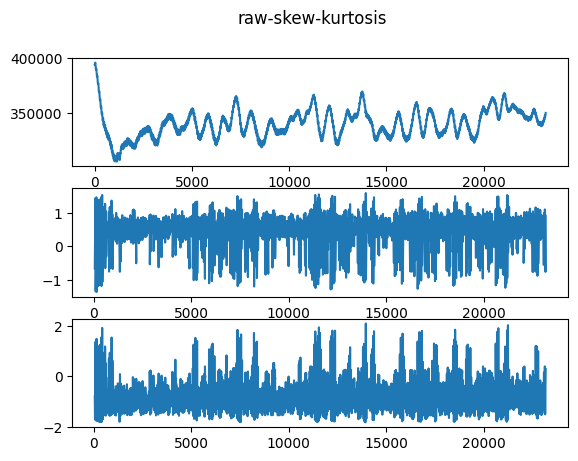

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.3767769932480276
ppg1 - kutosis 1.140986233749672


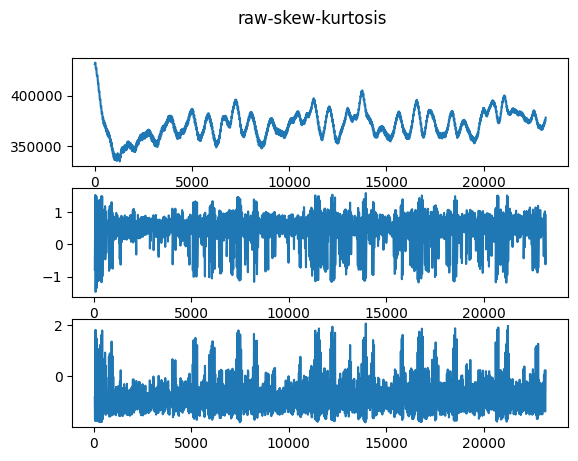

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.27188150626658214
ppg2 - kutosis 0.11582932224272824


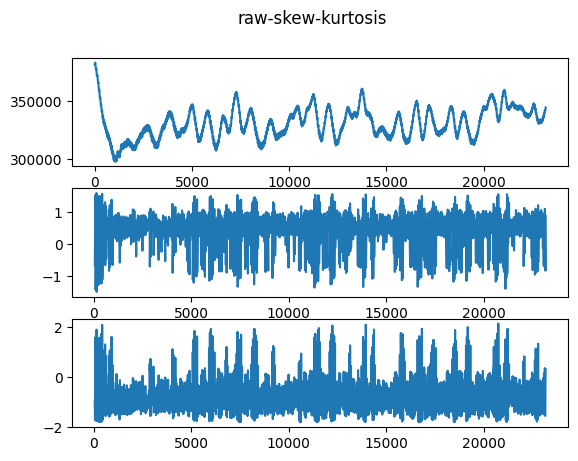

<Figure size 1200x800 with 0 Axes>

(H)025_20230506_105034_Verity.csv
인덱스 길이: 22811
ppg0 - skew 0.9526076102743529
ppg0 - kutosis 1.7770782266503922


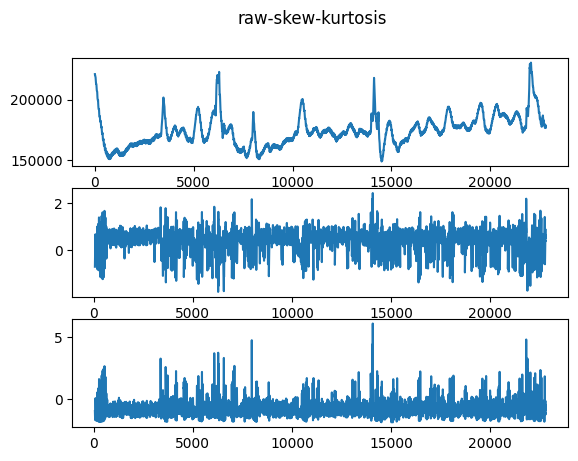

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.7943586979913501
ppg1 - kutosis 1.4088514024500407


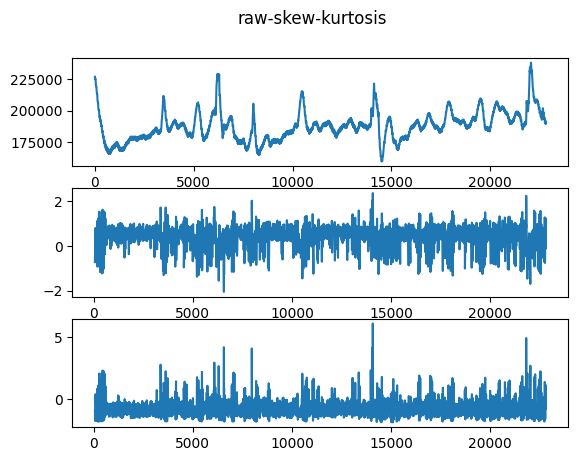

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.518180958887184
ppg2 - kutosis 0.4652980629107373


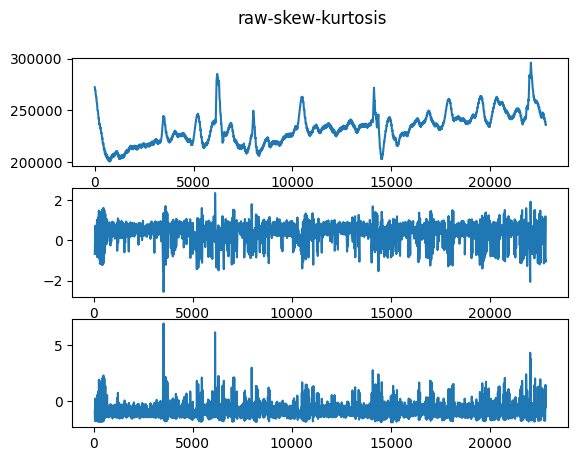

<Figure size 1200x800 with 0 Axes>

(H)026_20230506_100534_Verity.csv
인덱스 길이: 23097
ppg0 - skew 1.1018574321038808
ppg0 - kutosis 2.7223201685411773


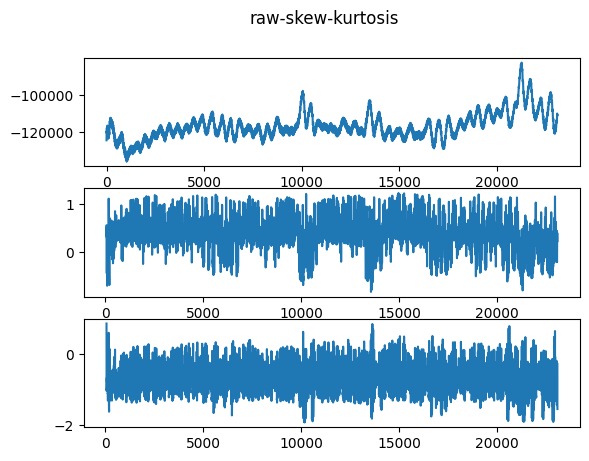

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.155797135183336
ppg1 - kutosis 2.9227095882457252


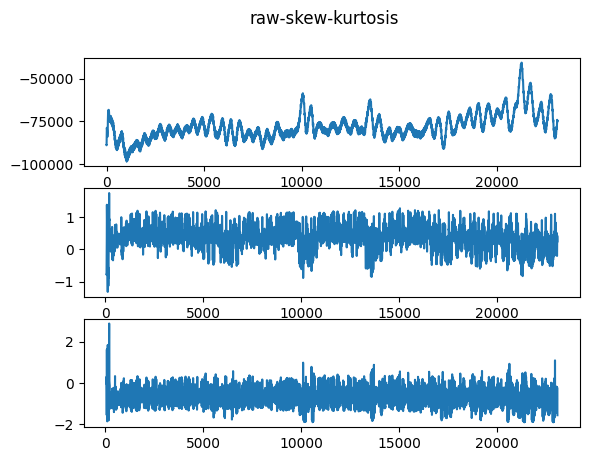

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.829518220652706
ppg2 - kutosis 2.2406904867823467


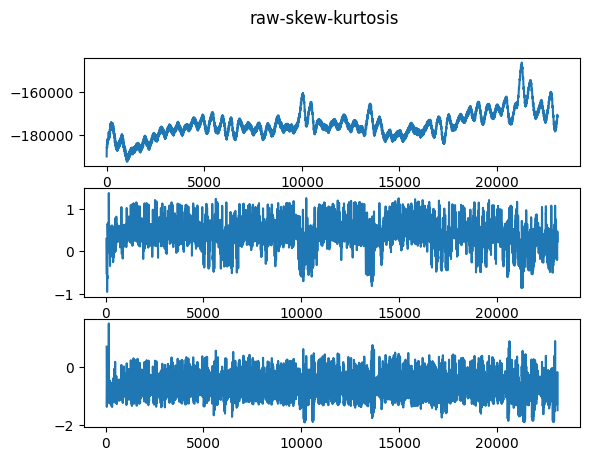

<Figure size 1200x800 with 0 Axes>

(H)027_20230506_103109_Verity.csv
인덱스 길이: 23161
ppg0 - skew 2.3842202039823808
ppg0 - kutosis 23.266338936129824


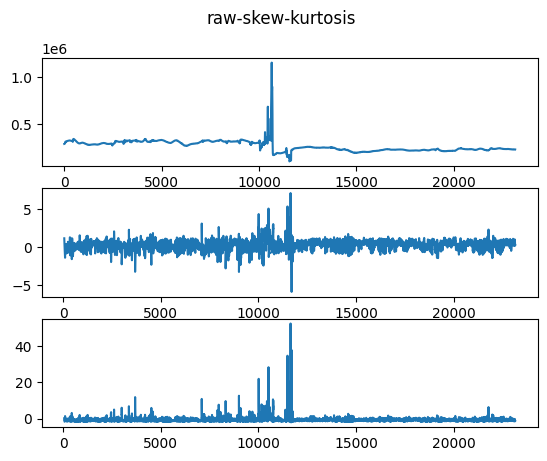

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.9364897396456939
ppg1 - kutosis 13.41699159575376


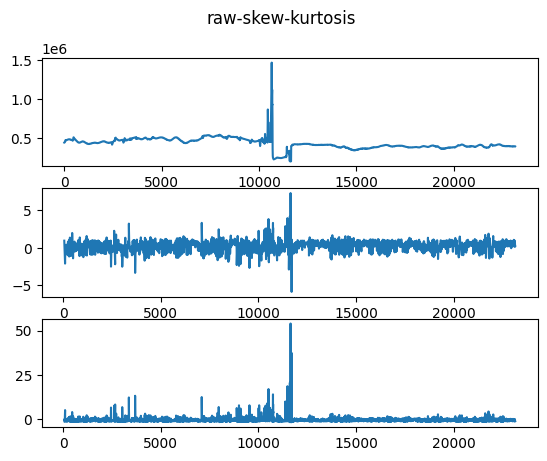

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 12.453704615395006
ppg2 - kutosis 272.33133645432923


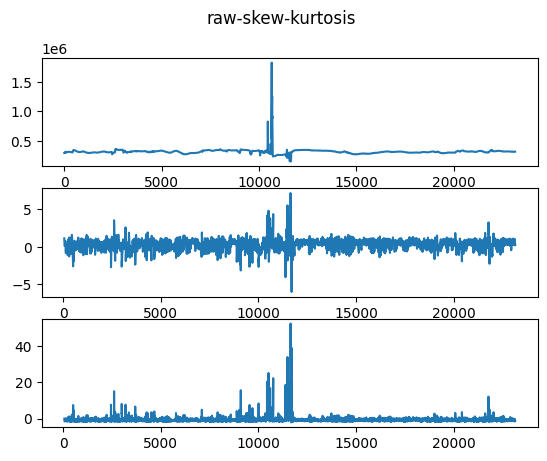

<Figure size 1200x800 with 0 Axes>

(H)028_20230506_103256_Verity.csv
인덱스 길이: 23045
ppg0 - skew 0.020077693597822795
ppg0 - kutosis -0.12068674712230942


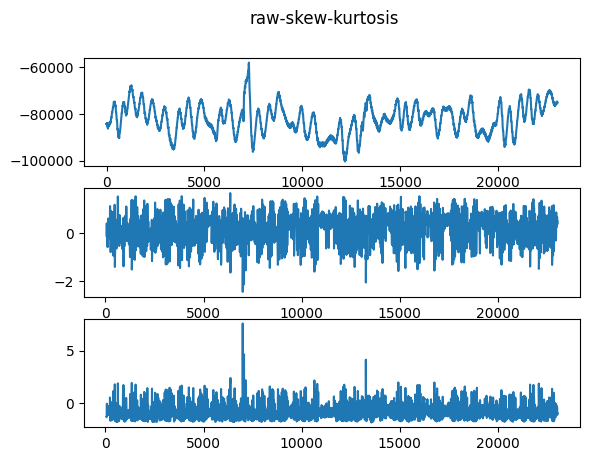

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.09188337749400713
ppg1 - kutosis -0.3645306515845128


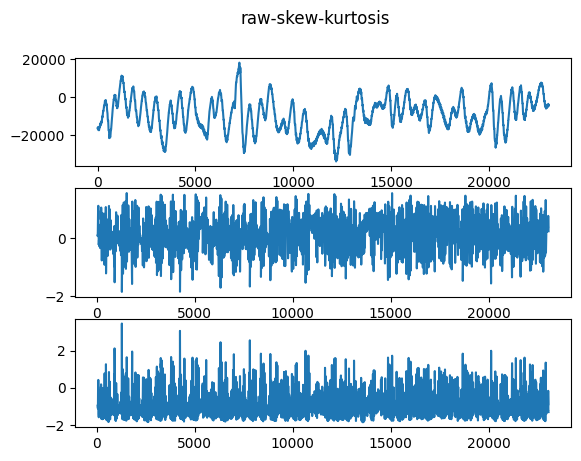

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.21979159995224856
ppg2 - kutosis -0.041387888735975764


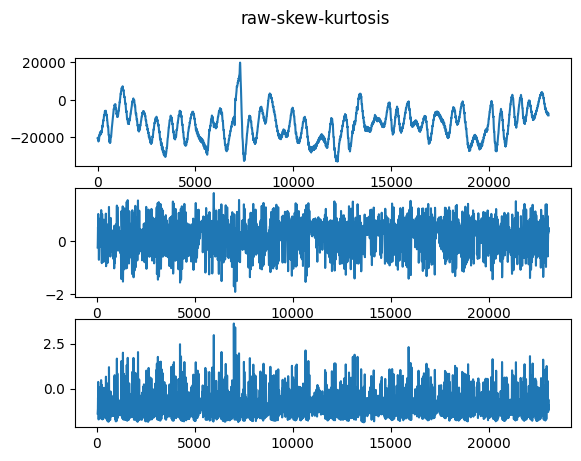

<Figure size 1200x800 with 0 Axes>

(H)029_20230506_110428_Verity.csv
인덱스 길이: 23031
ppg0 - skew -0.637349070863485
ppg0 - kutosis 0.48315860733763305


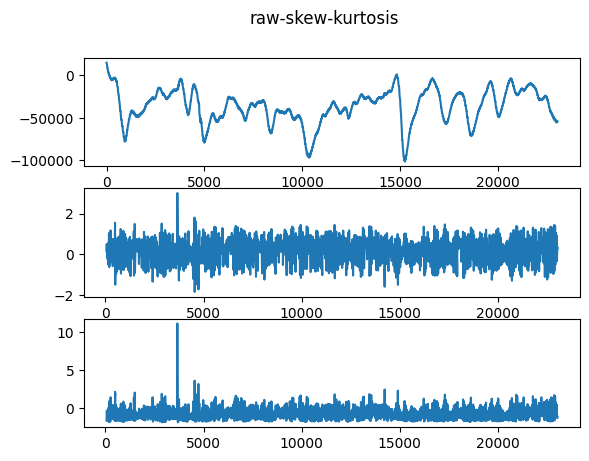

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.6947742671346055
ppg1 - kutosis 0.5999265138184602


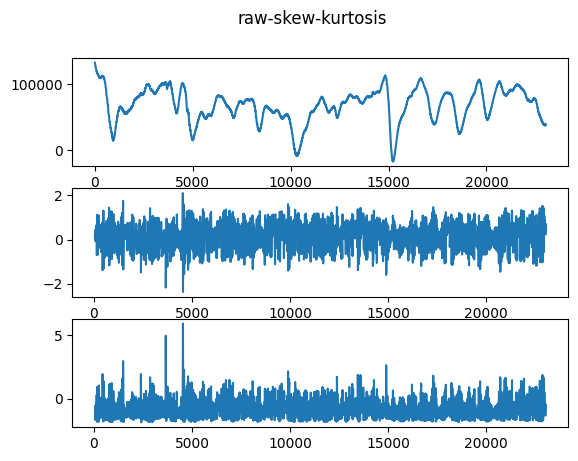

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.6134731986153602
ppg2 - kutosis 0.40693517182350325


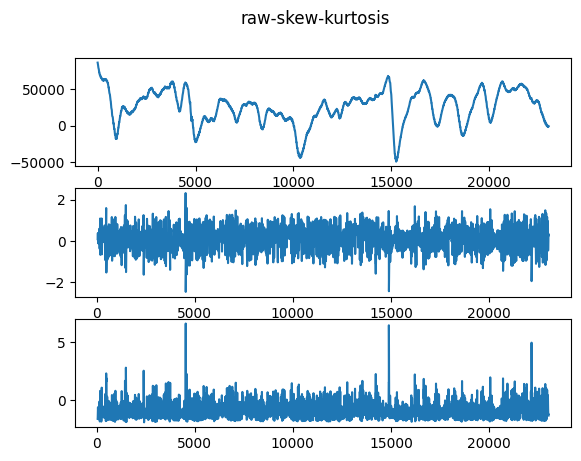

<Figure size 1200x800 with 0 Axes>

(H)030_20230506_111835_Verity.csv
인덱스 길이: 23337
ppg0 - skew -0.3943475370267304
ppg0 - kutosis 2.5163725662301992


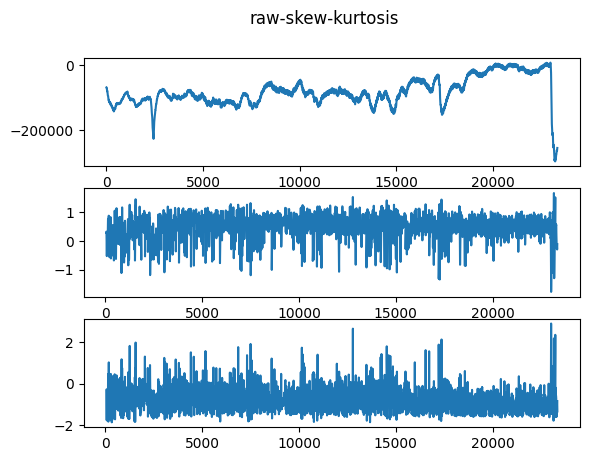

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.0844310840536072
ppg1 - kutosis 1.2471436020845097


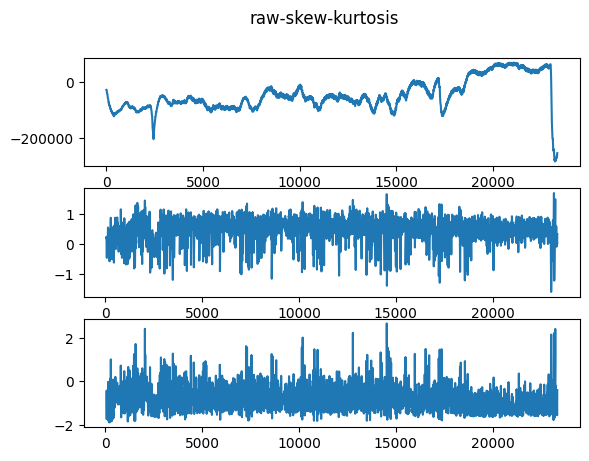

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.14363884582814115
ppg2 - kutosis 2.216671502393188


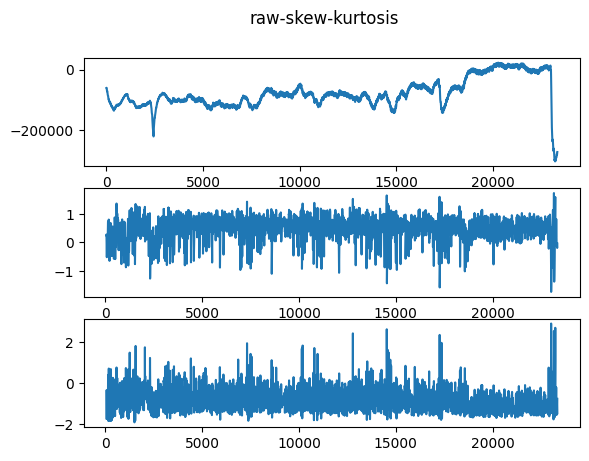

<Figure size 1200x800 with 0 Axes>

(H)031_20230506_115214_Verity.csv
인덱스 길이: 23114
ppg0 - skew 0.014967361492306657
ppg0 - kutosis -0.10730315427498693


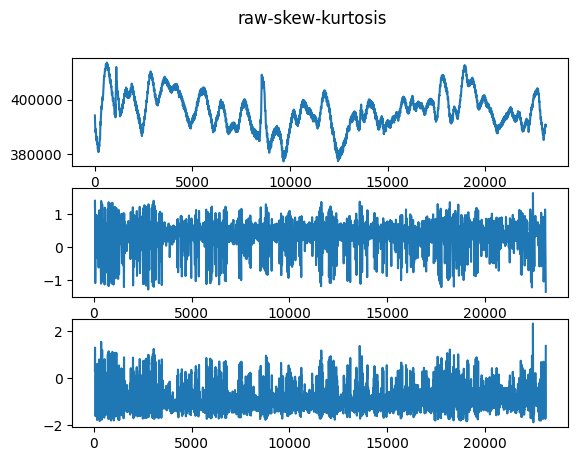

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.08131353987677341
ppg1 - kutosis -0.1518942763219724


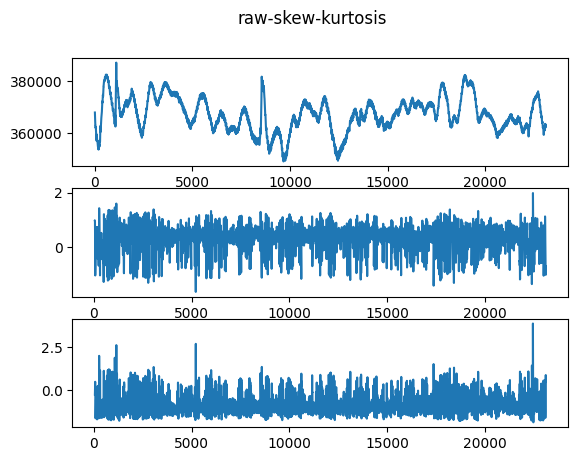

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.22120913127998867
ppg2 - kutosis 0.5395078533778417


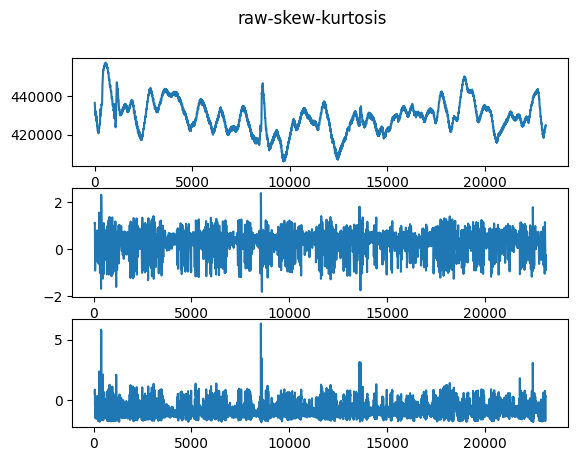

<Figure size 1200x800 with 0 Axes>

(H)032_20230506_110936_Verity.csv
인덱스 길이: 23146
ppg0 - skew 0.34970842788919543
ppg0 - kutosis -0.06643622029871299


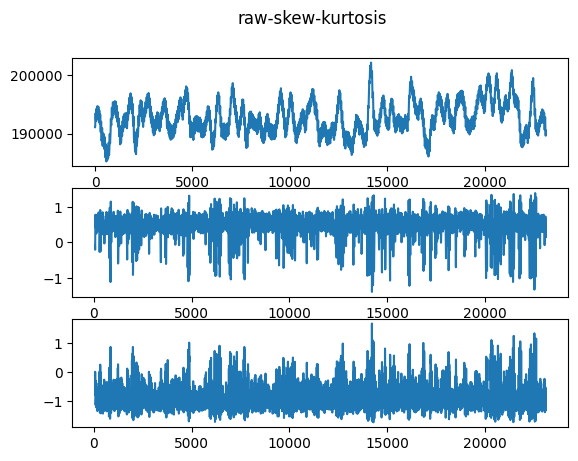

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.49164542253288096
ppg1 - kutosis -0.11931451621380651


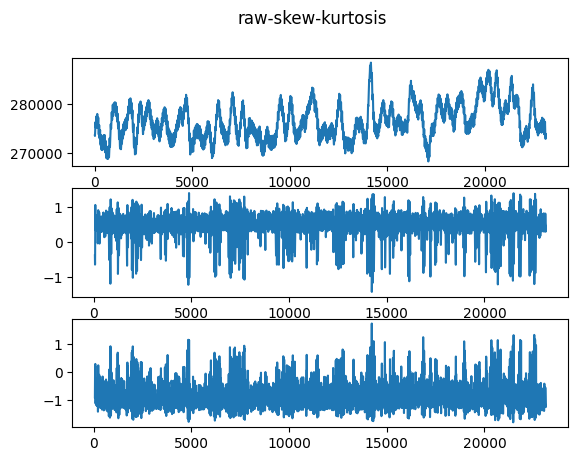

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.2636804819498532
ppg2 - kutosis -0.376972066129067


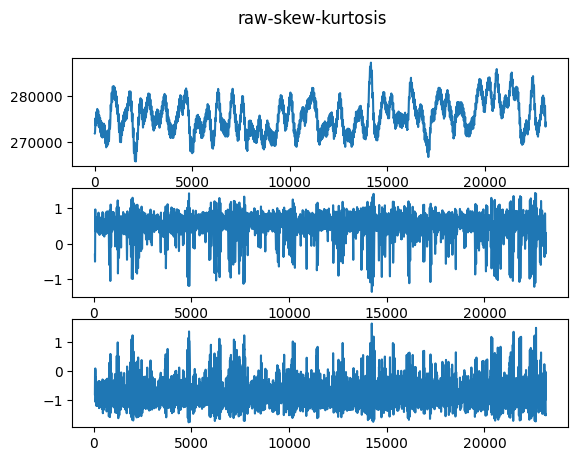

<Figure size 1200x800 with 0 Axes>

(H)033_20230506_113121_Verity.csv
인덱스 길이: 23087
ppg0 - skew -1.6558341591192698
ppg0 - kutosis 7.405373787792188


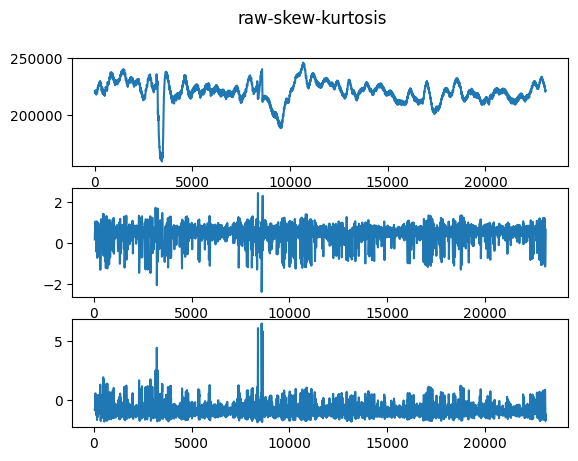

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -1.747468738308377
ppg1 - kutosis 6.518982687024915


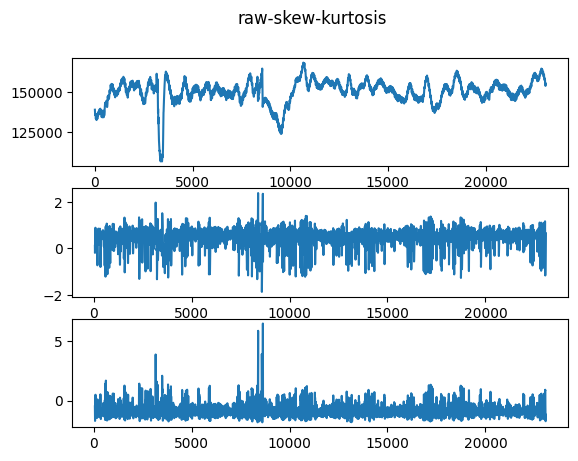

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -1.535825549340233
ppg2 - kutosis 5.38602025265549


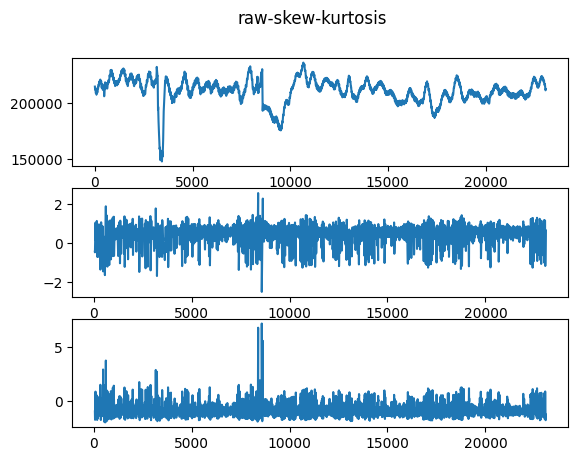

<Figure size 1200x800 with 0 Axes>

(H)034_20230506_113727_Verity.csv
인덱스 길이: 23030
ppg0 - skew -0.008845757735809002
ppg0 - kutosis -0.663103412507545


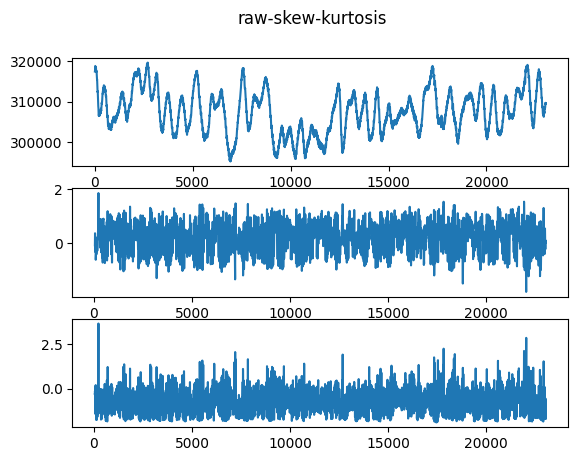

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.048374356949930565
ppg1 - kutosis -0.6063801266001554


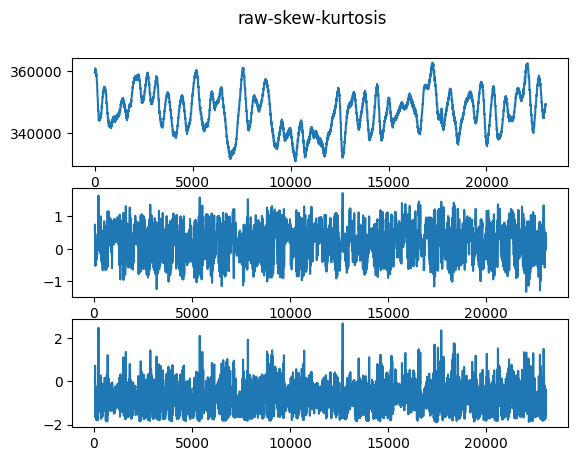

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.11524147899777737
ppg2 - kutosis -0.5089044290488305


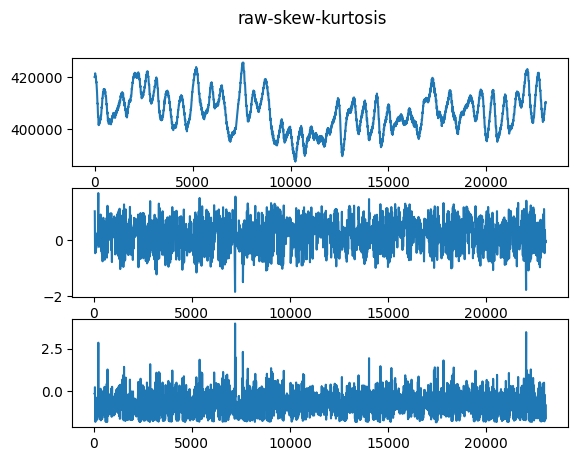

<Figure size 1200x800 with 0 Axes>

(H)035_20230506_120250_Verity.csv
인덱스 길이: 23138
ppg0 - skew 0.06746626384916103
ppg0 - kutosis -1.5343783291260384


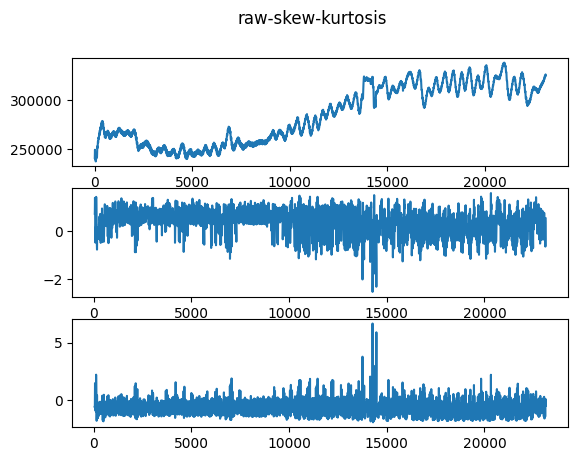

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.01213105438799279
ppg1 - kutosis -1.442976297799108


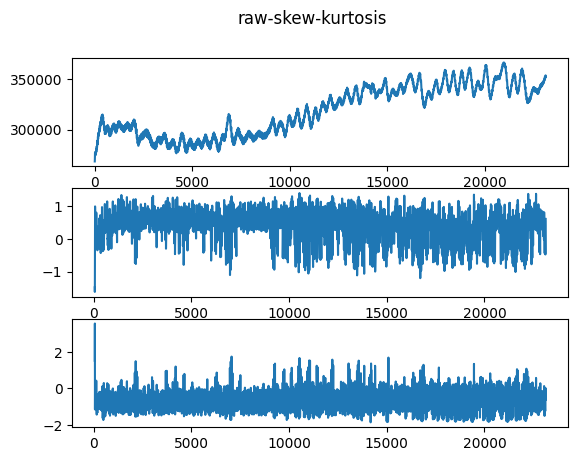

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.041849080308434476
ppg2 - kutosis -1.6194344174566544


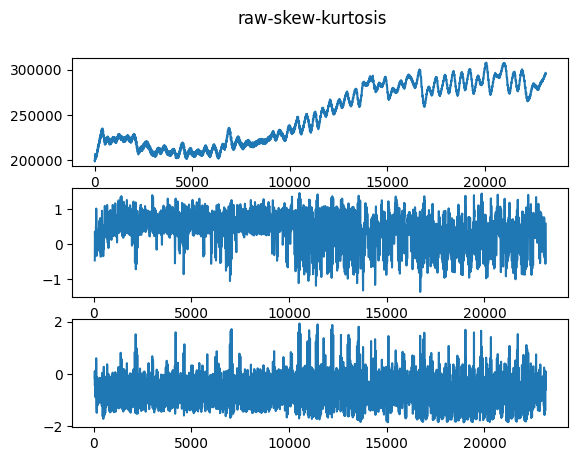

<Figure size 1200x800 with 0 Axes>

(H)036_20230506_125632_Verity.csv
인덱스 길이: 23072
ppg0 - skew -0.2602539277663359
ppg0 - kutosis -0.3499223827181521


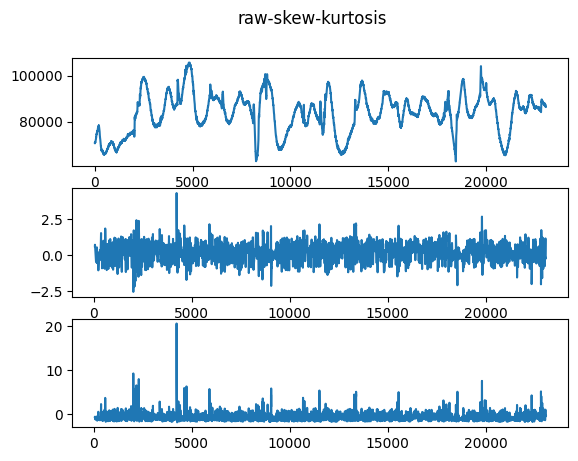

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.4299905348096255
ppg1 - kutosis -0.5011518047839316


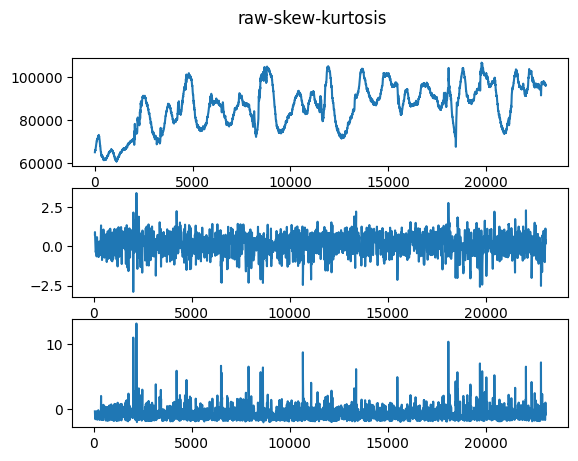

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.29335510585733093
ppg2 - kutosis -0.7650714186156913


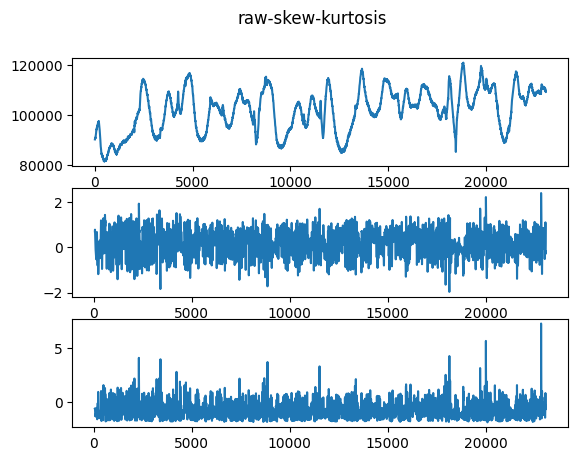

<Figure size 1200x800 with 0 Axes>

(H)037_20230506_123958_Verity.csv
인덱스 길이: 23134
ppg0 - skew 1.0196912574881285
ppg0 - kutosis 1.734141669329313


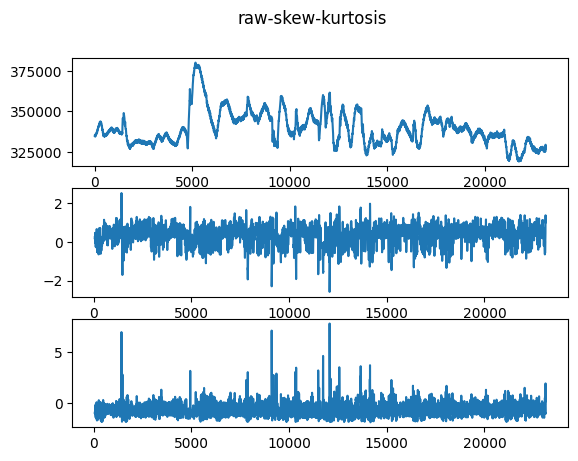

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.4104200027046414
ppg1 - kutosis 3.2340019525341868


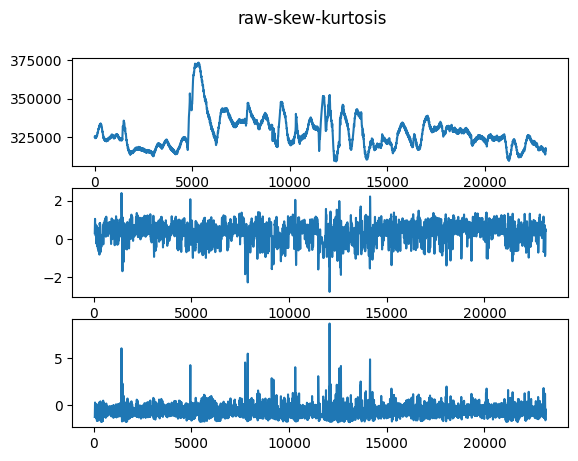

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.0653274084582012
ppg2 - kutosis 2.1602765560490775


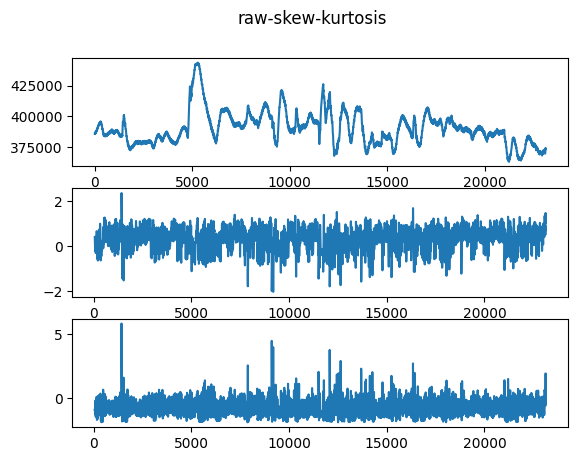

<Figure size 1200x800 with 0 Axes>

(H)038_20230506_124529_Verity.csv
인덱스 길이: 23071
ppg0 - skew -0.08008433066995486
ppg0 - kutosis -0.6678346155611683


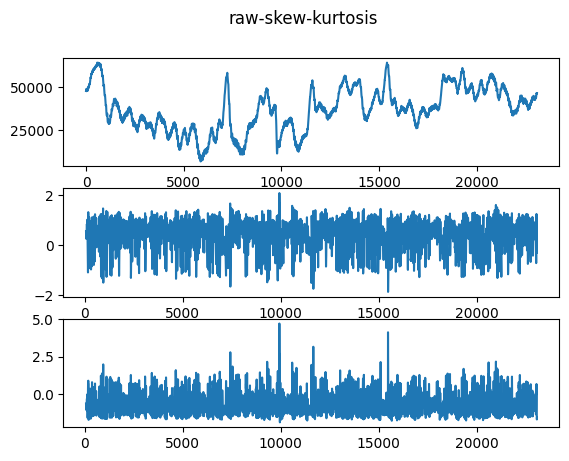

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.18300307356045528
ppg1 - kutosis -1.1696319347111614


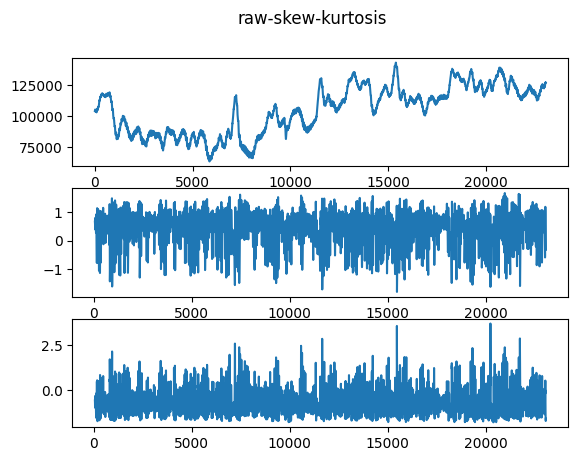

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.07081476748306233
ppg2 - kutosis -0.9844827080606633


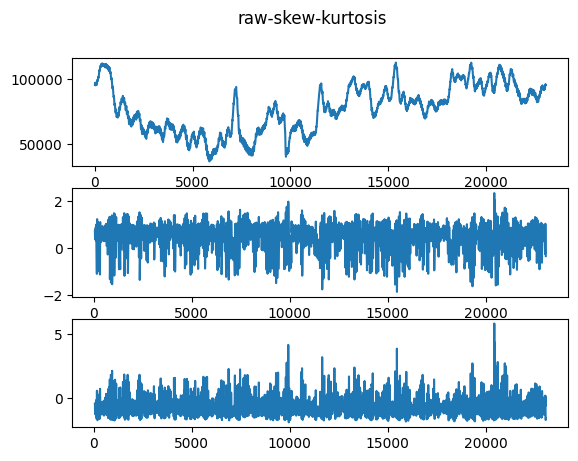

<Figure size 1200x800 with 0 Axes>

(H)039_20230506_122927_Verity.csv
인덱스 길이: 23047
ppg0 - skew 0.3653752536498481
ppg0 - kutosis 0.053426777446933915


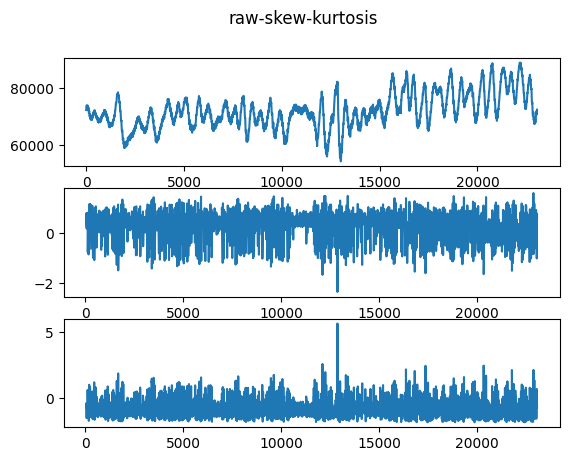

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.06798922307339868
ppg1 - kutosis 0.17051923493550847


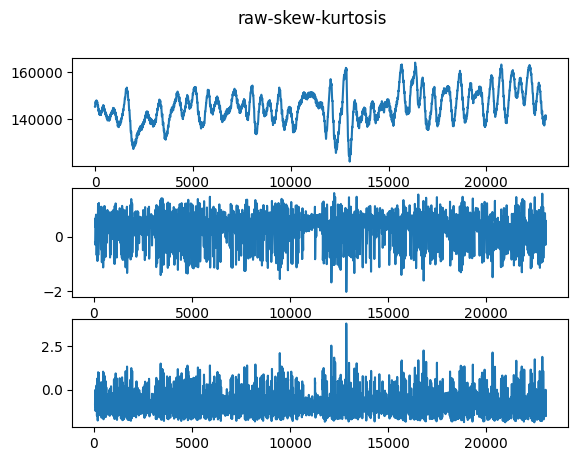

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.28810684652776203
ppg2 - kutosis -0.03322834617328141


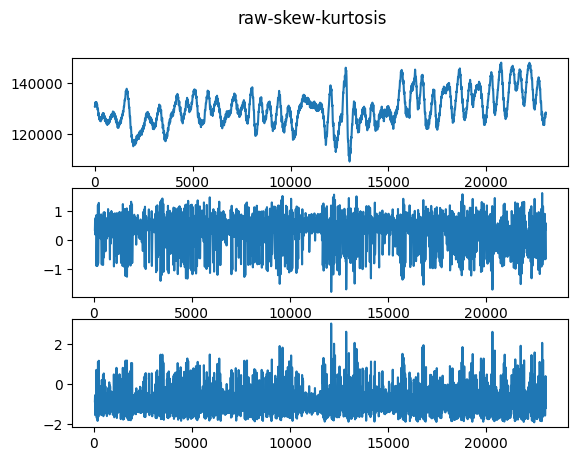

<Figure size 1200x800 with 0 Axes>

In [32]:
import padasip as pa
# https://matousc89.github.io/padasip/sources/filters/lms.html

for i in resting_verity_dict:
    print(i)
    print('인덱스 길이:',len(resting_verity_dict[i]))
    signals = resting_verity_dict[i][['ppg0', 'ppg1', 'ppg2']]
    ambient = resting_verity_dict[i]['ambient']

    for j in signals:
        print(j, '- skew', scipy.stats.skew(signals[j]))
        print(j, '- kutosis', scipy.stats.kurtosis(signals[j]))
        fig, axs = plt.subplots(3)
        fig.suptitle('raw-skew-kurtosis')
        plt.figure(figsize=(15, 10), dpi=80)

        axs[1].plot(pd.DataFrame(signals[j]).rolling(window = 55).skew())
        axs[2].plot(pd.DataFrame(signals[j]).rolling(window = 55).kurt())
        axs[0].plot(signals[j])
        plt.show()
        

피험자 수: 19 명
(H)021_20230506_091434_Verity.csv
인덱스 길이: 23842


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


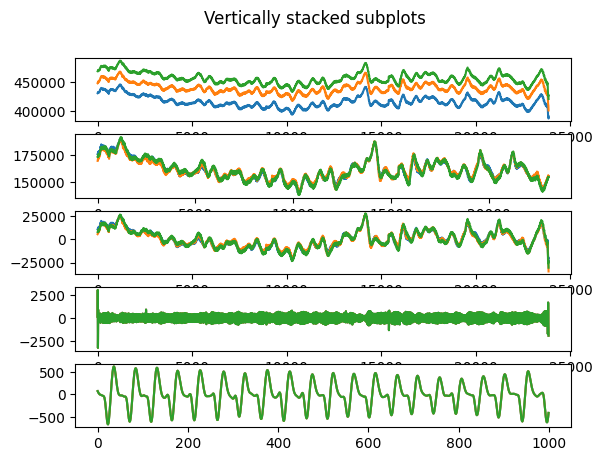

<Figure size 1200x800 with 0 Axes>

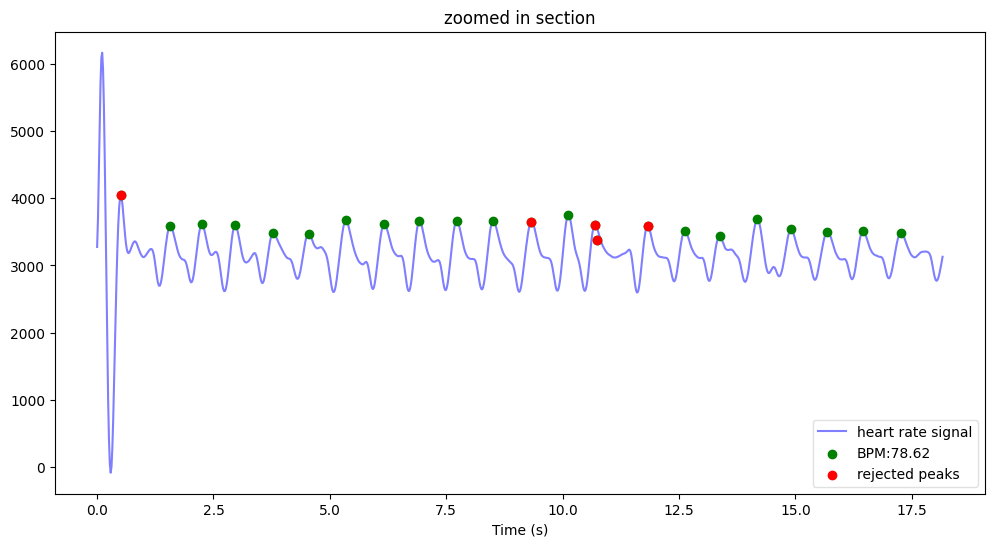

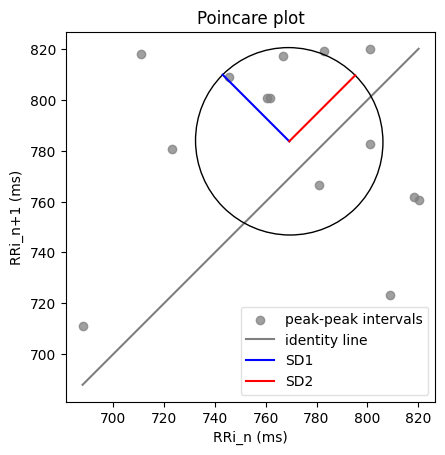

bpm: 78.620980
ibi: 763.155080
sdnn: 62.557087
sdsd: 25.646165
rmssd: 54.381653
pnn20: 0.785714
pnn50: 0.500000
hr_mad: 35.363636
sd1: 37.061531
sd2: 36.714807
s: 4274.787082
sd1/sd2: 1.009444
breathingrate: 0.308499


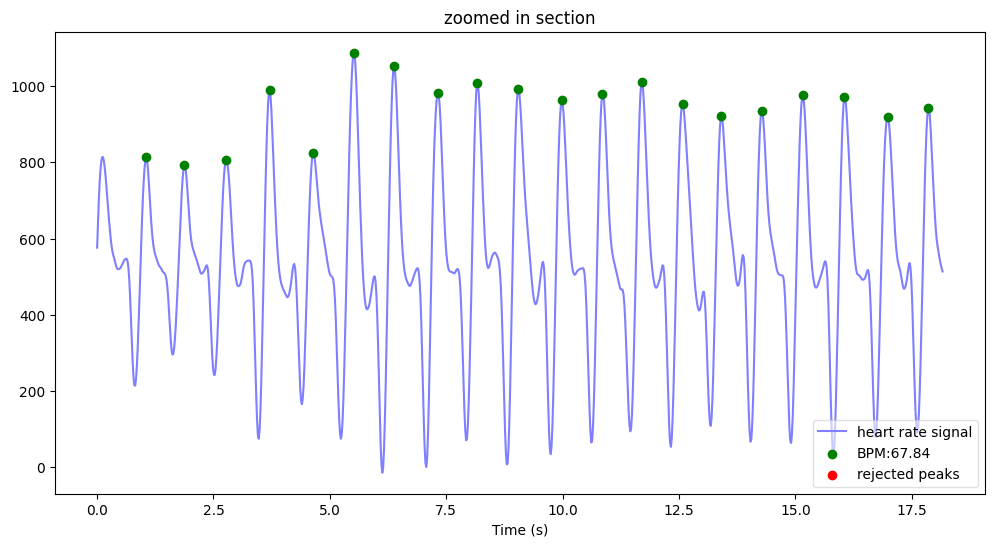

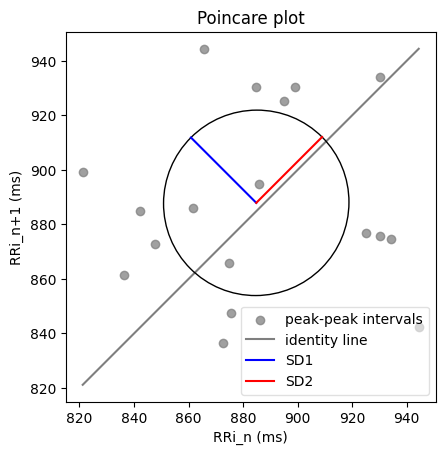

bpm: 67.840990
ibi: 884.421053
sdnn: 34.766946
sdsd: 25.507181
rmssd: 48.008383
pnn20: 0.833333
pnn50: 0.277778
hr_mad: 22.363636
sd1: 33.876853
sd2: 34.148968
s: 3634.381563
sd1/sd2: 0.992032
breathingrate: 0.357270


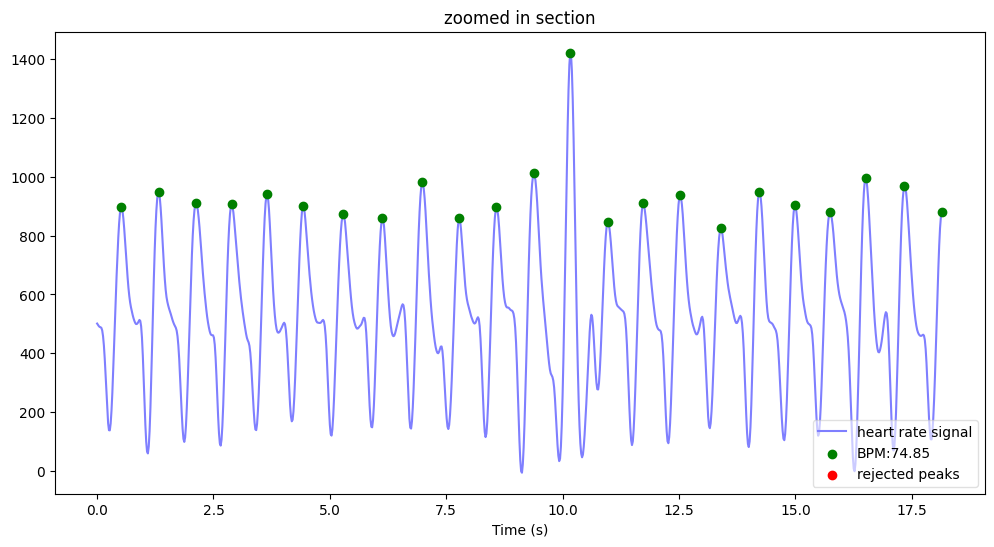

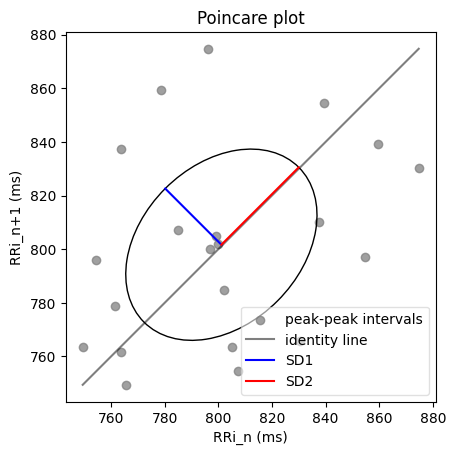

bpm: 74.854621
ibi: 801.553719
sdnn: 34.857916
sdsd: 25.459336
rmssd: 41.878542
pnn20: 0.571429
pnn50: 0.285714
hr_mad: 32.363636
sd1: 29.610285
sd2: 40.807068
s: 3796.014357
sd1/sd2: 0.725617
breathingrate: 0.113488


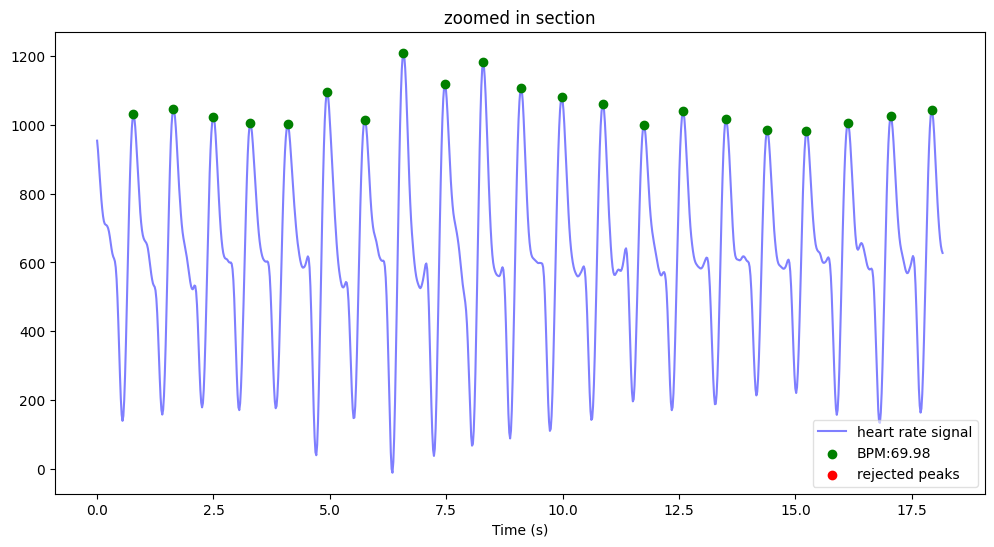

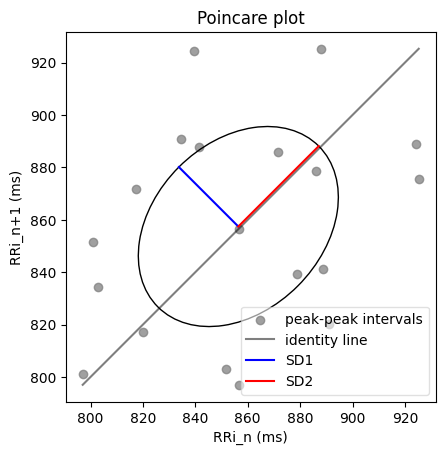

bpm: 69.981232
ibi: 857.372727
sdnn: 37.332279
sdsd: 23.278799
rmssd: 45.410970
pnn20: 0.736842
pnn50: 0.315789
hr_mad: 30.363636
sd1: 32.102468
sd2: 43.414660
s: 4378.493460
sd1/sd2: 0.739438
breathingrate: 0.291766


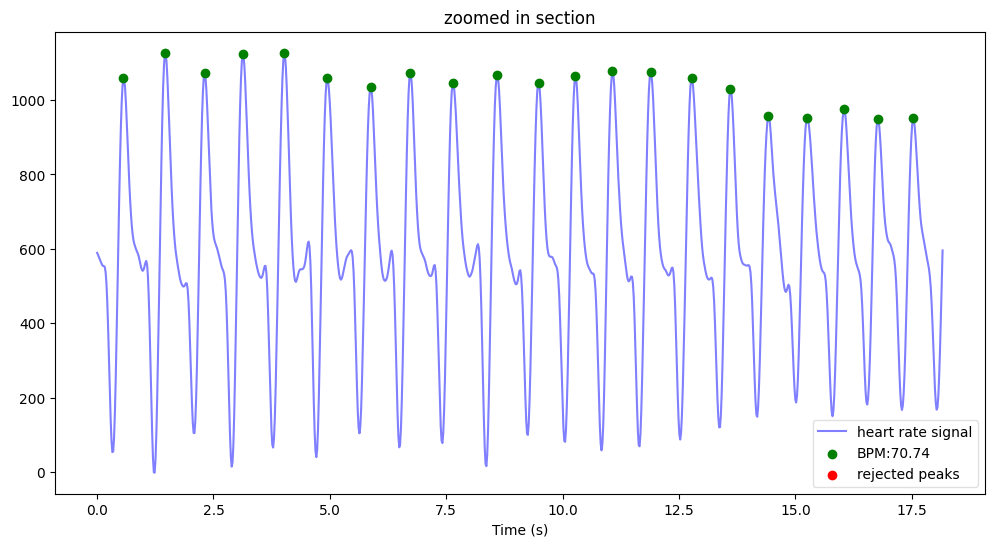

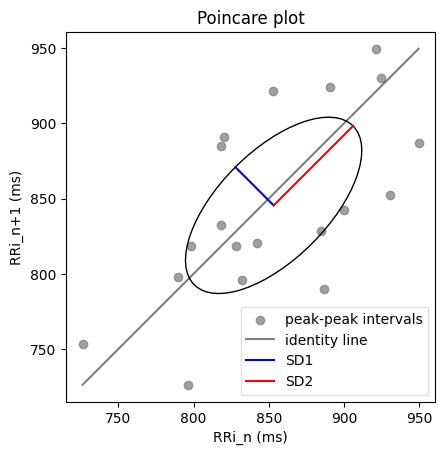

bpm: 70.739550
ibi: 848.181818
sdnn: 59.693266
sdsd: 26.827260
rmssd: 51.423245
pnn20: 0.789474
pnn50: 0.473684
hr_mad: 47.545455
sd1: 35.949876
sd2: 74.584482
s: 8423.561500
sd1/sd2: 0.482002
breathingrate: 0.235919
(H)022_20230506_090752_Verity.csv
인덱스 길이: 23082
안됨


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


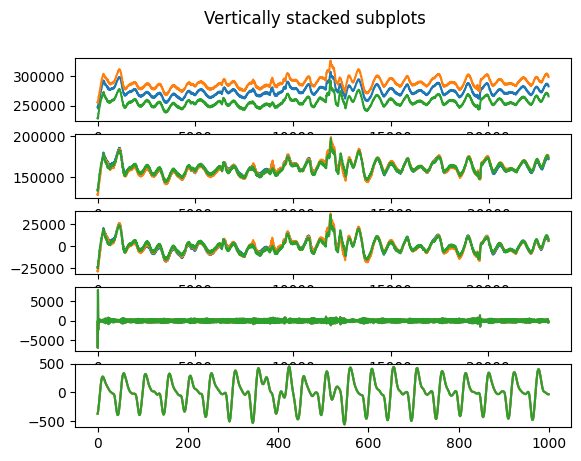

<Figure size 1200x800 with 0 Axes>

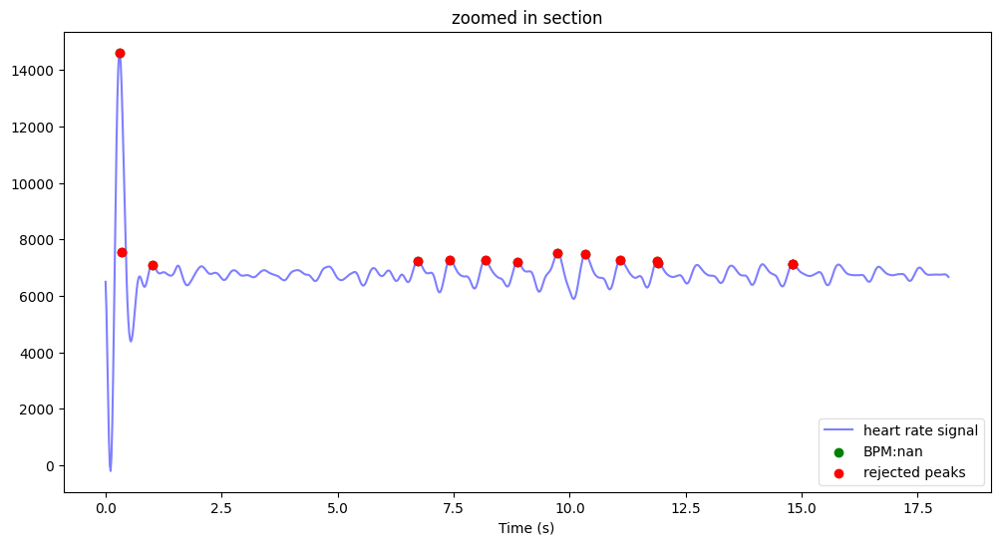

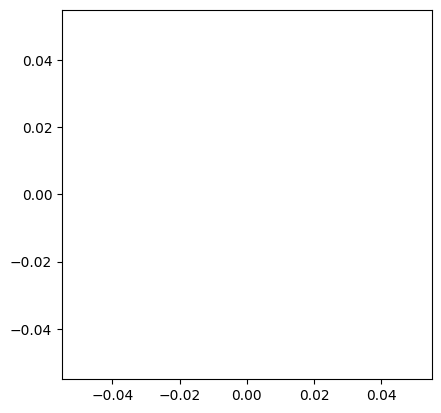

(H)023_20230506_091654_Verity.csv
인덱스 길이: 23060


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


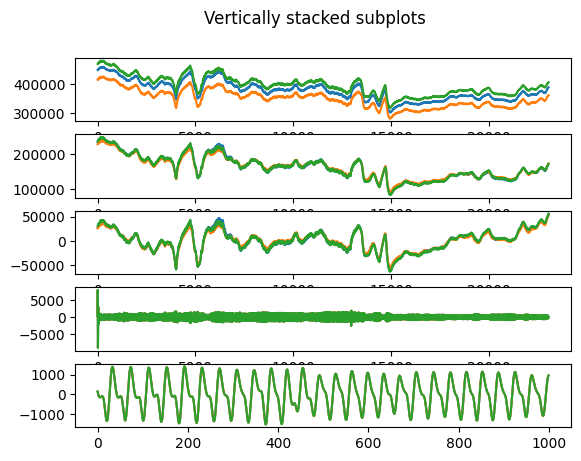

<Figure size 1200x800 with 0 Axes>

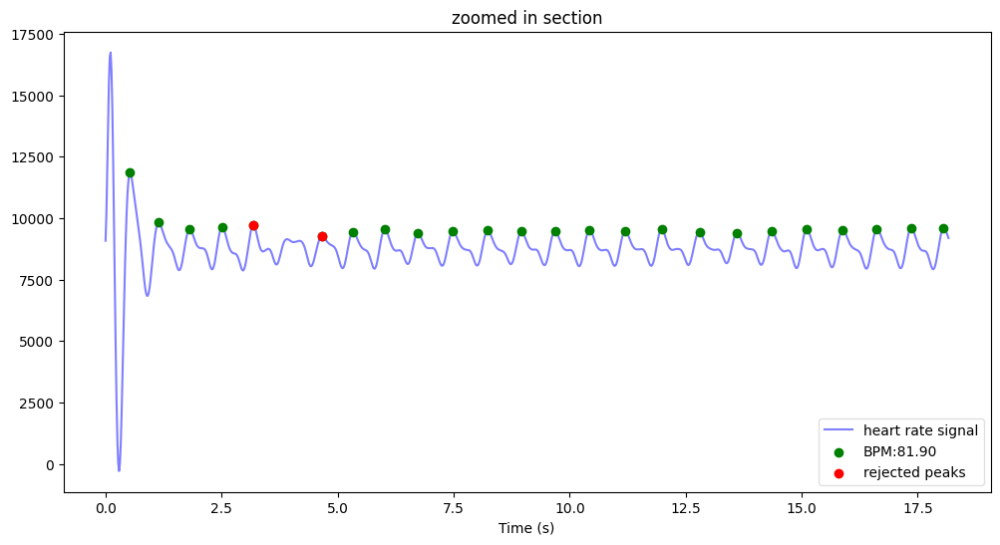

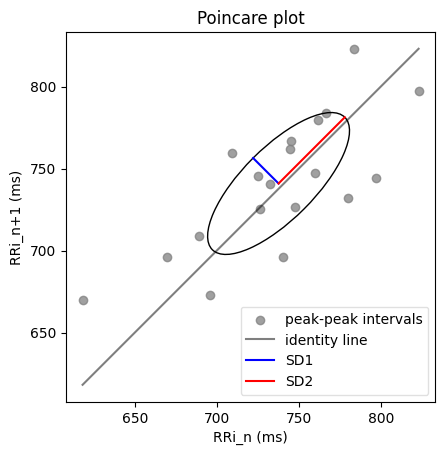

bpm: 81.904244
ibi: 732.562771
sdnn: 47.002312
sdsd: 15.206345
rmssd: 31.213008
pnn20: 0.684211
pnn50: 0.157895
hr_mad: 31.363636
sd1: 21.951756
sd2: 57.084661
s: 3936.756640
sd1/sd2: 0.384547
breathingrate: 0.195160


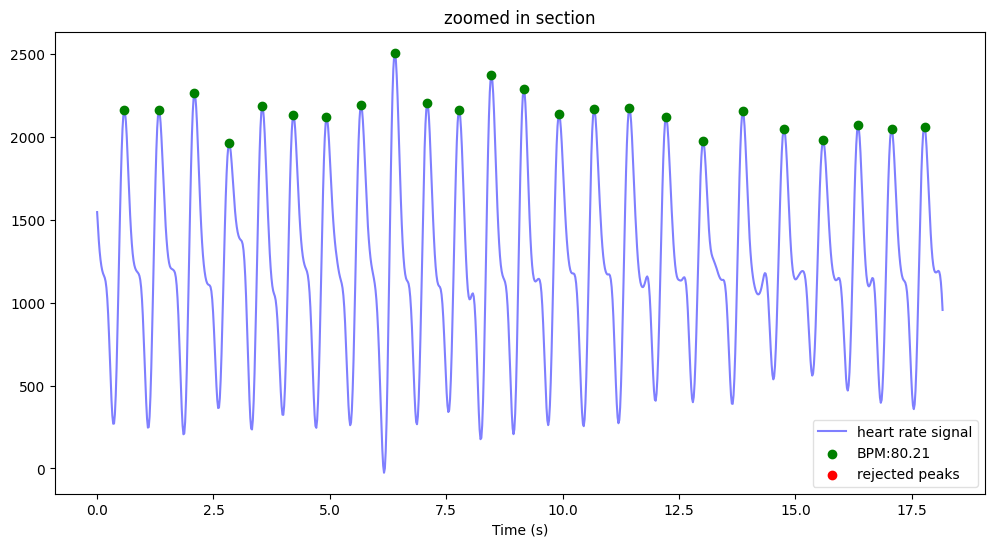

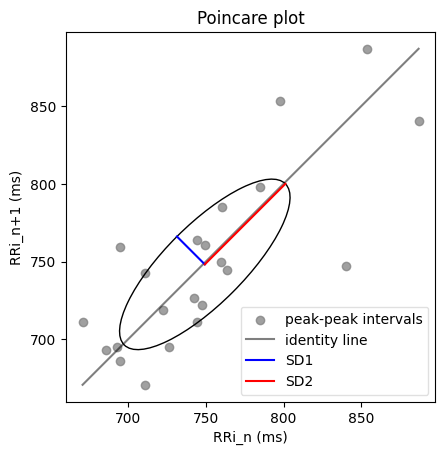

bpm: 80.210089
ibi: 748.035573
sdnn: 53.820764
sdsd: 21.600364
rmssd: 35.859548
pnn20: 0.545455
pnn50: 0.136364
hr_mad: 33.363636
sd1: 25.343233
sd2: 73.304026
s: 5836.328350
sd1/sd2: 0.345728
breathingrate: 0.232666


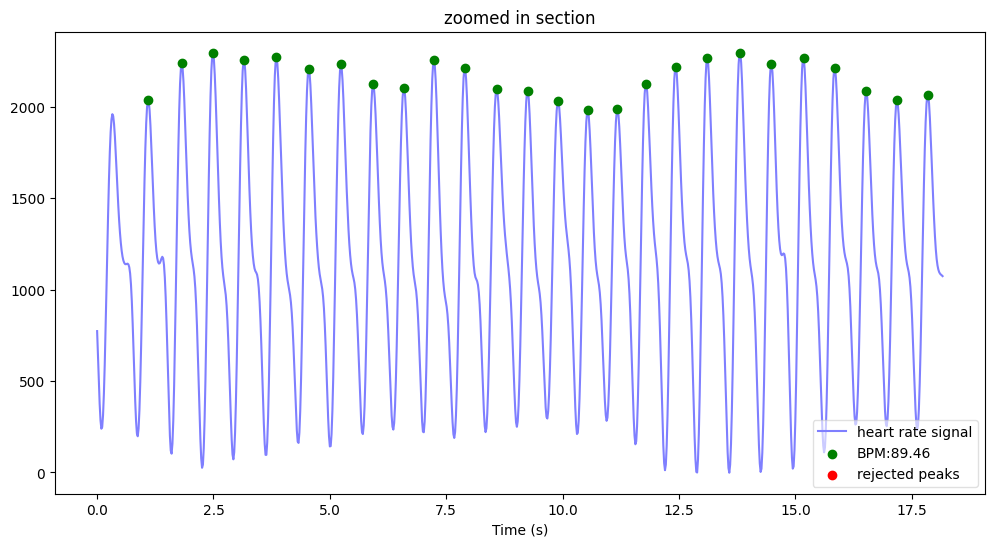

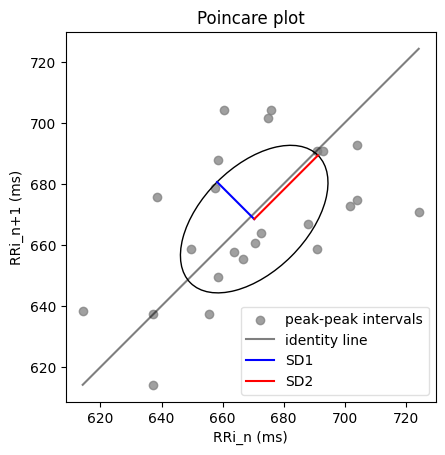

bpm: 89.459017
ibi: 670.698182
sdnn: 24.939341
sdsd: 13.647899
rmssd: 24.397838
pnn20: 0.541667
pnn50: 0.041667
hr_mad: 17.181818
sd1: 17.199190
sd2: 29.541690
s: 1596.221685
sd1/sd2: 0.582201
breathingrate: 0.179072


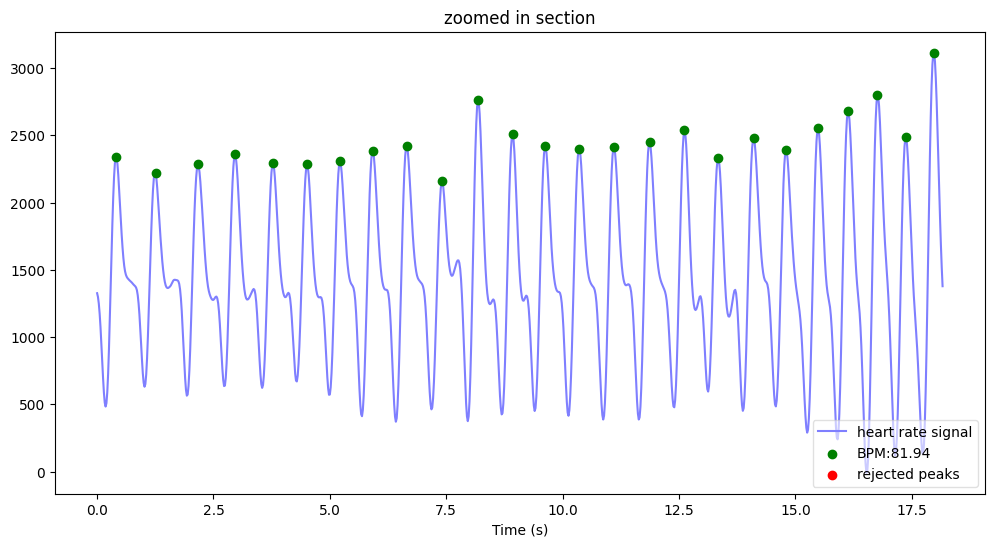

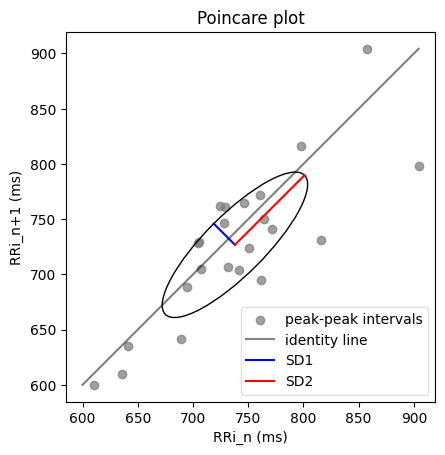

bpm: 81.944739
ibi: 732.200758
sdnn: 69.840230
sdsd: 24.981238
rmssd: 39.929902
pnn20: 0.608696
pnn50: 0.130435
hr_mad: 32.863636
sd1: 27.103387
sd2: 89.113543
s: 7587.822167
sd1/sd2: 0.304144
breathingrate: 0.170804


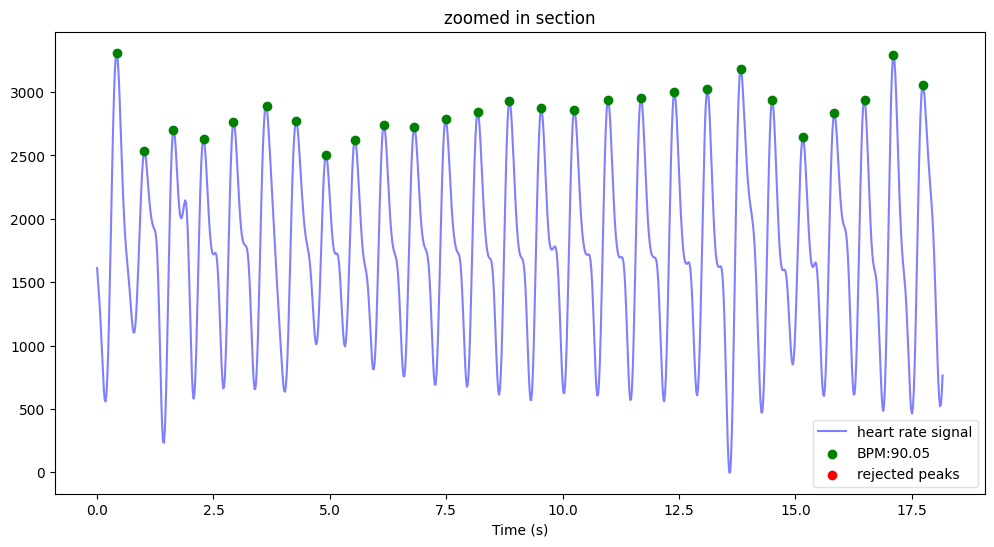

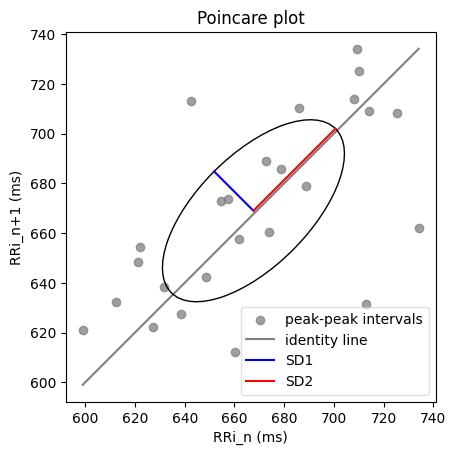

bpm: 90.052268
ibi: 666.279720
sdnn: 37.419436
sdsd: 21.462479
rmssd: 31.645093
pnn20: 0.360000
pnn50: 0.120000
hr_mad: 29.181818
sd1: 22.356553
sd2: 46.652681
s: 3276.659507
sd1/sd2: 0.479213
breathingrate: 0.115527
(H)024_20230506_101829_Verity.csv
인덱스 길이: 23190


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


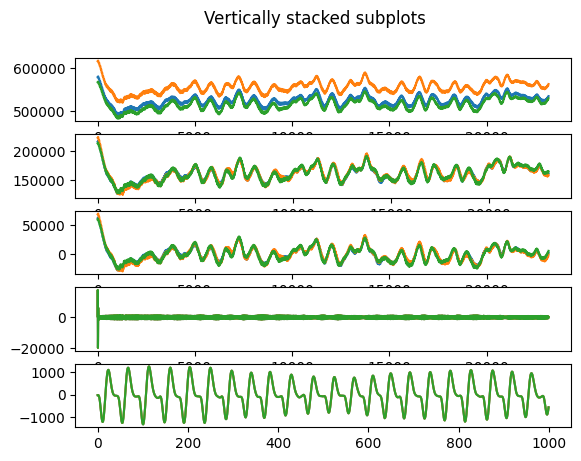

<Figure size 1200x800 with 0 Axes>

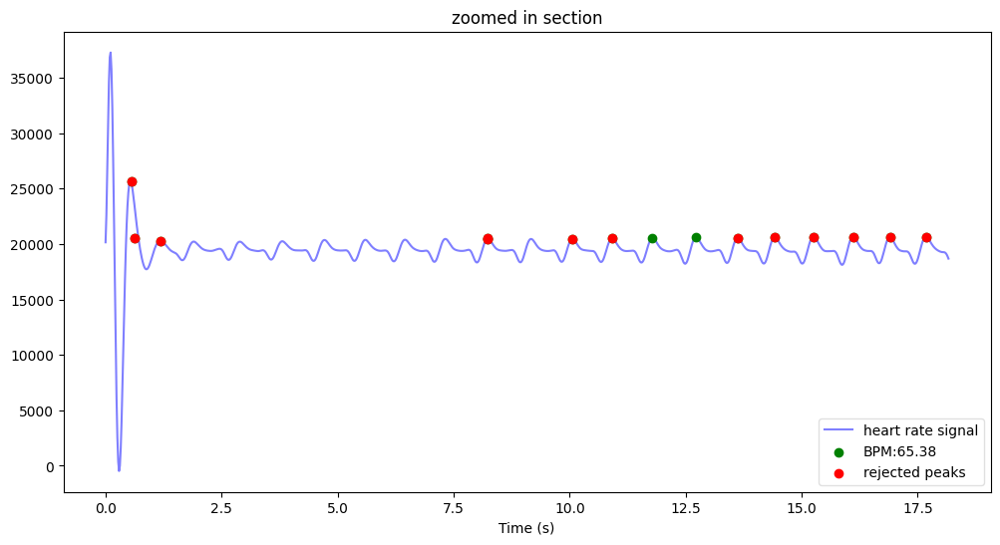

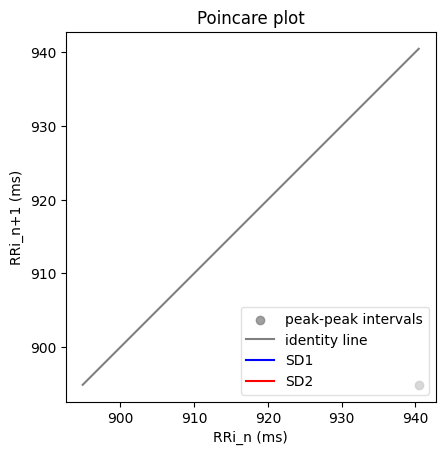

bpm: 65.382139
ibi: 917.681818
sdnn: 22.772727
sdsd: 0.000000
rmssd: 45.545455
pnn20: 1.000000
pnn50: 0.000000
hr_mad: 22.772727
sd1: 0.000000
sd2: 0.000000
s: 0.000000
sd1/sd2: nan
breathingrate: nan


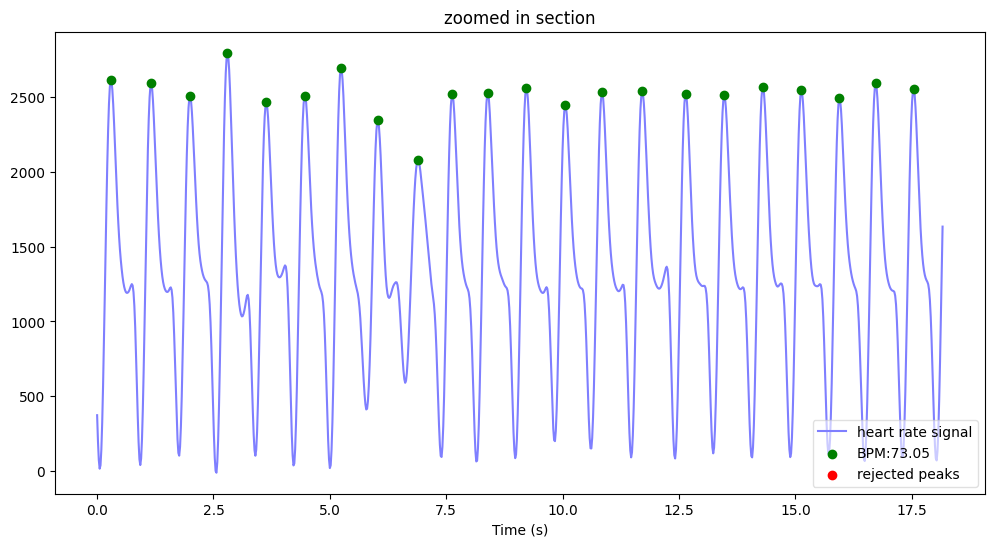

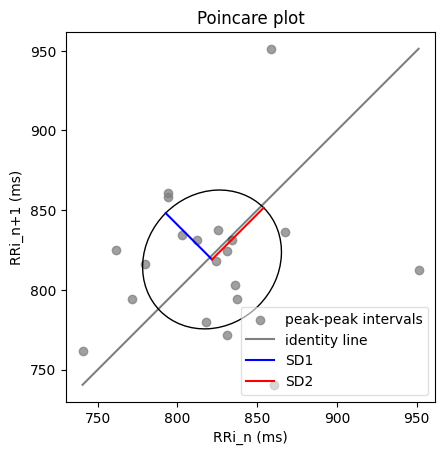

bpm: 73.045403
ibi: 821.406926
sdnn: 43.139493
sdsd: 36.271773
rmssd: 58.234632
pnn20: 0.750000
pnn50: 0.350000
hr_mad: 21.181818
sd1: 41.137756
sd2: 45.844763
s: 5924.888774
sd1/sd2: 0.897327
breathingrate: 0.348008


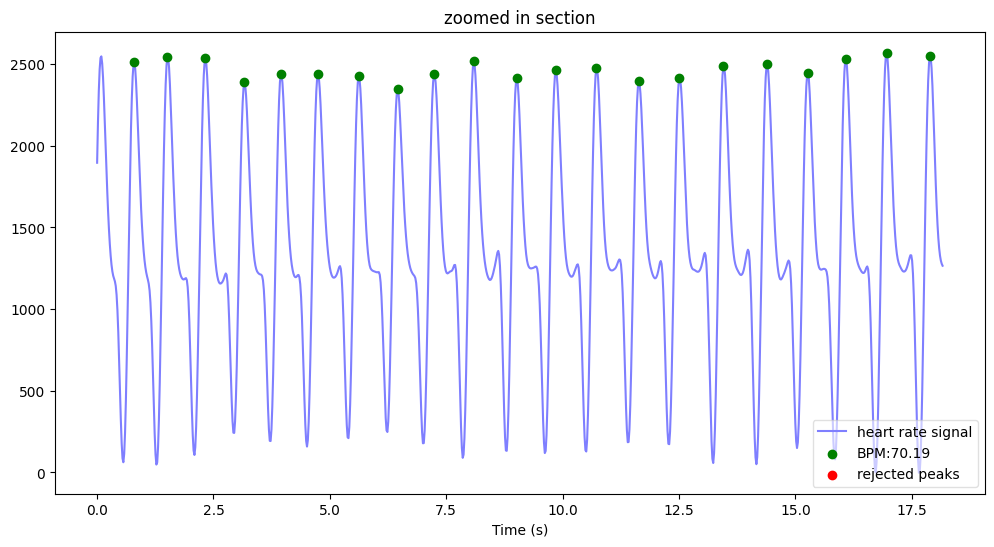

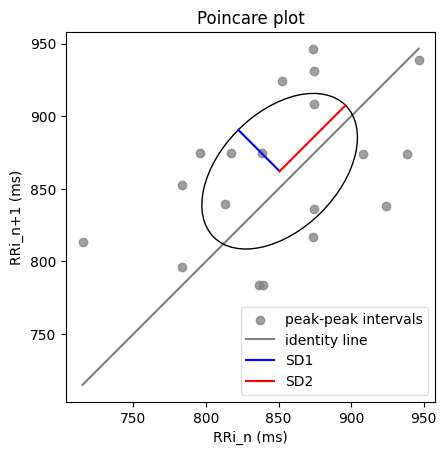

bpm: 70.192231
ibi: 854.795455
sdnn: 58.255641
sdsd: 23.608081
rmssd: 58.077006
pnn20: 0.894737
pnn50: 0.631579
hr_mad: 45.454545
sd1: 40.270833
sd2: 64.168584
s: 8118.259758
sd1/sd2: 0.627579
breathingrate: 0.351165


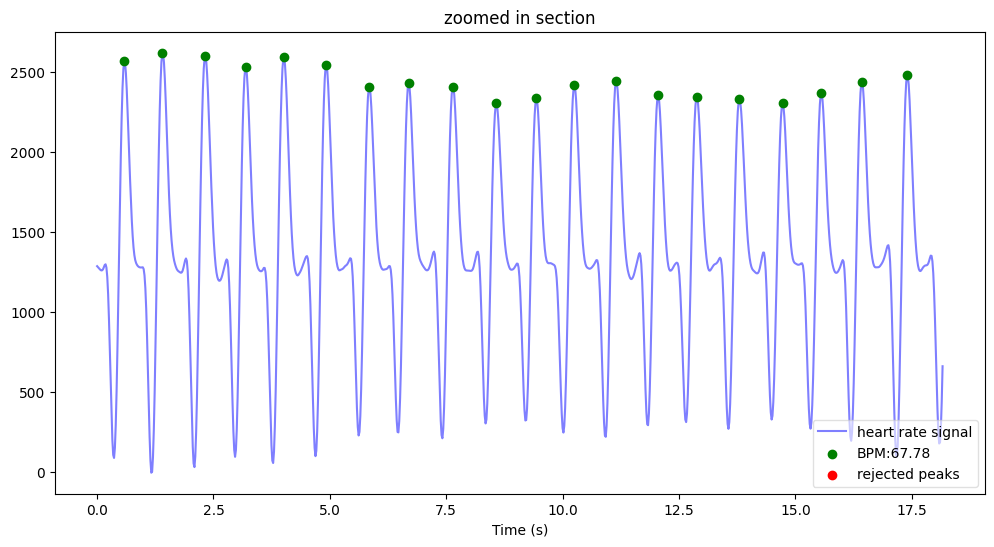

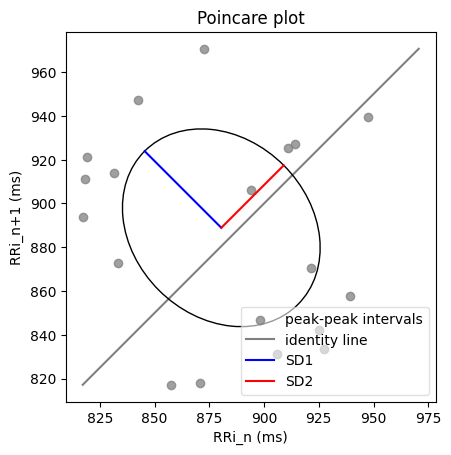

bpm: 67.779754
ibi: 885.220096
sdnn: 47.483770
sdsd: 33.028962
rmssd: 70.507598
pnn20: 0.777778
pnn50: 0.666667
hr_mad: 36.363636
sd1: 49.500119
sd2: 40.324795
s: 6270.877022
sd1/sd2: 1.227536
breathingrate: 0.297407


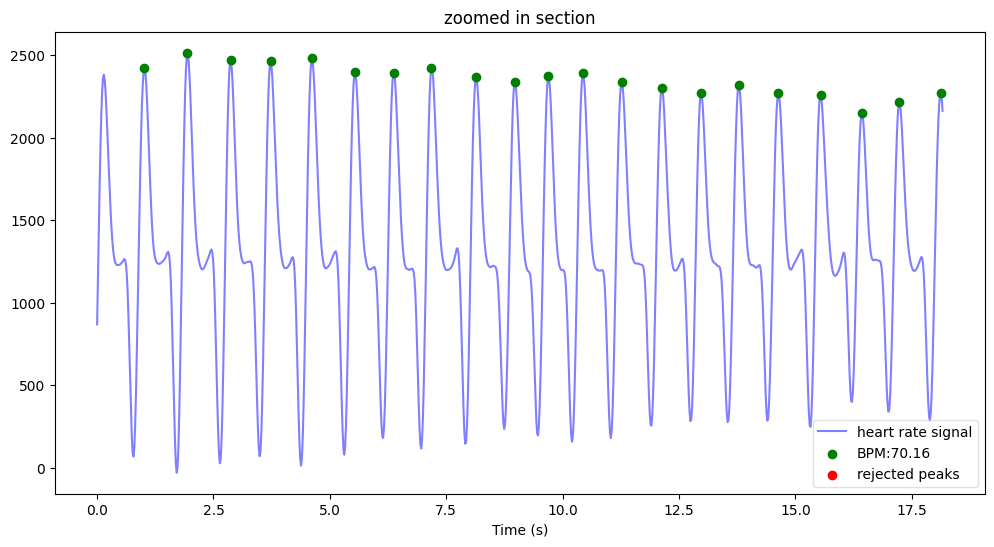

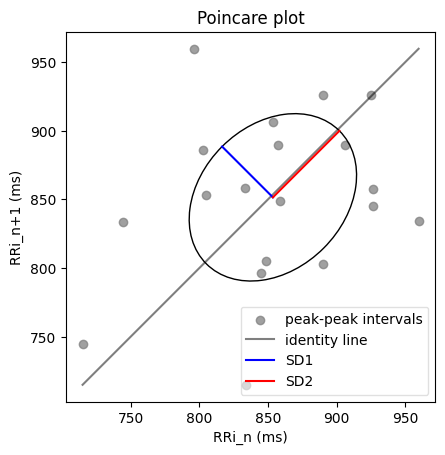

bpm: 70.158654
ibi: 855.204545
sdnn: 60.646673
sdsd: 41.683499
rmssd: 73.952882
pnn20: 0.842105
pnn50: 0.473684
hr_mad: 42.454545
sd1: 52.272060
sd2: 68.458756
s: 11242.127039
sd1/sd2: 0.763556
breathingrate: 0.234000
(H)025_20230506_105034_Verity.csv
인덱스 길이: 22811
안됨


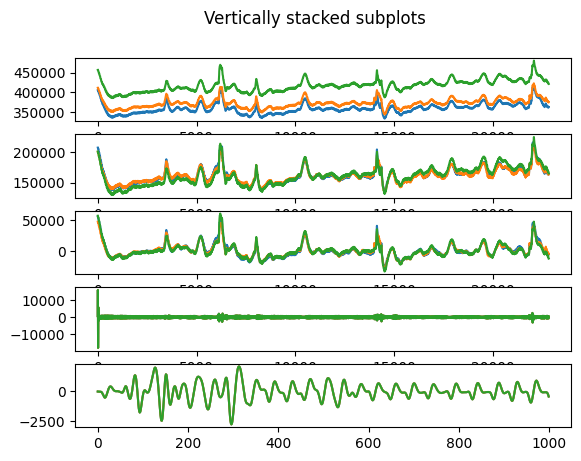

<Figure size 1200x800 with 0 Axes>

(H)026_20230506_100534_Verity.csv
인덱스 길이: 23097


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


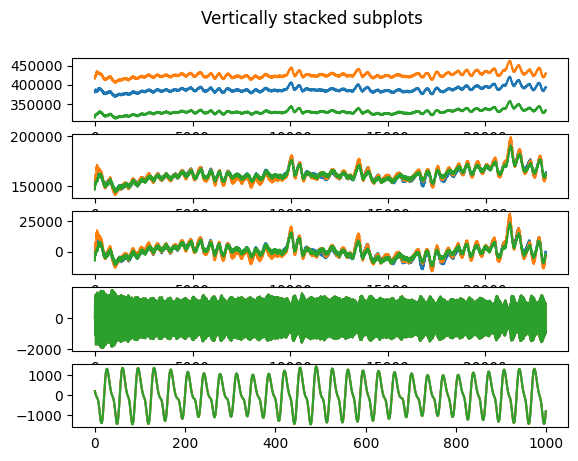

<Figure size 1200x800 with 0 Axes>

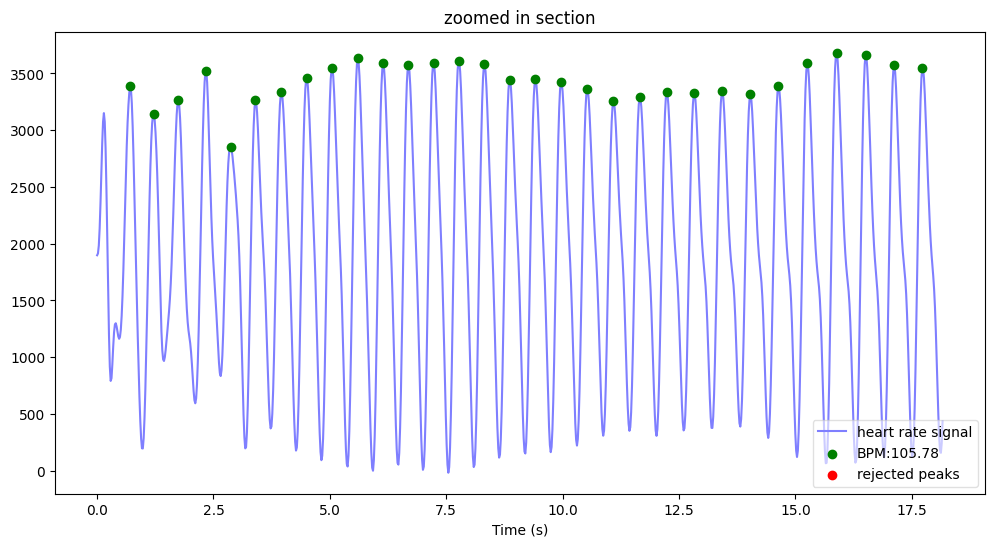

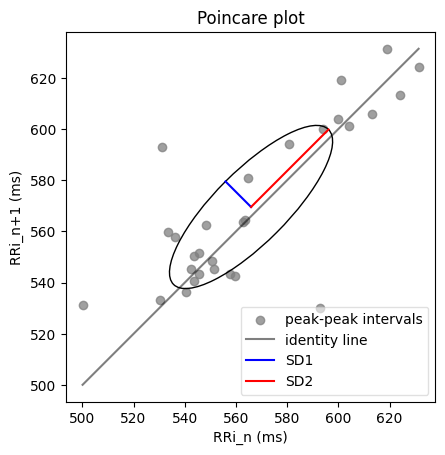

bpm: 105.775446
ibi: 567.239394
sdnn: 32.945781
sdsd: 15.341377
rmssd: 20.292187
pnn20: 0.172414
pnn50: 0.068966
hr_mad: 22.272727
sd1: 14.114452
sd2: 42.802500
s: 1897.942357
sd1/sd2: 0.329758
breathingrate: 0.000000


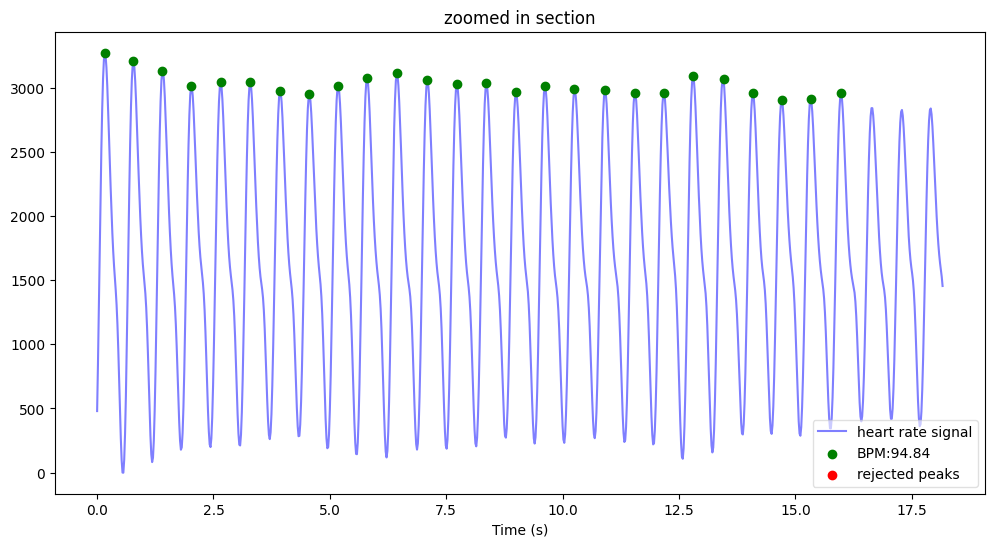

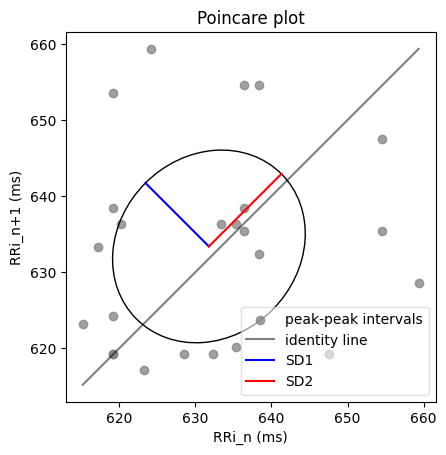

bpm: 94.839577
ibi: 632.647273
sdnn: 13.019891
sdsd: 10.652754
rmssd: 16.760343
pnn20: 0.166667
pnn50: 0.000000
hr_mad: 13.181818
sd1: 11.797329
sd2: 13.482933
s: 499.709884
sd1/sd2: 0.874982
breathingrate: 0.253036


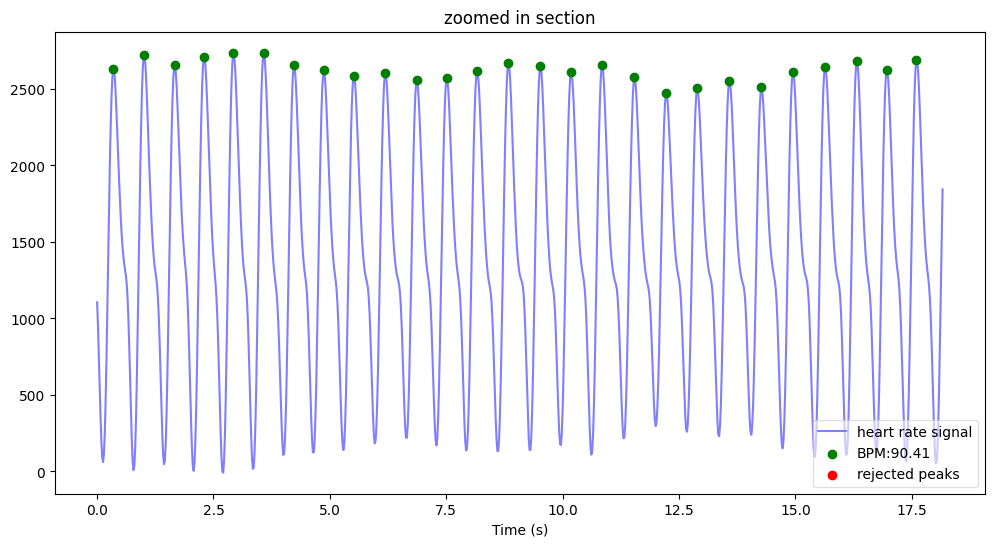

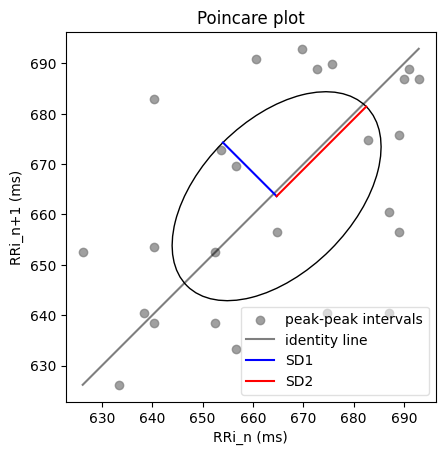

bpm: 90.405719
ibi: 663.674825
sdnn: 20.655288
sdsd: 12.792506
rmssd: 21.342419
pnn20: 0.360000
pnn50: 0.000000
hr_mad: 22.272727
sd1: 15.072936
sd2: 25.169870
s: 1191.869452
sd1/sd2: 0.598848
breathingrate: 0.348048


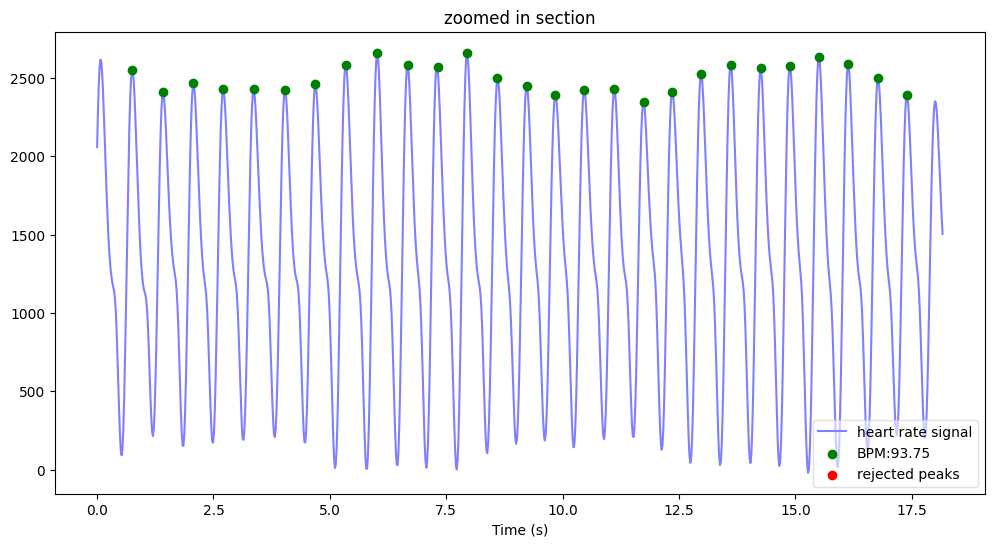

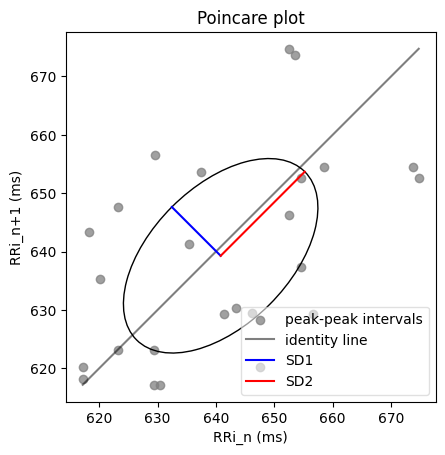

bpm: 93.747951
ibi: 640.013986
sdnn: 16.774953
sdsd: 8.706791
rmssd: 16.790277
pnn20: 0.320000
pnn50: 0.000000
hr_mad: 14.681818
sd1: 11.822829
sd2: 20.368671
s: 756.543598
sd1/sd2: 0.580442
breathingrate: 0.360794


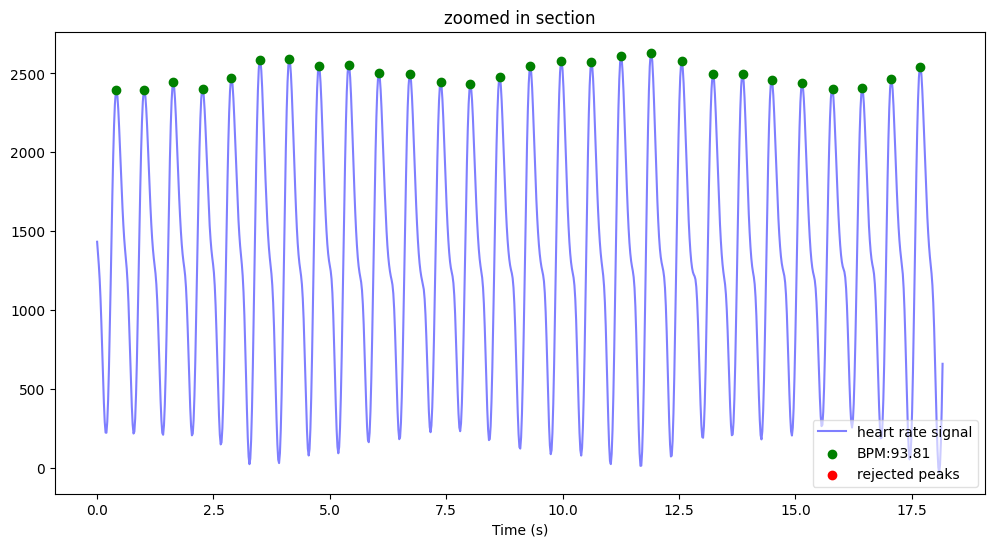

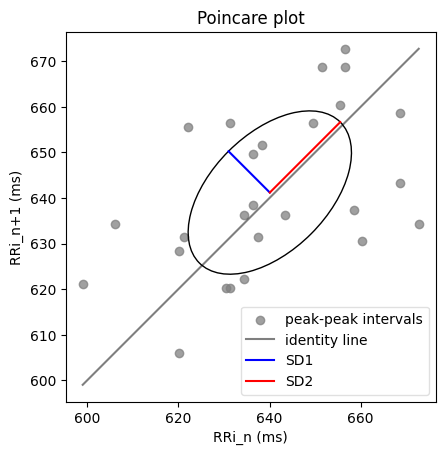

bpm: 93.805766
ibi: 639.619529
sdnn: 18.528150
sdsd: 9.580520
rmssd: 18.156477
pnn20: 0.307692
pnn50: 0.000000
hr_mad: 15.181818
sd1: 12.813707
sd2: 21.859556
s: 879.966209
sd1/sd2: 0.586183
breathingrate: 0.347645
(H)027_20230506_103109_Verity.csv
인덱스 길이: 23161


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


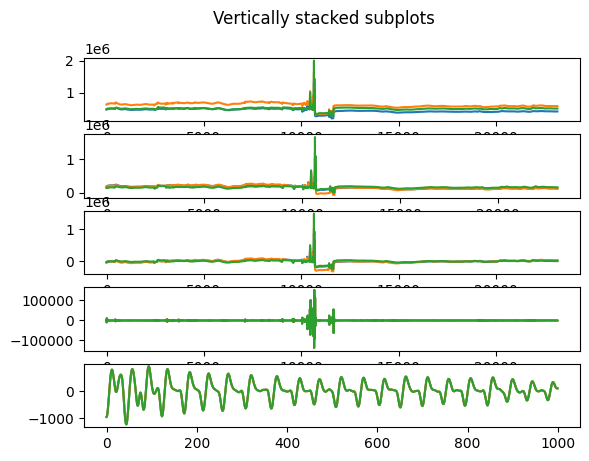

<Figure size 1200x800 with 0 Axes>

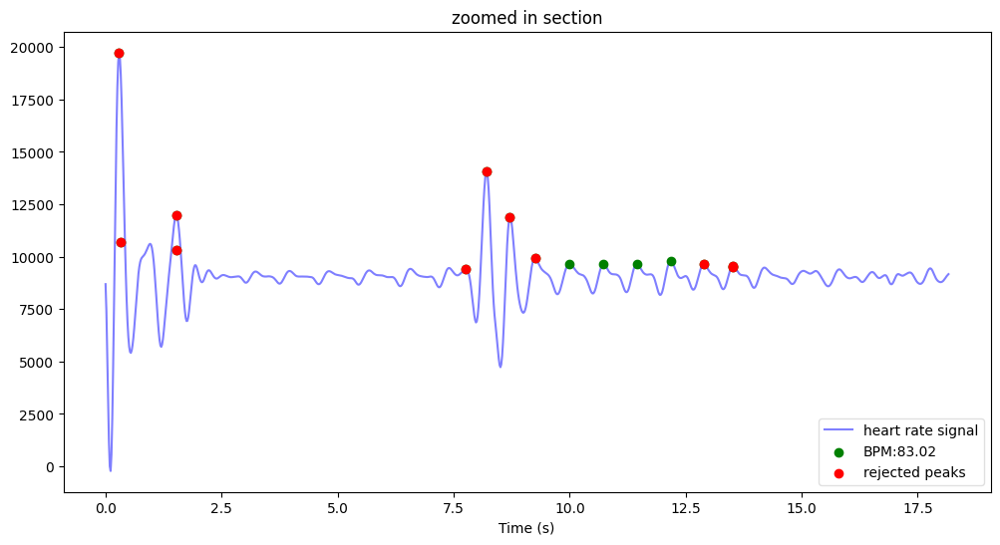

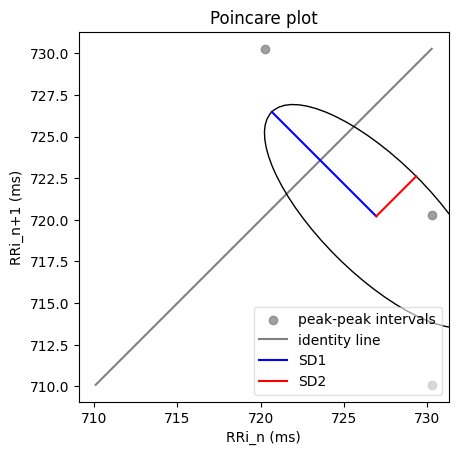

bpm: 83.018868
ibi: 722.727273
sdnn: 8.360177
sdsd: 4.799755
rmssd: 14.227975
pnn20: 0.333333
pnn50: 0.000000
hr_mad: 5.000000
sd1: 8.865074
sd2: 3.393939
s: 94.522741
sd1/sd2: 2.612031
breathingrate: 0.346021


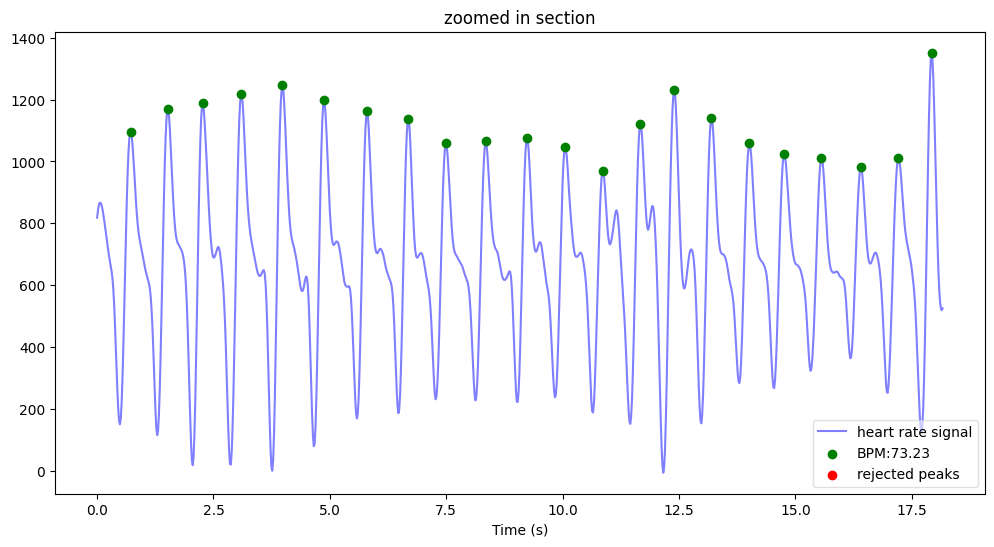

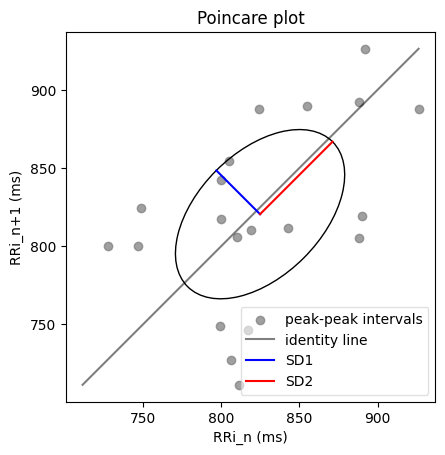

bpm: 73.230269
ibi: 819.333333
sdnn: 55.681512
sdsd: 27.041808
rmssd: 56.185602
pnn20: 0.800000
pnn50: 0.500000
hr_mad: 31.181818
sd1: 39.607461
sd2: 65.615057
s: 8164.514865
sd1/sd2: 0.603634
breathingrate: 0.232599


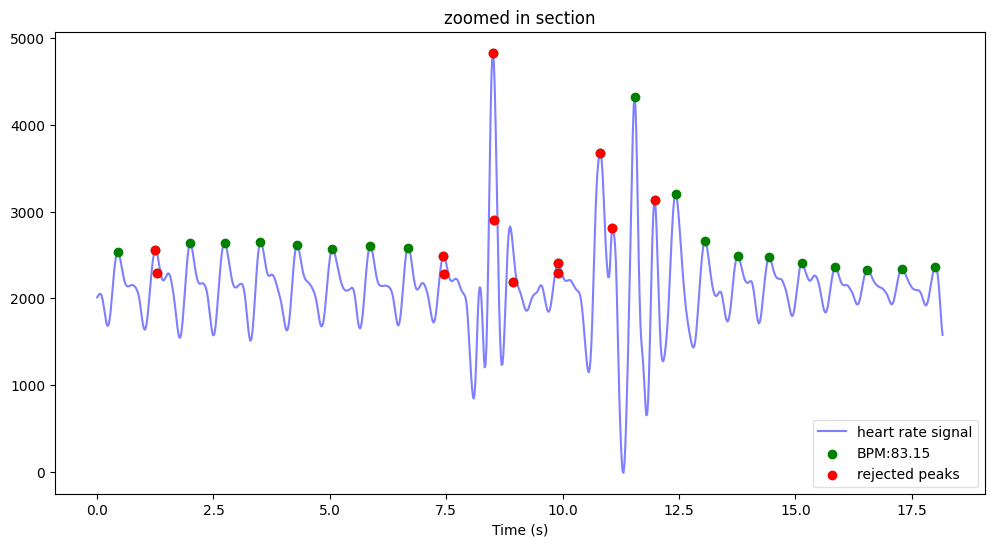

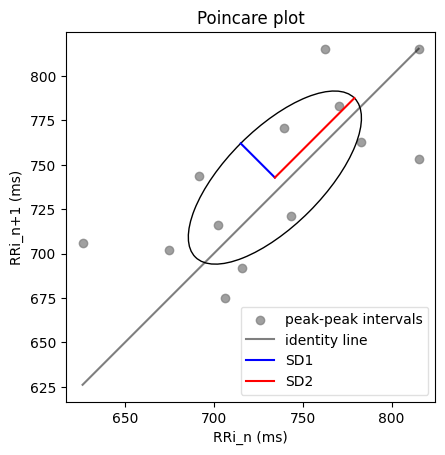

bpm: 83.151763
ibi: 721.572193
sdnn: 88.641192
sdsd: 21.540471
rmssd: 39.367036
pnn20: 0.769231
pnn50: 0.307692
hr_mad: 37.363636
sd1: 27.196915
sd2: 63.259628
s: 5405.005739
sd1/sd2: 0.429925
breathingrate: 0.244698


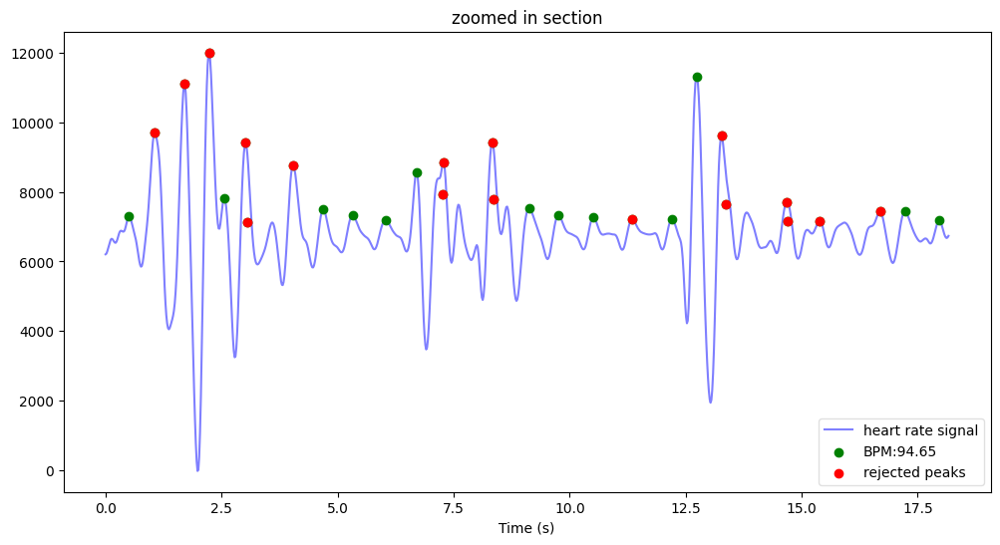

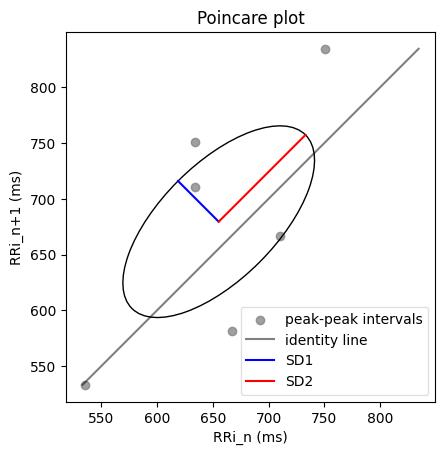

bpm: 94.647403
ibi: 633.931818
sdnn: 103.932645
sdsd: 36.185130
rmssd: 76.787675
pnn20: 0.833333
pnn50: 0.666667
hr_mad: 86.500000
sd1: 51.534390
sd2: 109.975559
s: 17805.049783
sd1/sd2: 0.468599
breathingrate: 0.263089


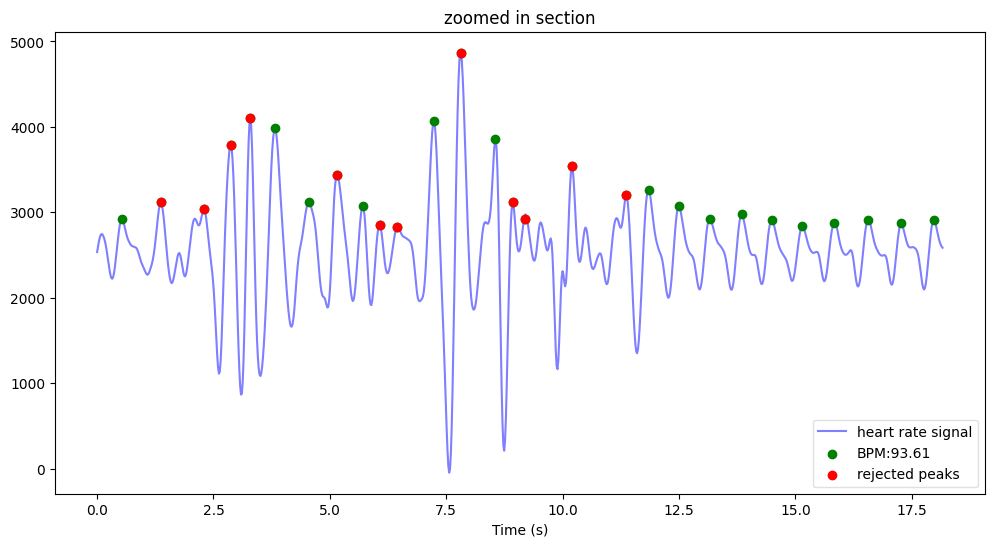

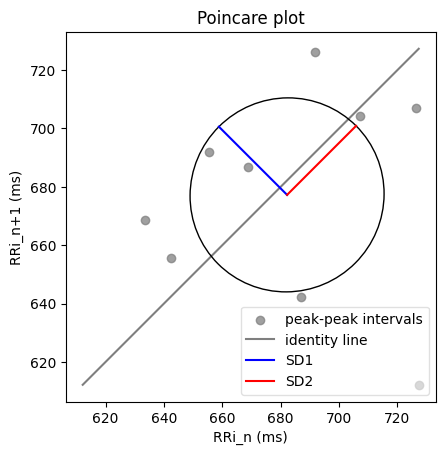

bpm: 93.611710
ibi: 640.945455
sdnn: 122.067902
sdsd: 30.802609
rmssd: 46.966217
pnn20: 0.555556
pnn50: 0.111111
hr_mad: 38.363636
sd1: 33.025203
sd2: 33.428420
s: 3468.256508
sd1/sd2: 0.987938
breathingrate: 0.208182
(H)028_20230506_103256_Verity.csv
인덱스 길이: 23045


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


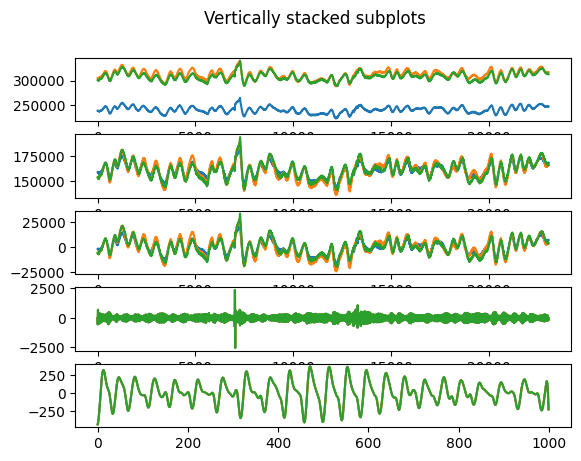

<Figure size 1200x800 with 0 Axes>

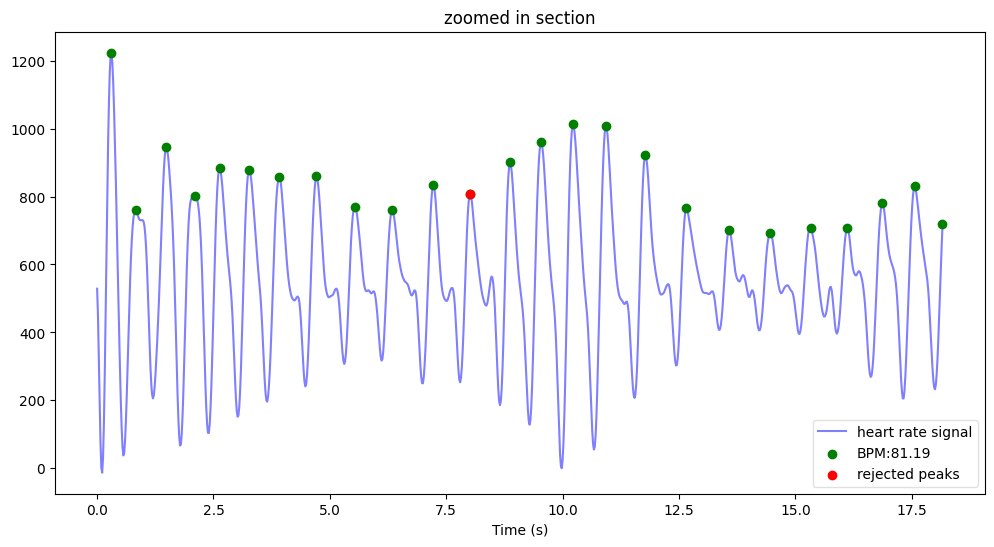

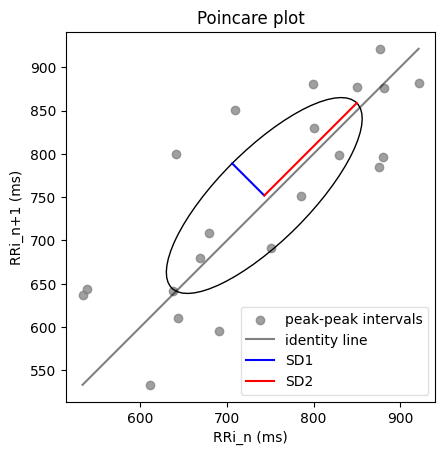

bpm: 81.186022
ibi: 739.043478
sdnn: 115.043356
sdsd: 42.655667
rmssd: 74.608510
pnn20: 0.857143
pnn50: 0.476190
hr_mad: 107.727273
sd1: 52.390395
sd2: 150.981998
s: 24850.018375
sd1/sd2: 0.346998
breathingrate: 0.176616


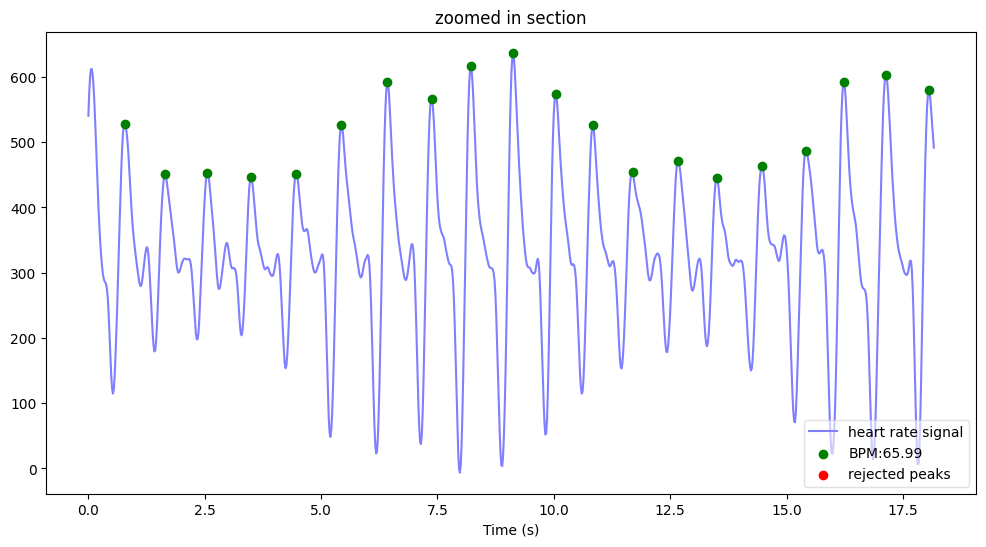

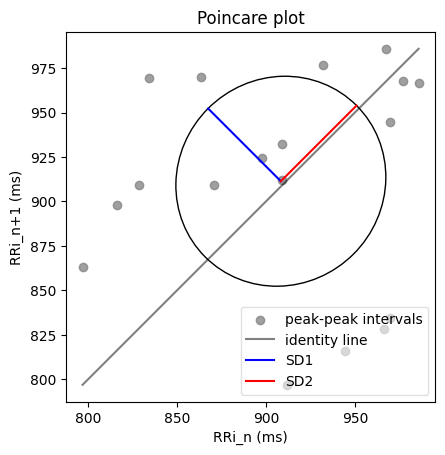

bpm: 65.988539
ibi: 909.248804
sdnn: 57.834097
sdsd: 47.823695
rmssd: 81.812281
pnn20: 0.777778
pnn50: 0.500000
hr_mad: 54.363636
sd1: 57.811764
sd2: 60.156065
s: 10925.605566
sd1/sd2: 0.961030
breathingrate: 0.347484


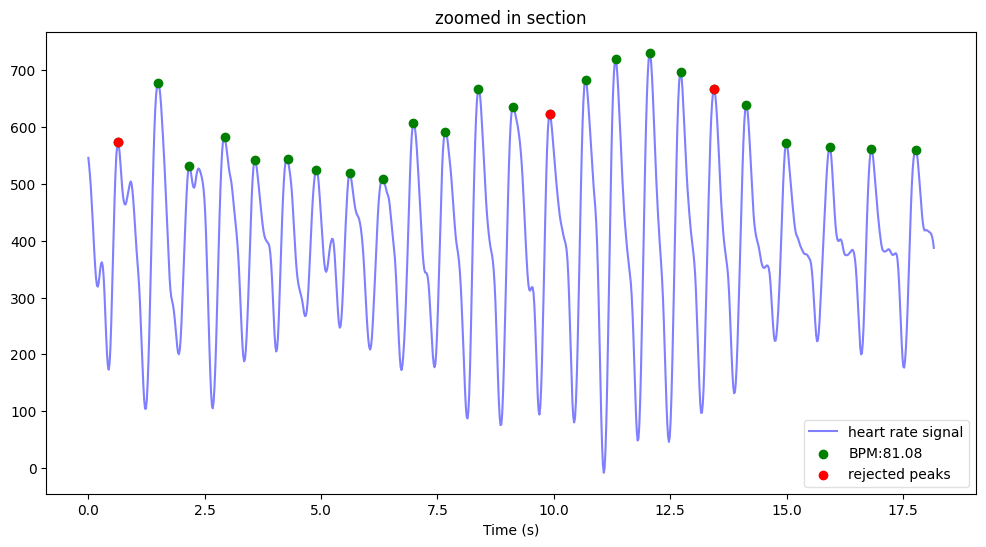

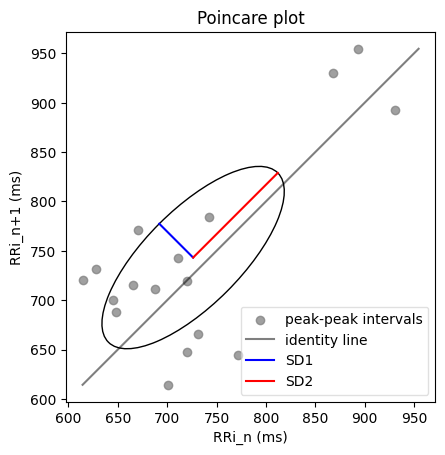

bpm: 81.079089
ibi: 740.018182
sdnn: 96.902313
sdsd: 32.549635
rmssd: 70.579410
pnn20: 0.941176
pnn50: 0.588235
hr_mad: 52.863636
sd1: 48.452837
sd2: 121.255993
s: 18457.475423
sd1/sd2: 0.399591
breathingrate: 0.202853


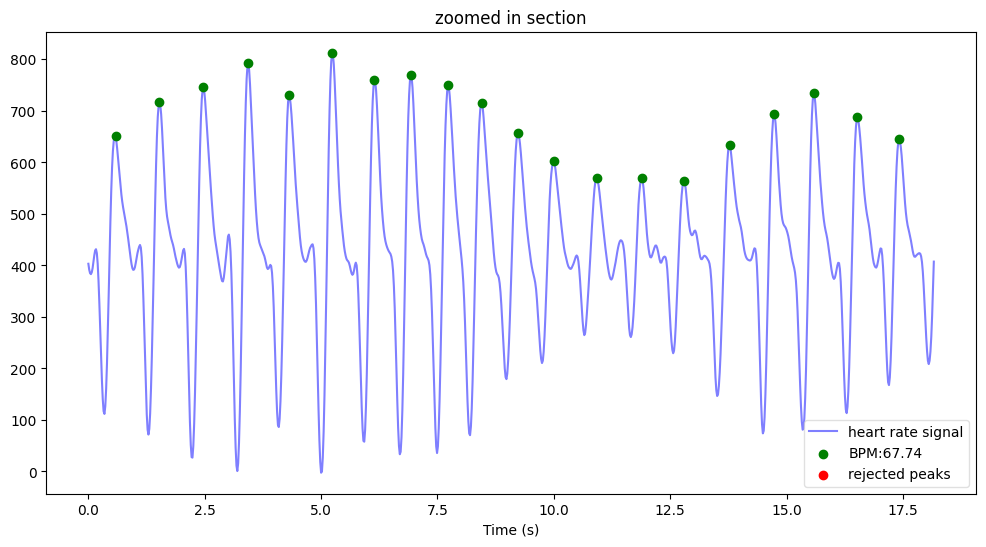

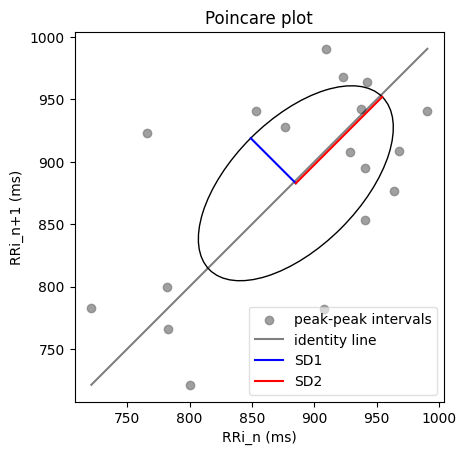

bpm: 67.742040
ibi: 885.712919
sdnn: 76.563655
sdsd: 38.910541
rmssd: 72.362025
pnn20: 0.833333
pnn50: 0.611111
hr_mad: 33.363636
sd1: 51.140141
sd2: 97.963996
s: 15739.041563
sd1/sd2: 0.522030
breathingrate: 0.118913


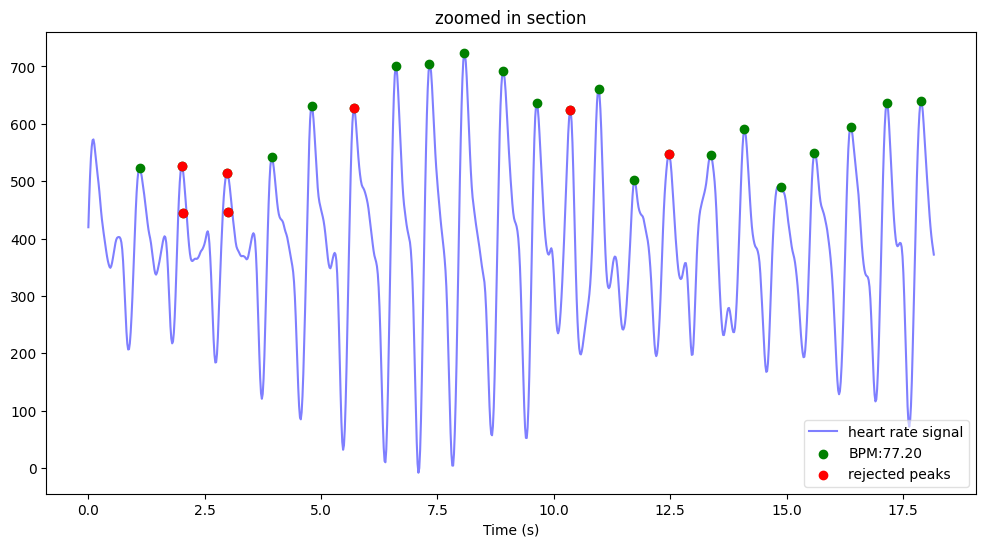

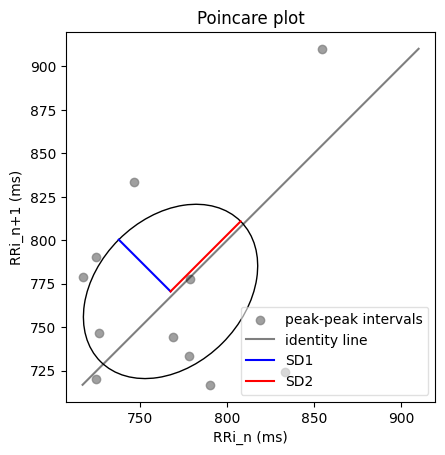

bpm: 77.204270
ibi: 777.159091
sdnn: 60.070306
sdsd: 32.918460
rmssd: 59.642675
pnn20: 0.818182
pnn50: 0.545455
hr_mad: 33.000000
sd1: 42.116461
sd2: 57.016217
s: 7543.973289
sd1/sd2: 0.738675
breathingrate: 0.402317
(H)029_20230506_110428_Verity.csv
인덱스 길이: 23031
안됨


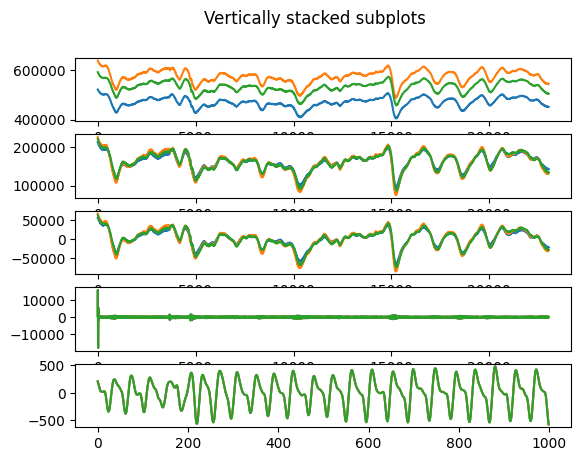

<Figure size 1200x800 with 0 Axes>

(H)030_20230506_111835_Verity.csv
인덱스 길이: 23337


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


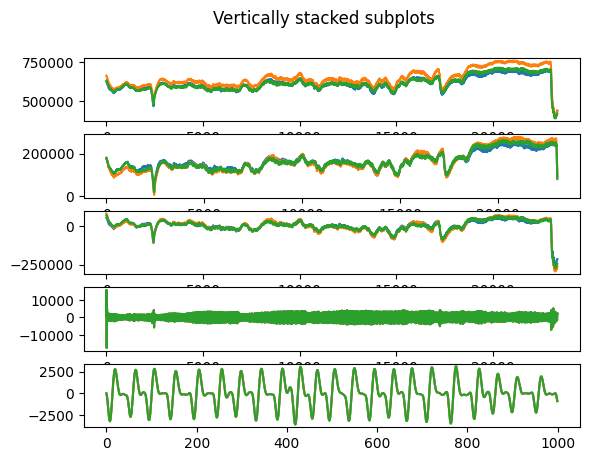

<Figure size 1200x800 with 0 Axes>

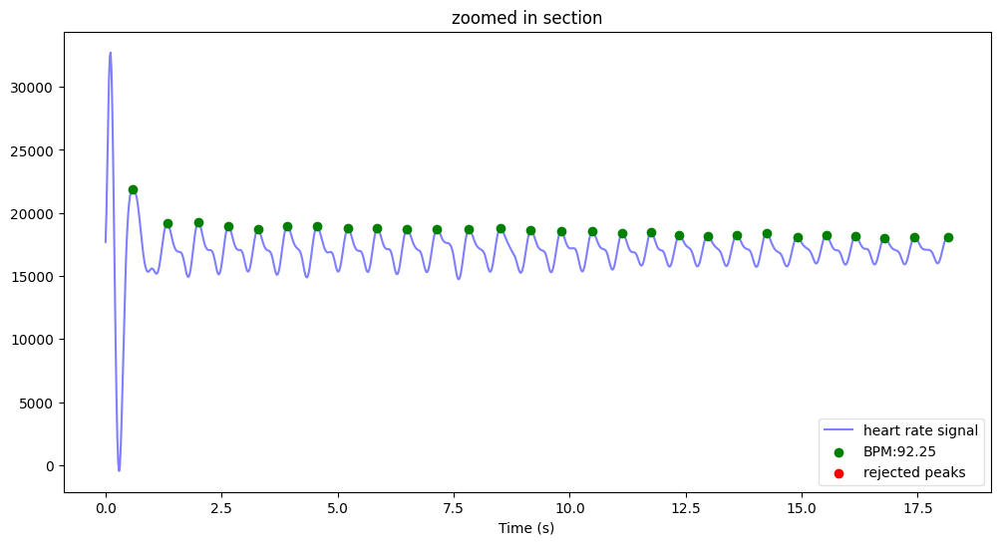

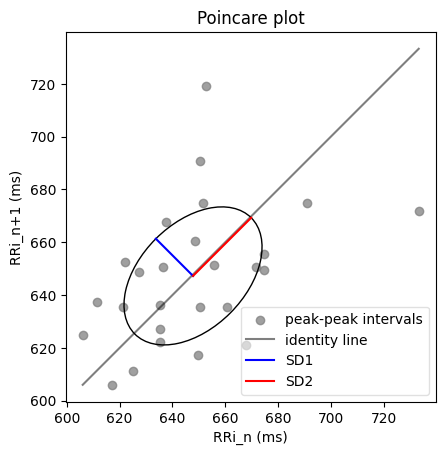

bpm: 92.247484
ibi: 650.424242
sdnn: 29.679556
sdsd: 15.510247
rmssd: 28.165775
pnn20: 0.500000
pnn50: 0.076923
hr_mad: 18.181818
sd1: 19.912475
sd2: 31.153345
s: 1948.856288
sd1/sd2: 0.639176
breathingrate: 0.113960


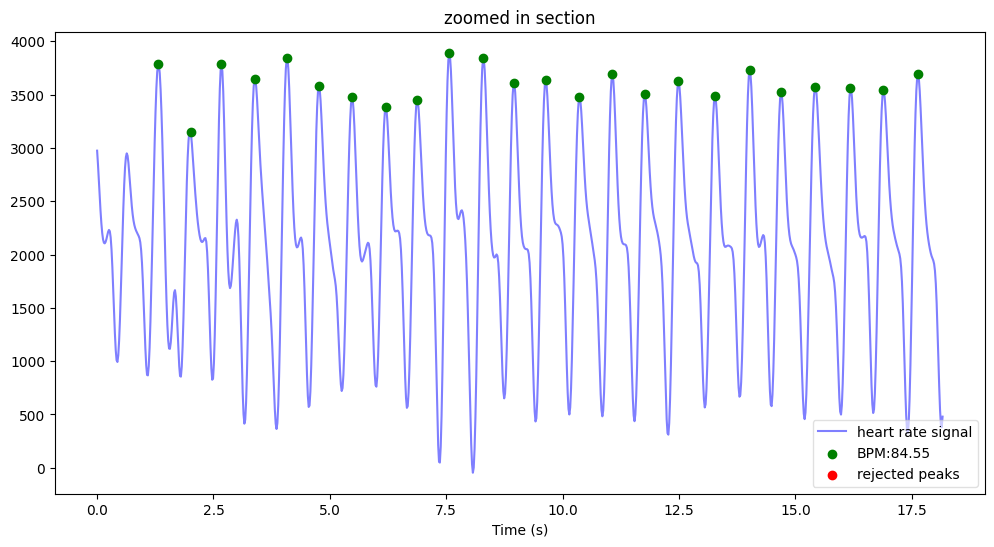

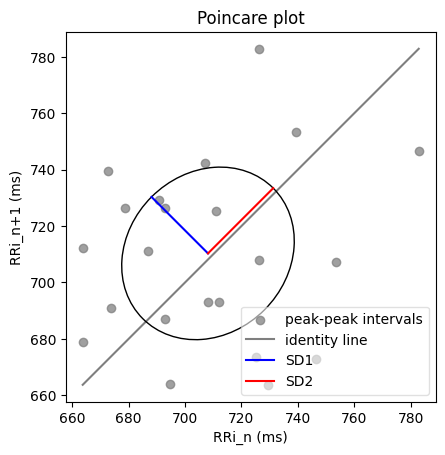

bpm: 84.552230
ibi: 709.620553
sdnn: 30.397967
sdsd: 19.242861
rmssd: 40.082349
pnn20: 0.636364
pnn50: 0.227273
hr_mad: 21.181818
sd1: 28.300956
sd2: 32.701082
s: 2907.455735
sd1/sd2: 0.865444
breathingrate: 0.367895


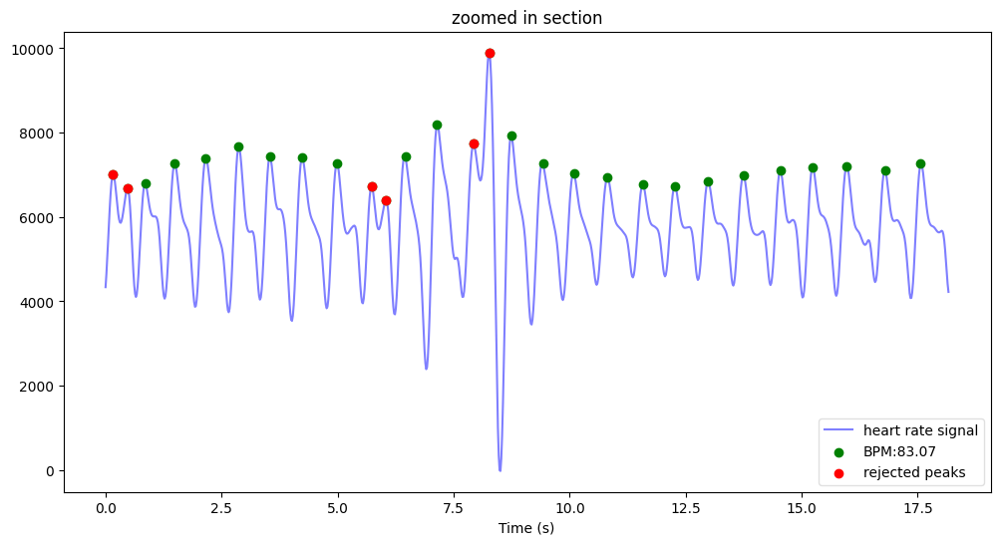

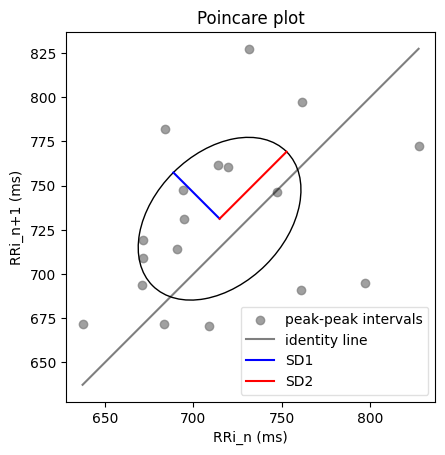

bpm: 83.070616
ibi: 722.277056
sdnn: 47.684970
sdsd: 27.622834
rmssd: 54.773350
pnn20: 0.888889
pnn50: 0.333333
hr_mad: 33.363636
sd1: 36.945001
sd2: 53.564669
s: 6217.044536
sd1/sd2: 0.689727
breathingrate: 0.395883


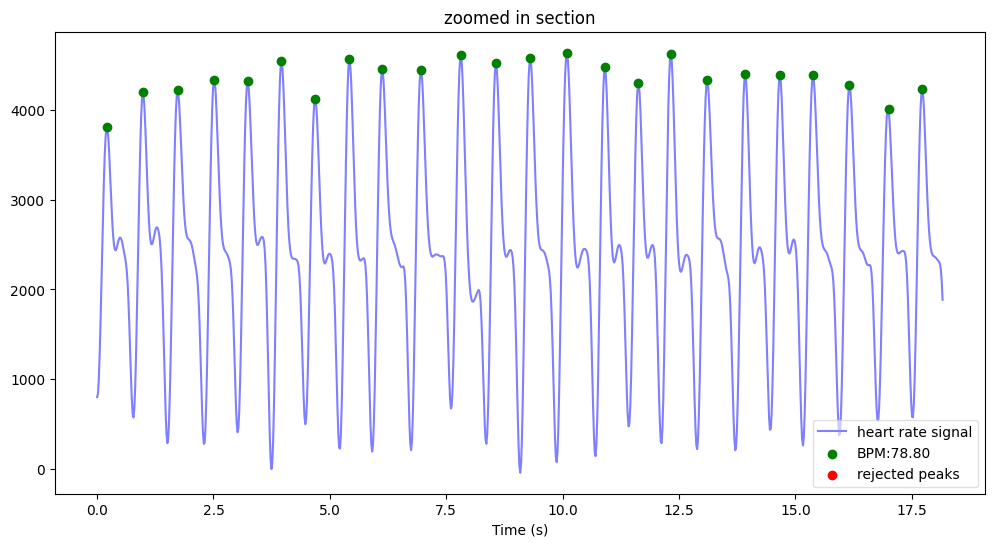

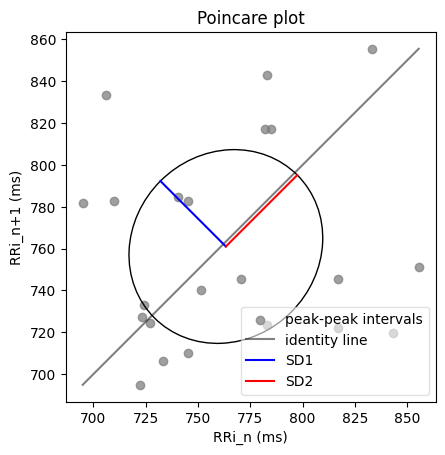

bpm: 78.798198
ibi: 761.438735
sdnn: 45.758766
sdsd: 36.785260
rmssd: 62.624293
pnn20: 0.818182
pnn50: 0.409091
hr_mad: 35.363636
sd1: 44.251495
sd2: 48.291846
s: 6713.540721
sd1/sd2: 0.916335
breathingrate: 0.285665


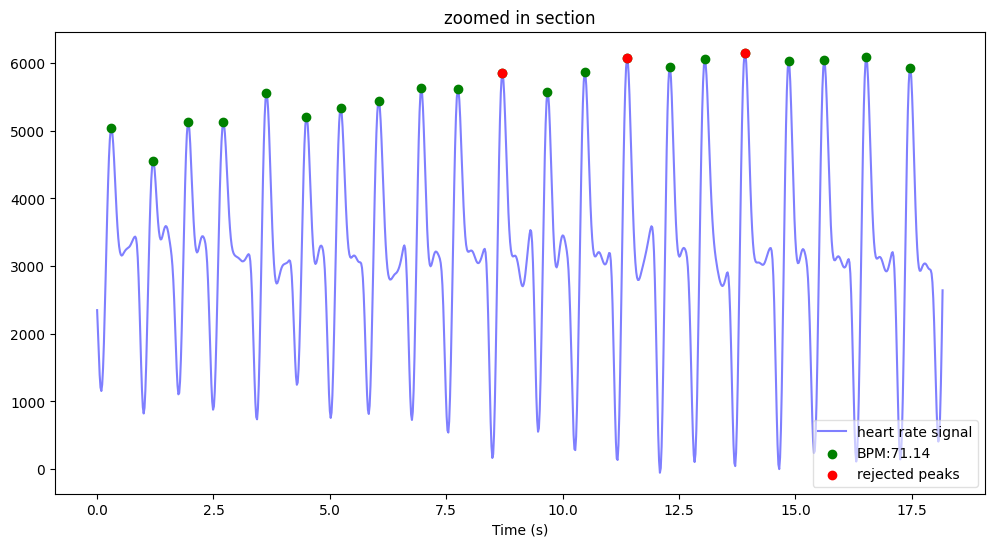

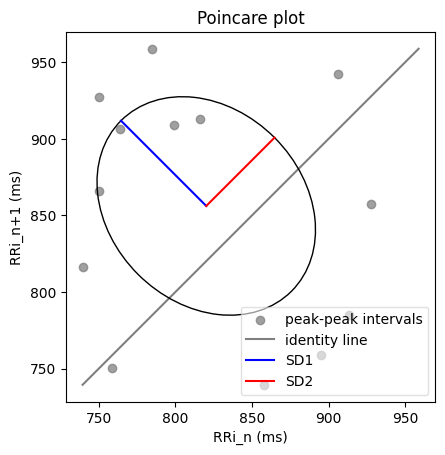

bpm: 71.142335
ibi: 843.379679
sdnn: 74.499668
sdsd: 47.449111
rmssd: 116.908164
pnn20: 0.923077
pnn50: 0.846154
hr_mad: 69.727273
sd1: 78.651199
sd2: 63.008661
s: 15568.811749
sd1/sd2: 1.248260
breathingrate: 0.139577
(H)031_20230506_115214_Verity.csv
인덱스 길이: 23114


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


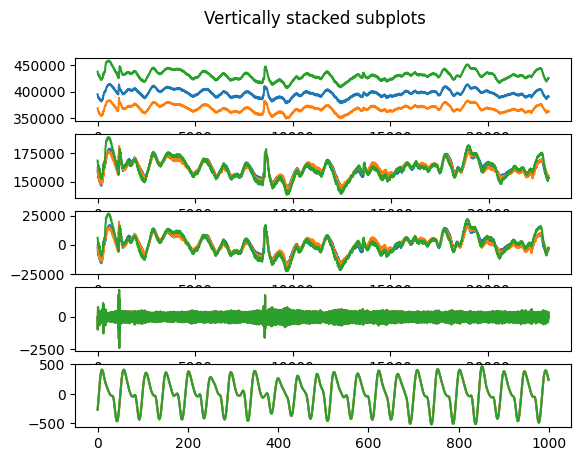

<Figure size 1200x800 with 0 Axes>

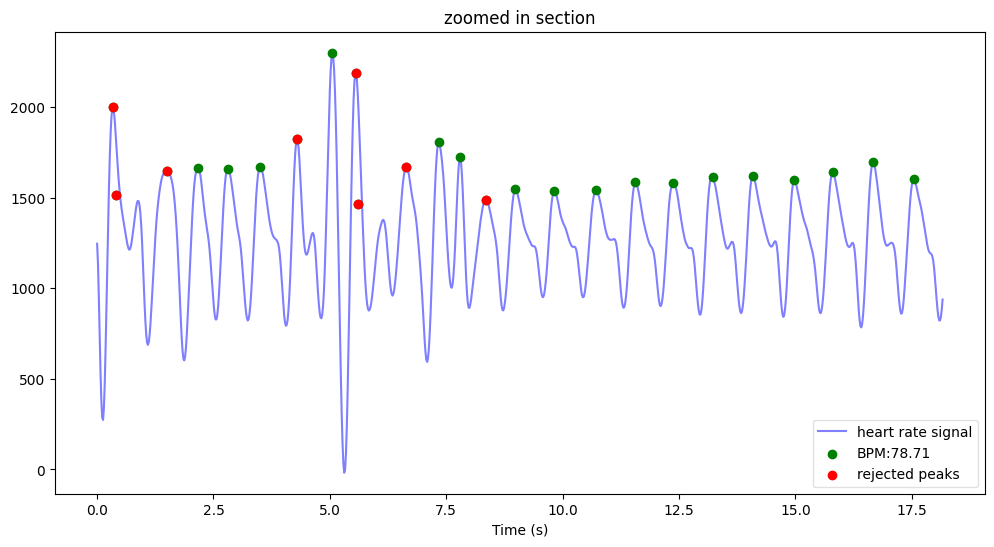

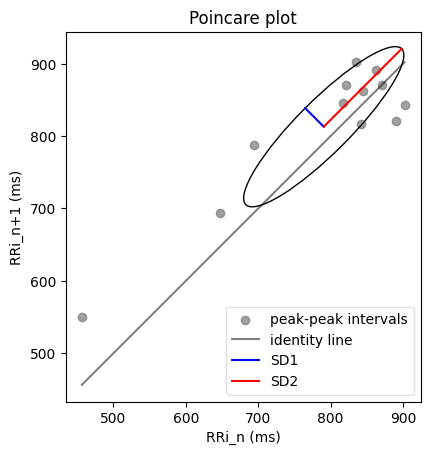

bpm: 78.707879
ibi: 762.312500
sdnn: 141.285194
sdsd: 28.462131
rmssd: 56.006192
pnn20: 0.833333
pnn50: 0.416667
hr_mad: 42.454545
sd1: 36.277725
sd2: 152.192461
s: 17345.349446
sd1/sd2: 0.238367
breathingrate: 0.246124


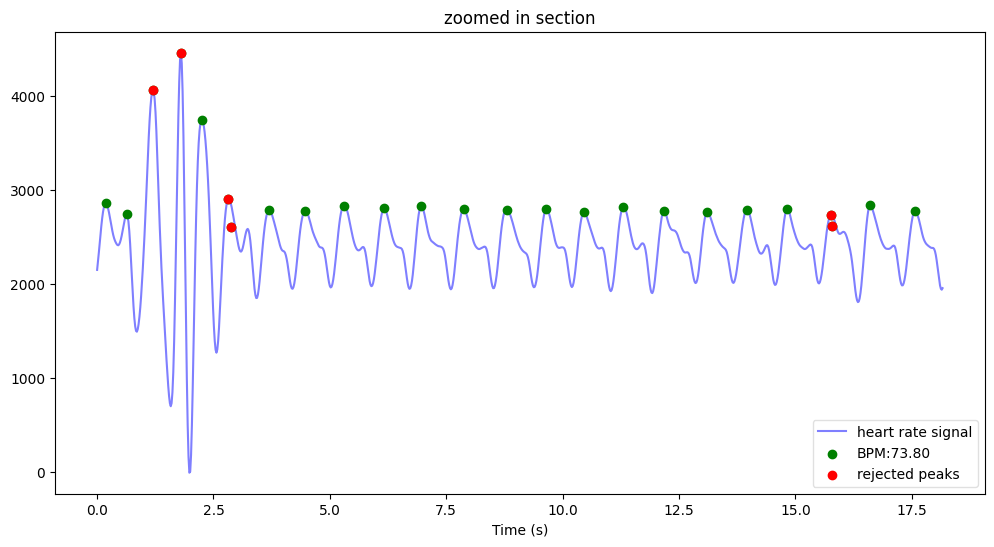

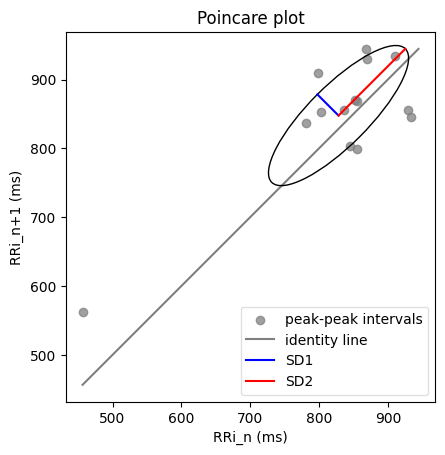

bpm: 73.798904
ibi: 813.020202
sdnn: 137.776314
sdsd: 30.753113
rmssd: 64.418592
pnn20: 0.785714
pnn50: 0.571429
hr_mad: 55.545455
sd1: 43.465890
sd2: 137.212596
s: 18736.671110
sd1/sd2: 0.316778
breathingrate: 0.273523


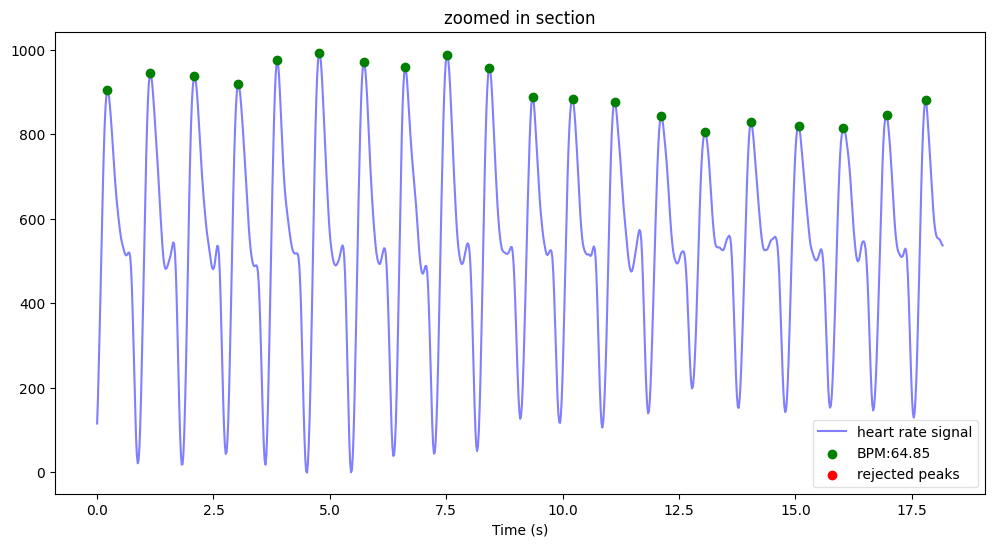

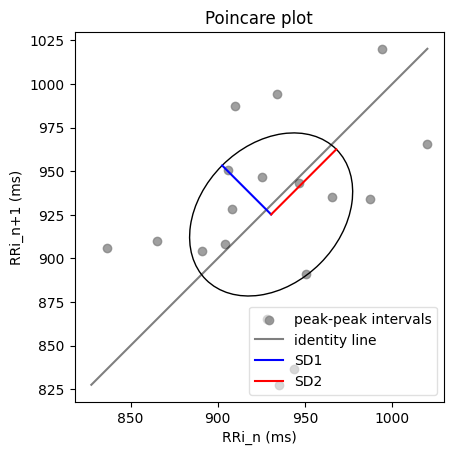

bpm: 64.850776
ibi: 925.200957
sdnn: 48.319399
sdsd: 30.170896
rmssd: 56.434051
pnn20: 0.833333
pnn50: 0.500000
hr_mad: 22.181818
sd1: 39.719799
sd2: 52.839751
s: 6593.525280
sd1/sd2: 0.751703
breathingrate: 0.284544


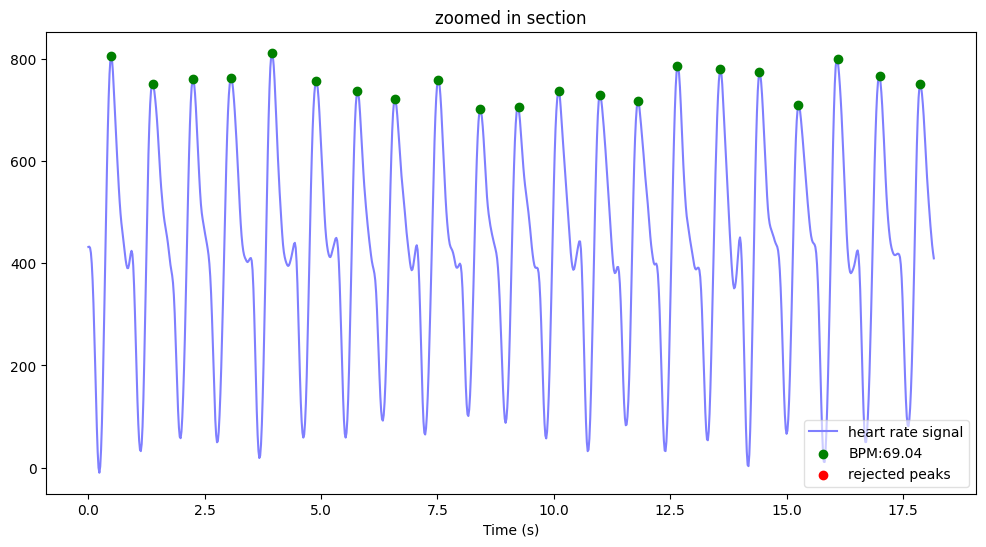

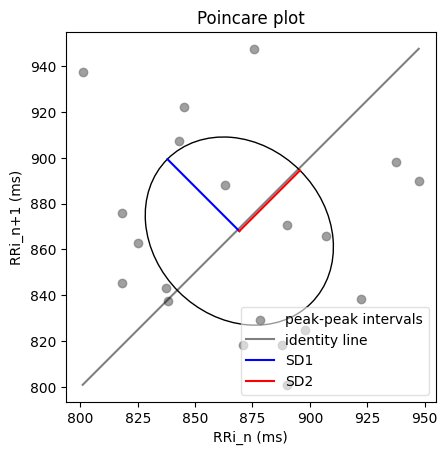

bpm: 69.037657
ibi: 869.090909
sdnn: 40.113661
sdsd: 31.636172
rmssd: 62.716877
pnn20: 0.842105
pnn50: 0.578947
hr_mad: 29.772727
sd1: 44.338534
sd2: 37.377985
s: 5206.514555
sd1/sd2: 1.186221
breathingrate: 0.345383


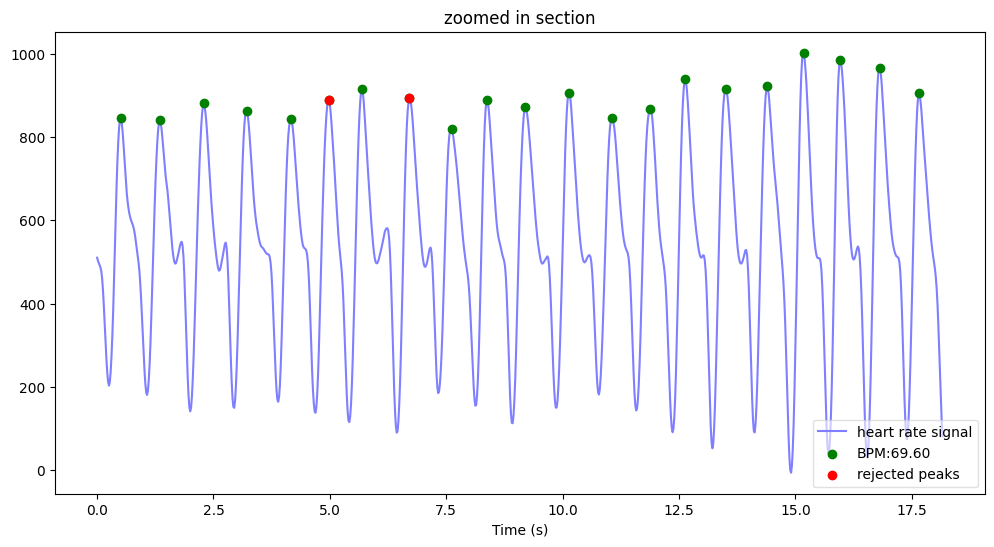

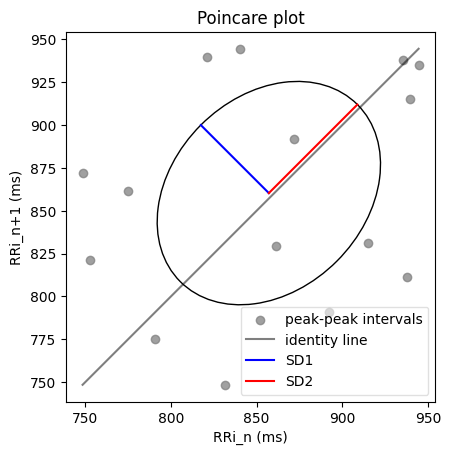

bpm: 69.599044
ibi: 862.080808
sdnn: 73.361483
sdsd: 43.320392
rmssd: 79.429137
pnn20: 0.800000
pnn50: 0.600000
hr_mad: 62.227273
sd1: 56.120143
sd2: 73.045564
s: 12878.417212
sd1/sd2: 0.768290
breathingrate: 0.257898
(H)032_20230506_110936_Verity.csv
인덱스 길이: 23146


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


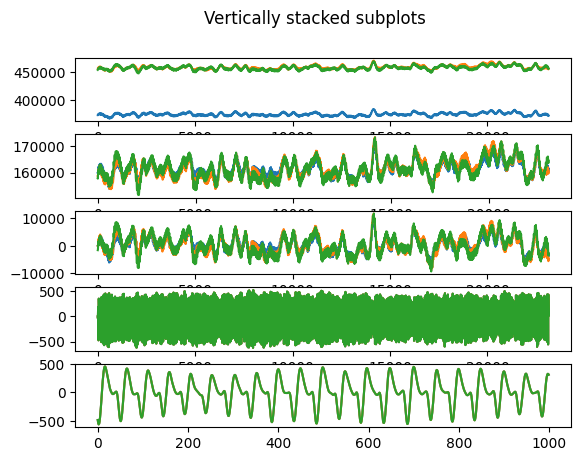

<Figure size 1200x800 with 0 Axes>

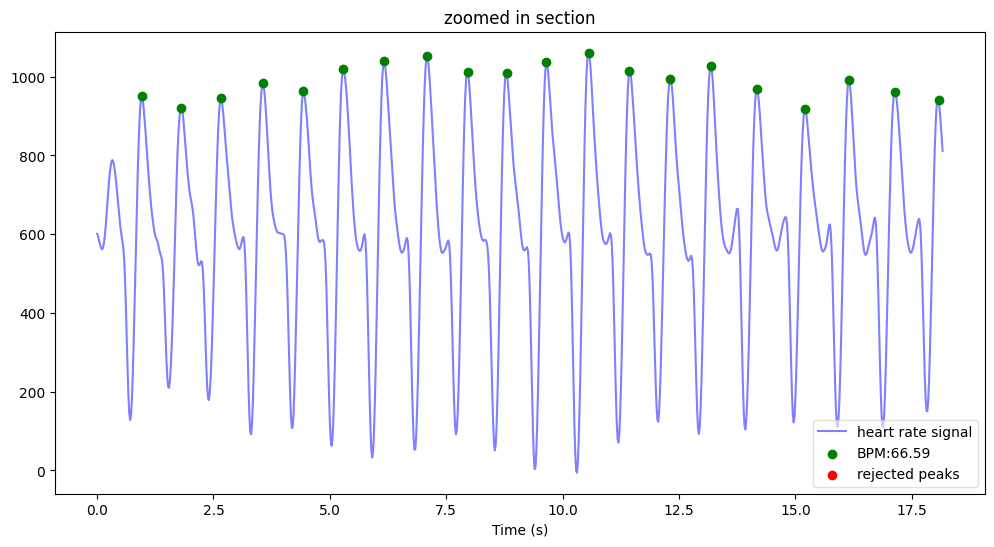

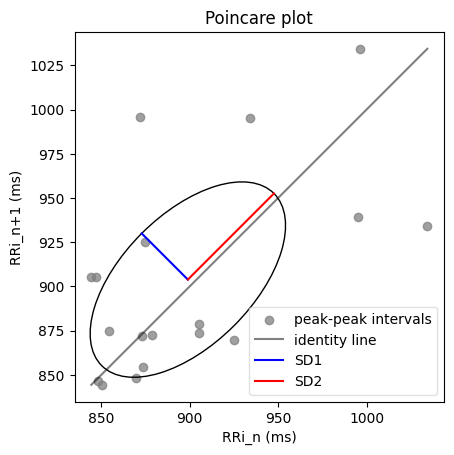

bpm: 66.589139
ibi: 901.047847
sdnn: 54.790727
sdsd: 32.688738
rmssd: 52.428289
pnn20: 0.722222
pnn50: 0.444444
hr_mad: 28.000000
sd1: 36.908854
sd2: 68.854233
s: 7983.826259
sd1/sd2: 0.536043
breathingrate: 0.233768


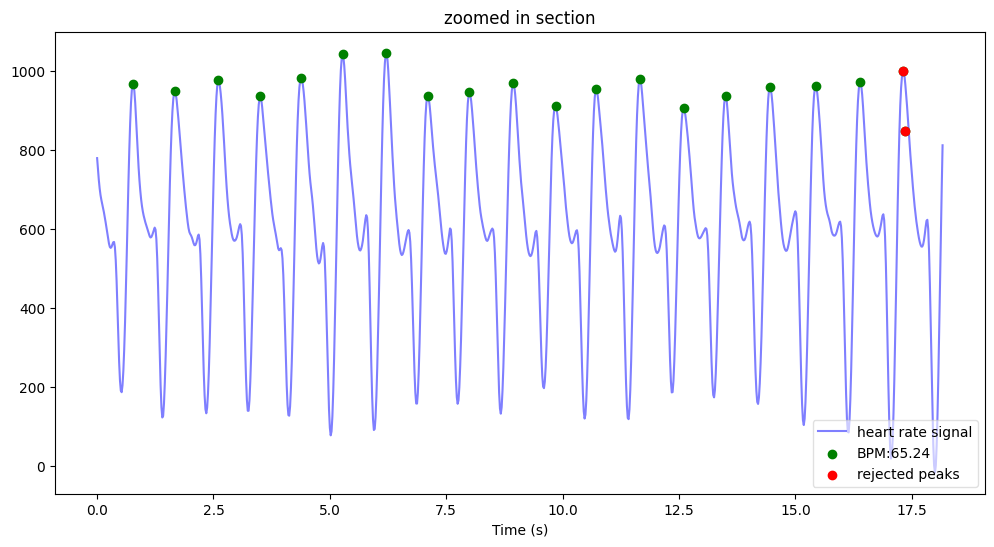

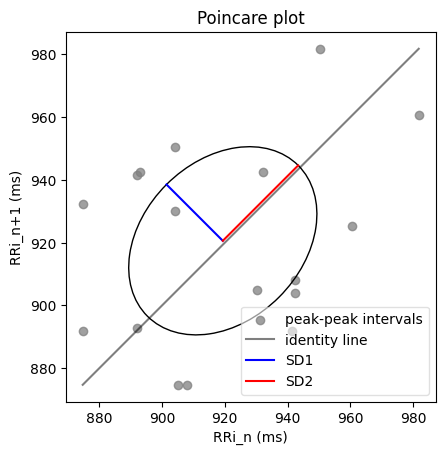

bpm: 65.238521
ibi: 919.702020
sdnn: 29.281208
sdsd: 14.731604
rmssd: 35.904664
pnn20: 0.823529
pnn50: 0.058824
hr_mad: 24.772727
sd1: 25.373139
sd2: 33.981460
s: 2708.732473
sd1/sd2: 0.746676
breathingrate: 0.302188


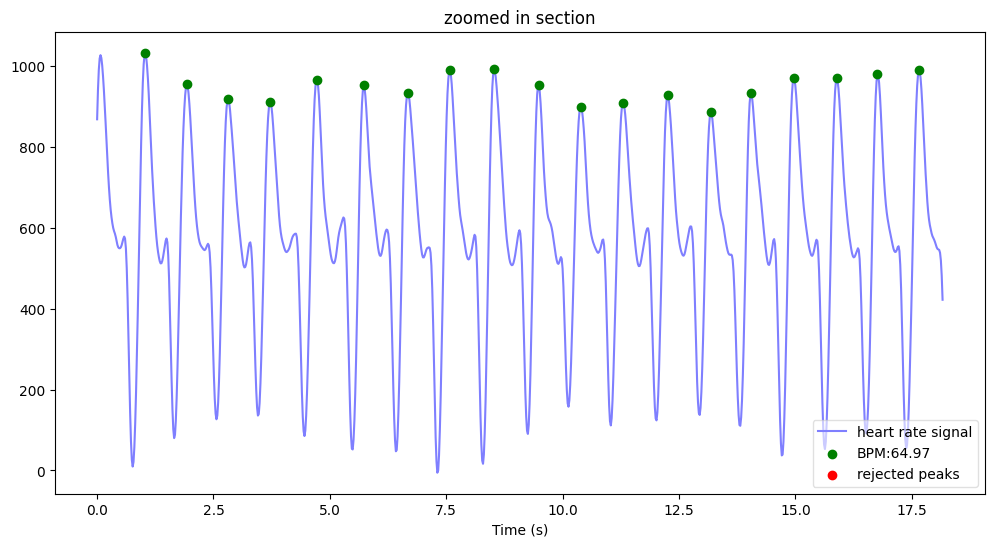

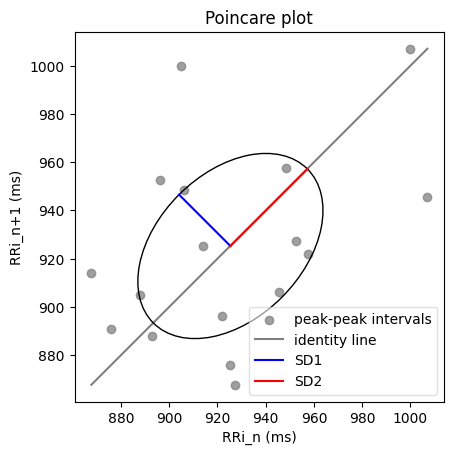

bpm: 64.973420
ibi: 923.454545
sdnn: 38.065805
sdsd: 23.725674
rmssd: 42.580702
pnn20: 0.647059
pnn50: 0.235294
hr_mad: 27.272727
sd1: 30.108988
sd2: 45.142524
s: 4270.039296
sd1/sd2: 0.666976
breathingrate: 0.300969


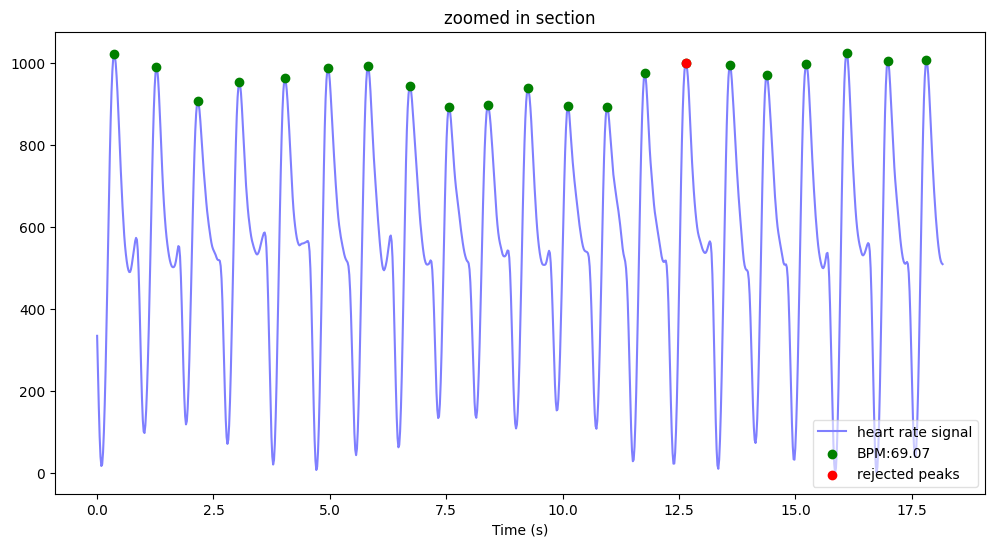

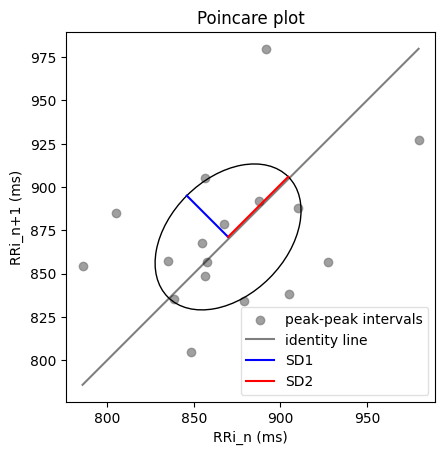

bpm: 69.065414
ibi: 868.741627
sdnn: 43.073677
sdsd: 28.673662
rmssd: 47.676999
pnn20: 0.647059
pnn50: 0.352941
hr_mad: 23.181818
sd1: 33.698720
sd2: 49.138010
s: 5202.125681
sd1/sd2: 0.685797
breathingrate: 0.363747


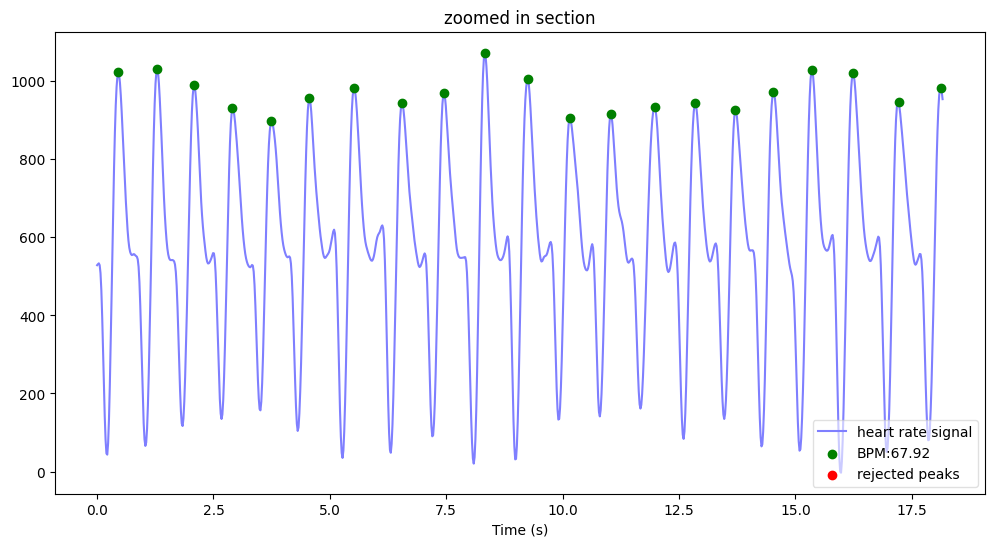

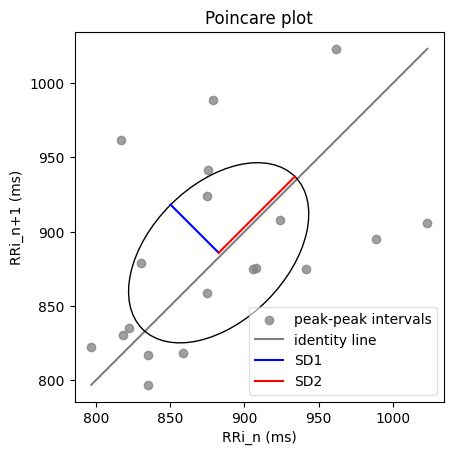

bpm: 67.924295
ibi: 883.336364
sdnn: 59.652535
sdsd: 37.704361
rmssd: 64.755024
pnn20: 0.736842
pnn50: 0.368421
hr_mad: 42.363636
sd1: 45.734402
sd2: 72.556126
s: 10424.781529
sd1/sd2: 0.630331
breathingrate: 0.169885
(H)033_20230506_113121_Verity.csv
인덱스 길이: 23087


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


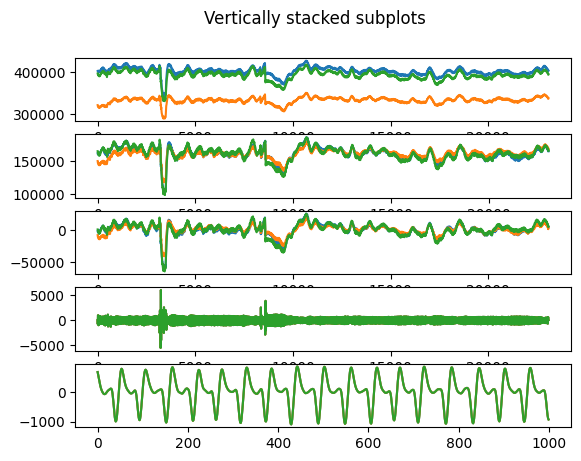

<Figure size 1200x800 with 0 Axes>

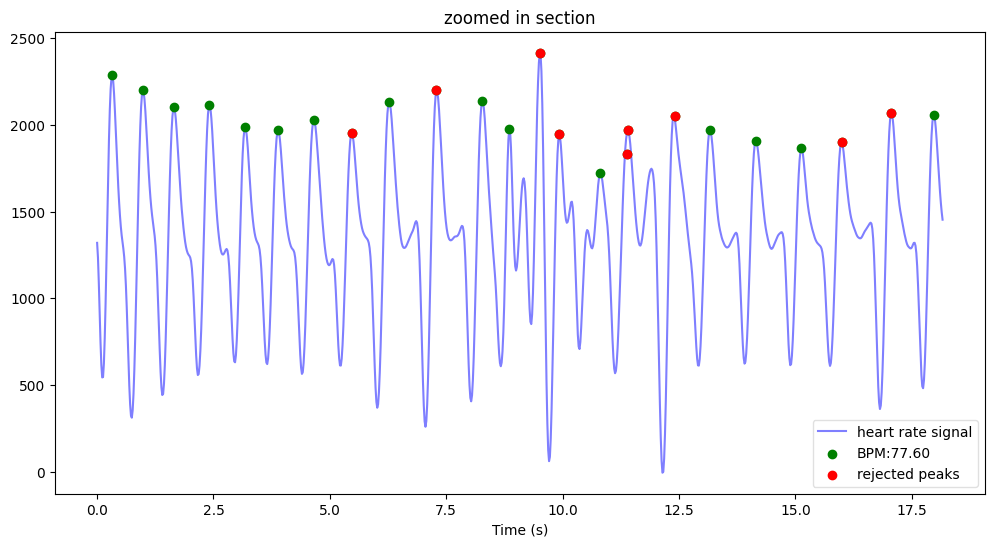

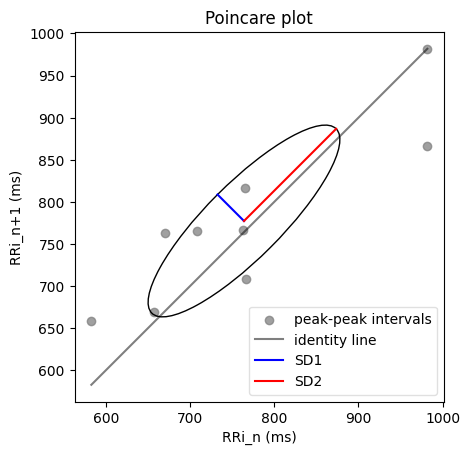

bpm: 77.604018
ibi: 773.155844
sdnn: 139.080563
sdsd: 37.838786
rmssd: 64.179372
pnn20: 0.666667
pnn50: 0.666667
hr_mad: 104.090909
sd1: 44.403616
sd2: 154.773789
s: 21590.645650
sd1/sd2: 0.286894
breathingrate: 0.184911


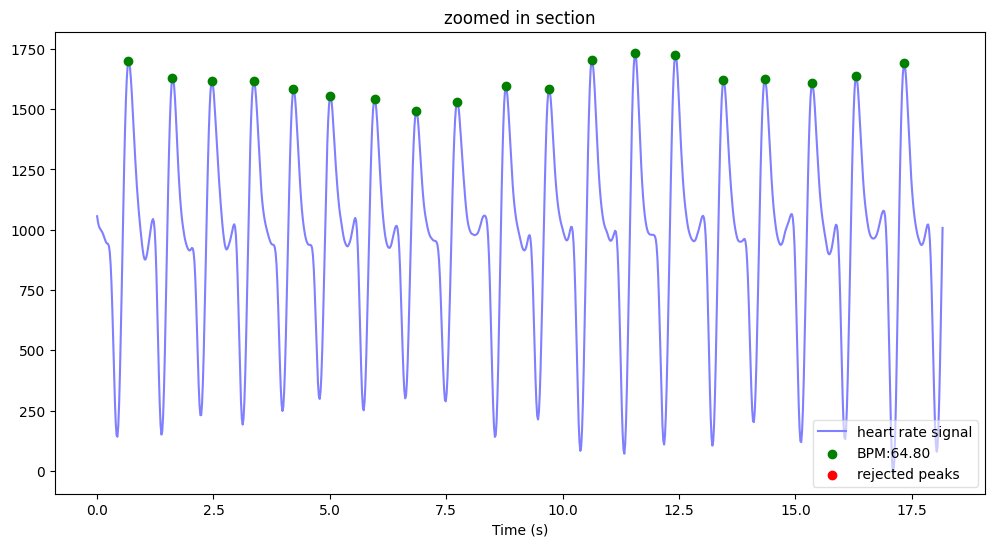

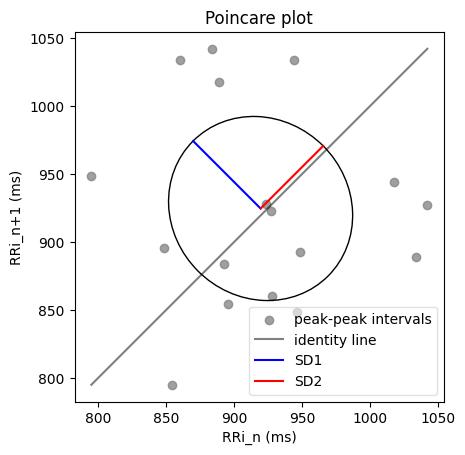

bpm: 64.795877
ibi: 925.984848
sdnn: 68.515542
sdsd: 53.500970
rmssd: 99.523285
pnn20: 0.823529
pnn50: 0.705882
hr_mad: 38.863636
sd1: 70.278531
sd2: 65.148194
s: 14383.842809
sd1/sd2: 1.078749
breathingrate: 0.120055


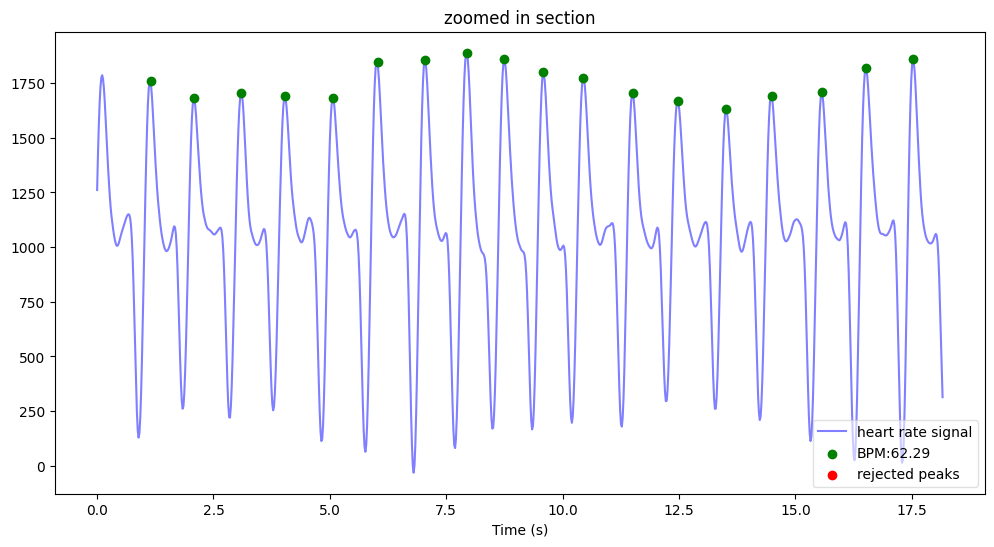

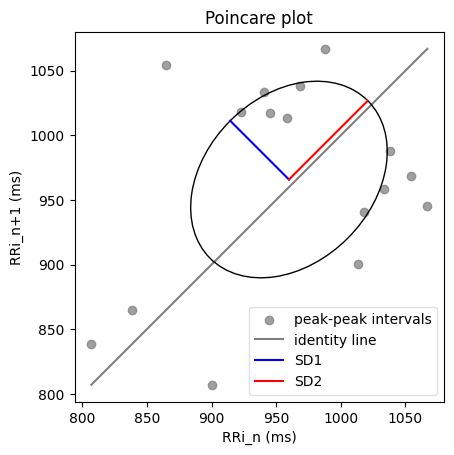

bpm: 62.290076
ibi: 963.235294
sdnn: 74.727384
sdsd: 37.314207
rmssd: 91.074480
pnn20: 1.000000
pnn50: 0.875000
hr_mad: 49.545455
sd1: 64.263167
sd2: 86.214479
s: 17405.728425
sd1/sd2: 0.745387
breathingrate: 0.183296


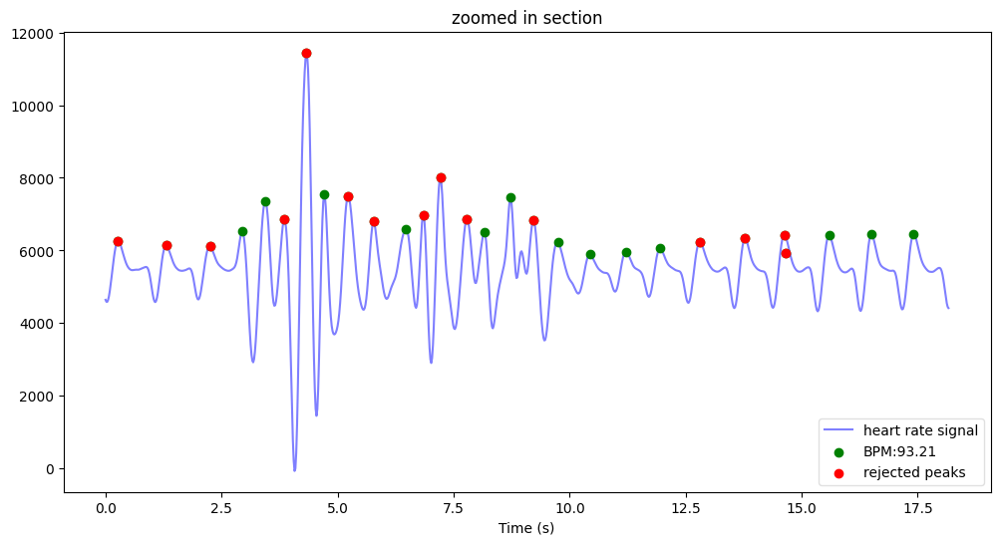

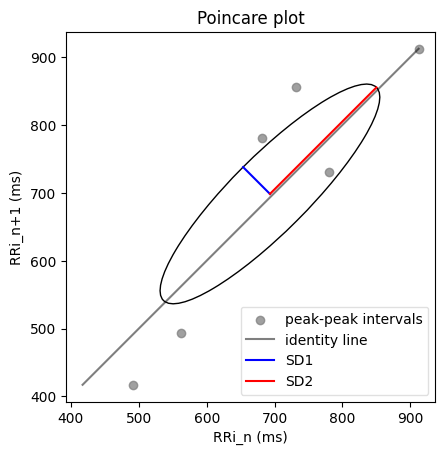

bpm: 93.208271
ibi: 643.719697
sdnn: 185.050639
sdsd: 38.654592
rmssd: 79.235126
pnn20: 0.833333
pnn50: 0.666667
hr_mad: 144.954545
sd1: 55.908455
sd2: 221.865123
s: 38968.743642
sd1/sd2: 0.251993
breathingrate: 0.129550


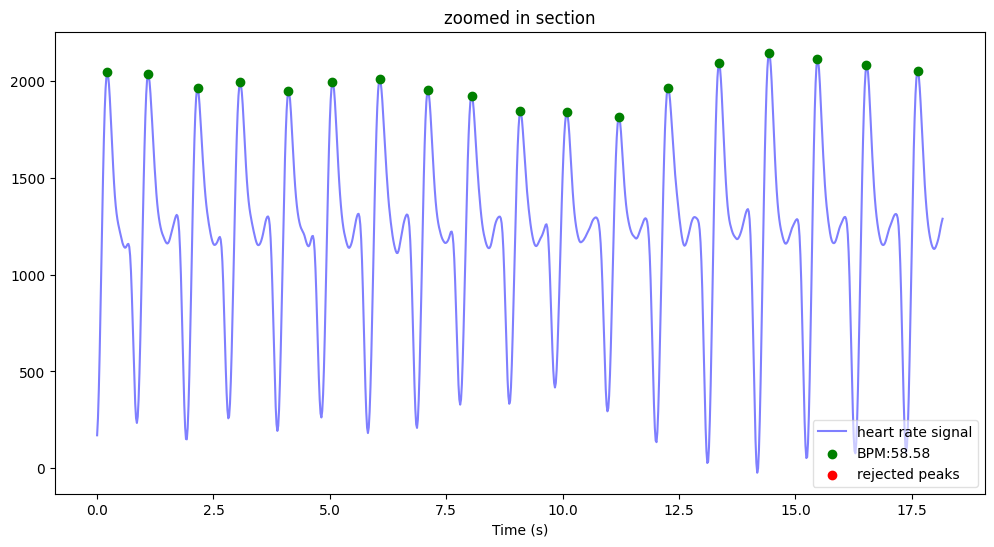

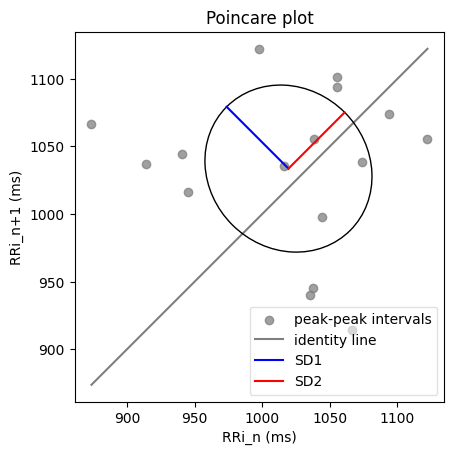

bpm: 58.579678
ibi: 1024.245989
sdnn: 66.973397
sdsd: 50.162355
rmssd: 92.503554
pnn20: 0.875000
pnn50: 0.562500
hr_mad: 35.363636
sd1: 64.633494
sd2: 58.799932
s: 11939.450275
sd1/sd2: 1.099210
breathingrate: 0.172374
(H)034_20230506_113727_Verity.csv
인덱스 길이: 23030


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


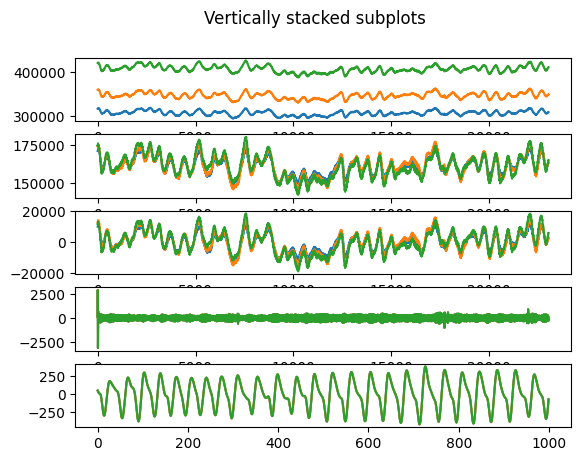

<Figure size 1200x800 with 0 Axes>

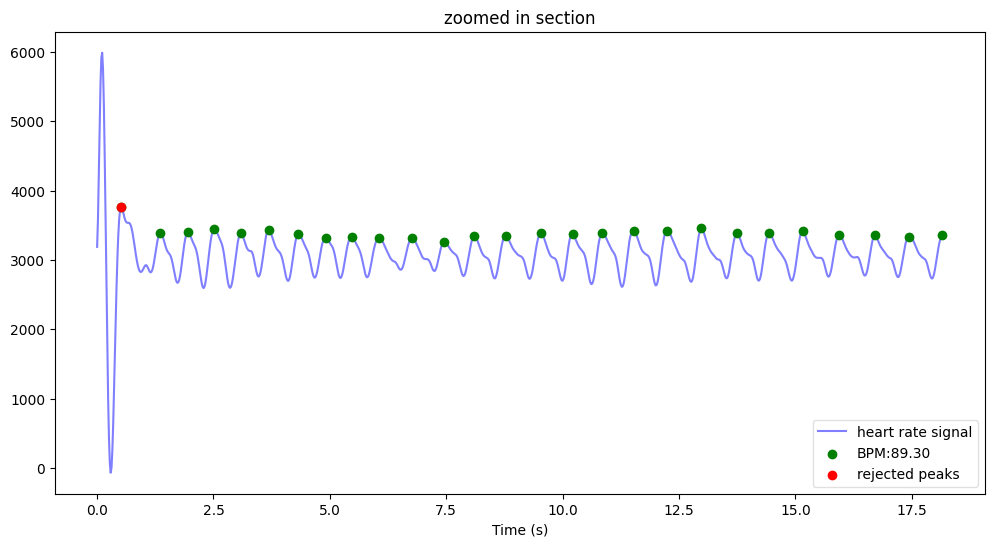

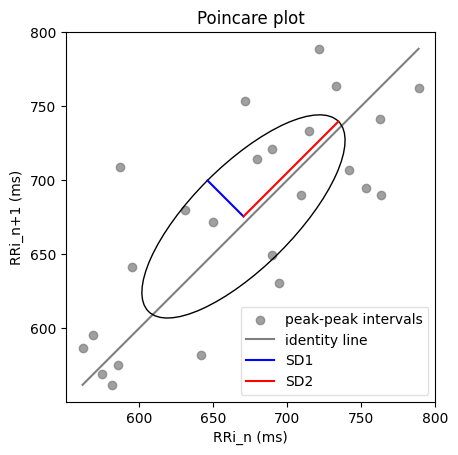

bpm: 89.301661
ibi: 671.880000
sdnn: 68.626086
sdsd: 26.266483
rmssd: 48.934825
pnn20: 0.833333
pnn50: 0.291667
hr_mad: 51.545455
sd1: 34.417176
sd2: 90.838974
s: 9821.941042
sd1/sd2: 0.378881
breathingrate: 0.357526


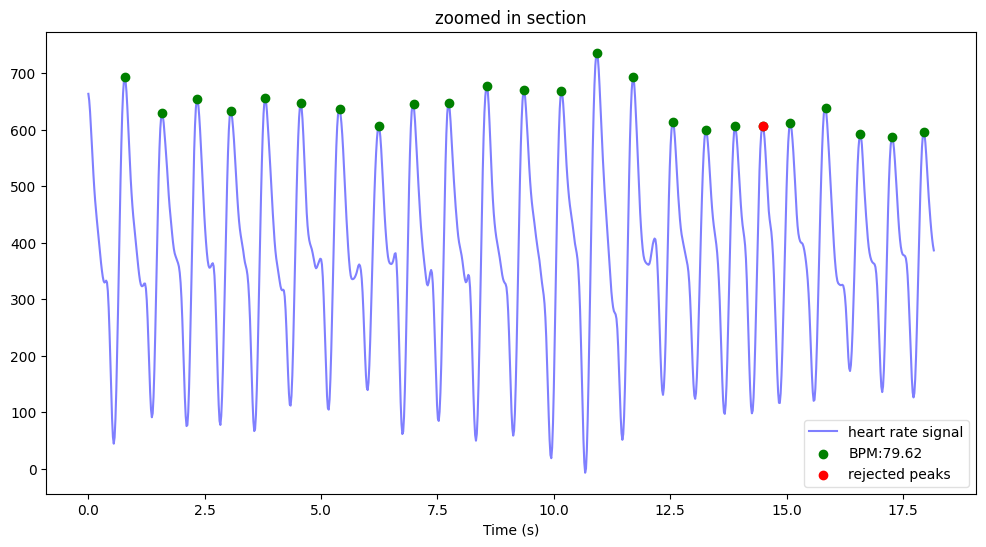

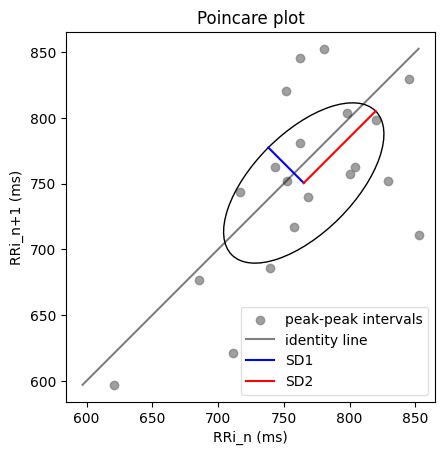

bpm: 79.624471
ibi: 753.537190
sdnn: 64.728862
sdsd: 34.442899
rmssd: 55.856191
pnn20: 0.700000
pnn50: 0.350000
hr_mad: 41.454545
sd1: 38.096940
sd2: 77.339801
s: 9256.419170
sd1/sd2: 0.492592
breathingrate: 0.301823


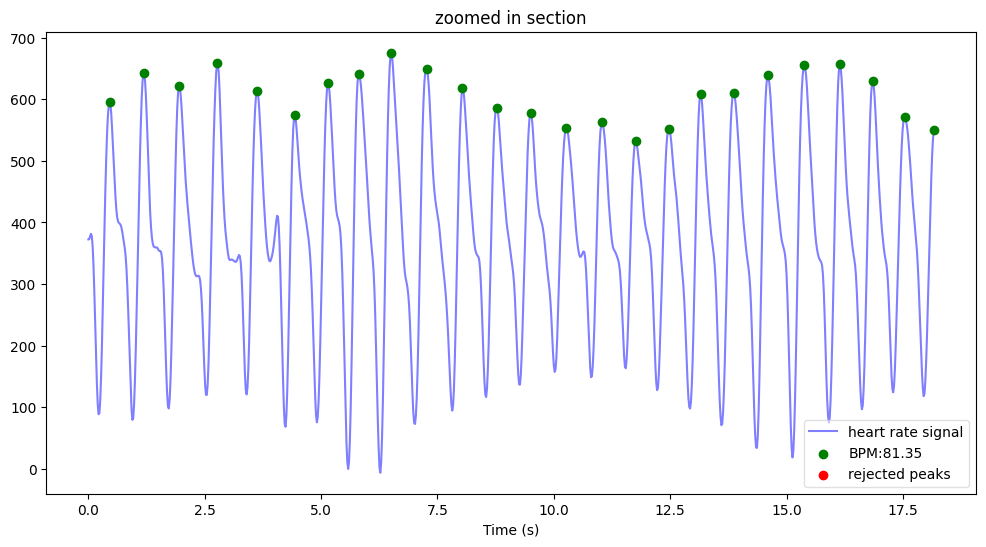

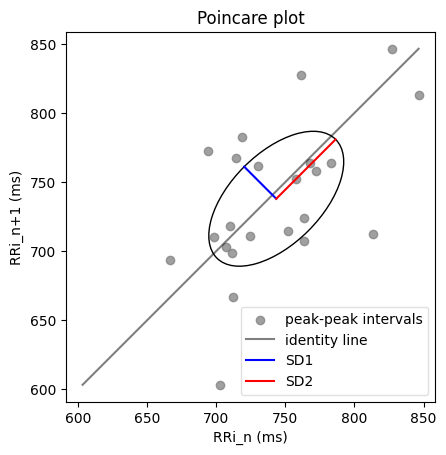

bpm: 81.346323
ibi: 737.587121
sdnn: 51.709102
sdsd: 28.813408
rmssd: 46.693325
pnn20: 0.565217
pnn50: 0.304348
hr_mad: 31.954545
sd1: 32.785825
sd2: 60.708101
s: 6252.916599
sd1/sd2: 0.540057
breathingrate: 0.113052


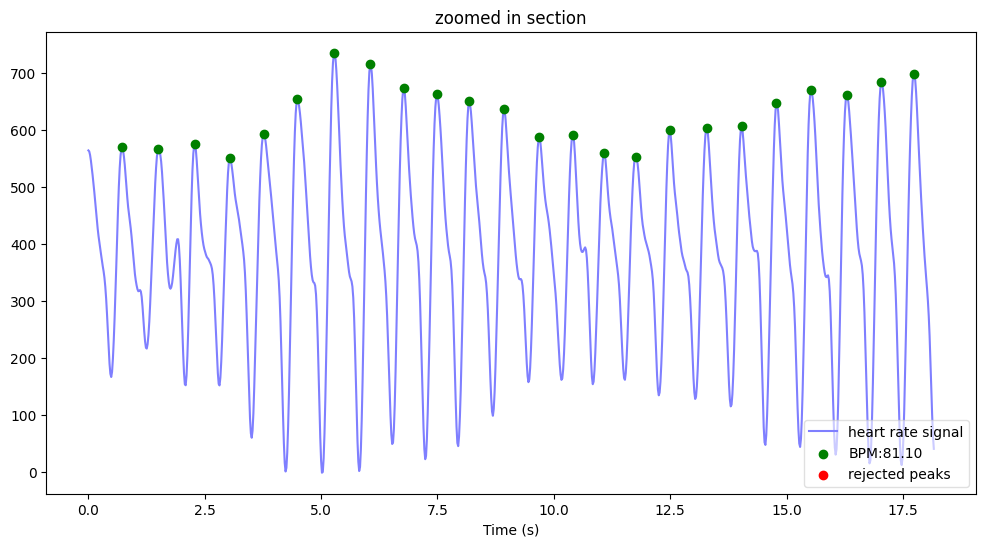

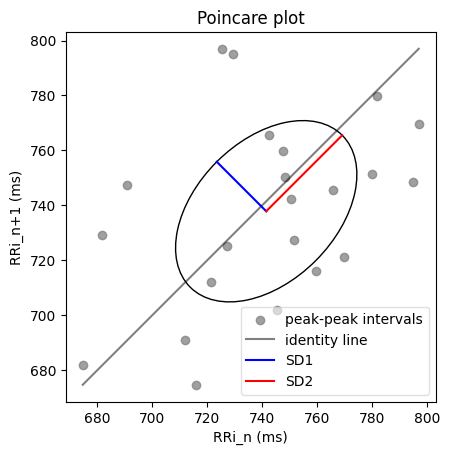

bpm: 81.104041
ibi: 739.790514
sdnn: 33.368180
sdsd: 20.774069
rmssd: 36.175292
pnn20: 0.681818
pnn50: 0.136364
hr_mad: 24.181818
sd1: 25.451116
sd2: 39.100599
s: 3126.368150
sd1/sd2: 0.650914
breathingrate: 0.235225


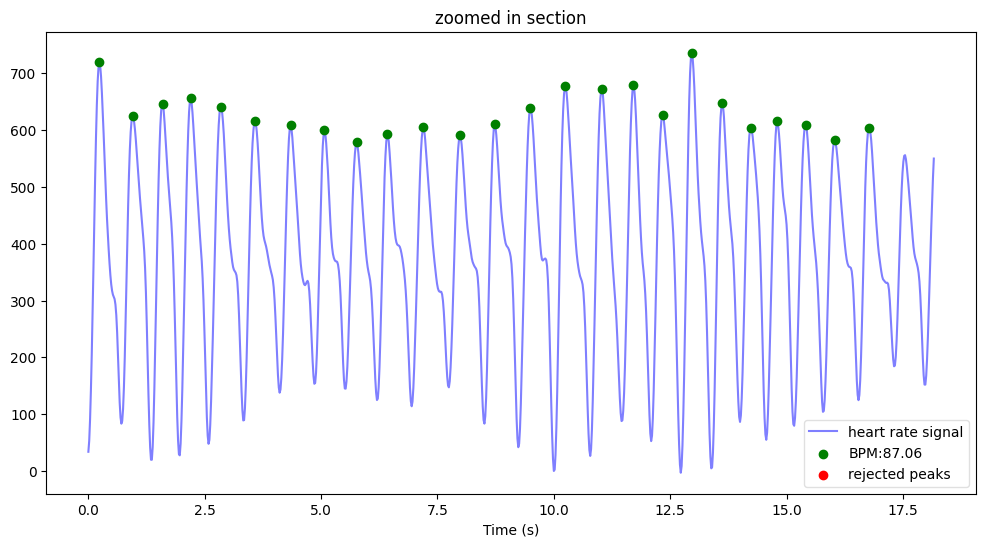

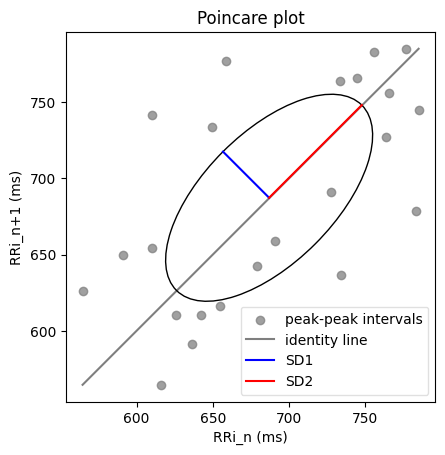

bpm: 87.064540
ibi: 689.143939
sdnn: 67.168910
sdsd: 33.321016
rmssd: 60.451270
pnn20: 0.869565
pnn50: 0.347826
hr_mad: 59.227273
sd1: 42.744904
sd2: 85.864515
s: 11530.494595
sd1/sd2: 0.497818
breathingrate: 0.302535
(H)035_20230506_120250_Verity.csv
인덱스 길이: 23138


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


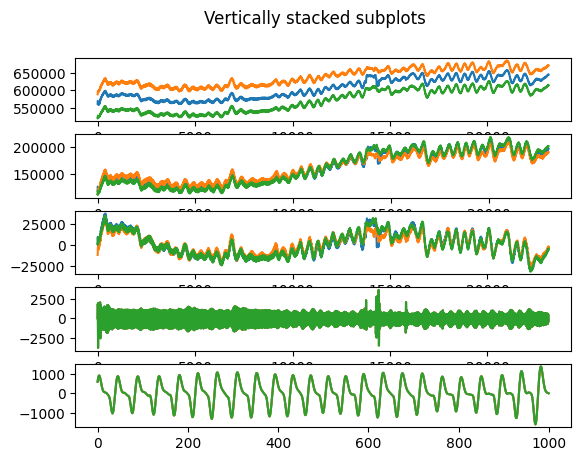

<Figure size 1200x800 with 0 Axes>

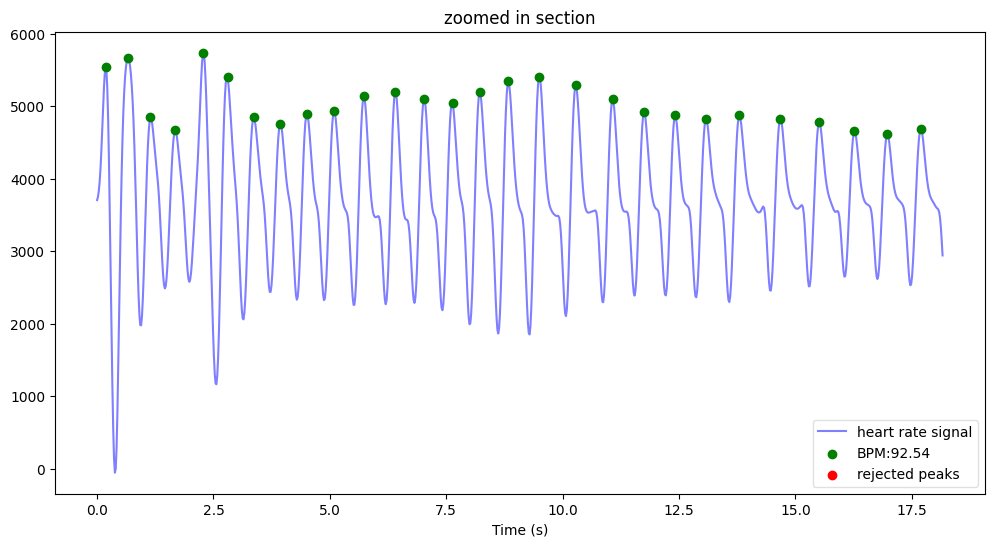

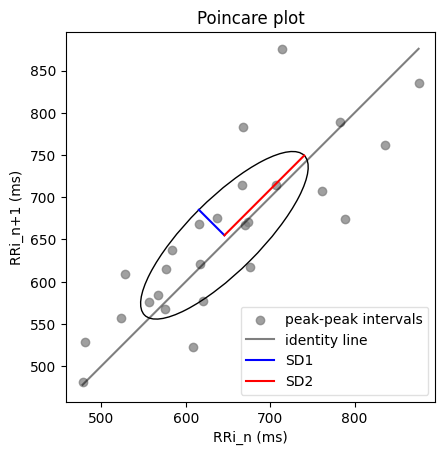

bpm: 92.544507
ibi: 648.336700
sdnn: 100.592271
sdsd: 39.507039
rmssd: 61.094161
pnn20: 0.653846
pnn50: 0.384615
hr_mad: 69.727273
sd1: 42.719896
sd2: 133.634565
s: 17934.895926
sd1/sd2: 0.319677
breathingrate: 0.228702


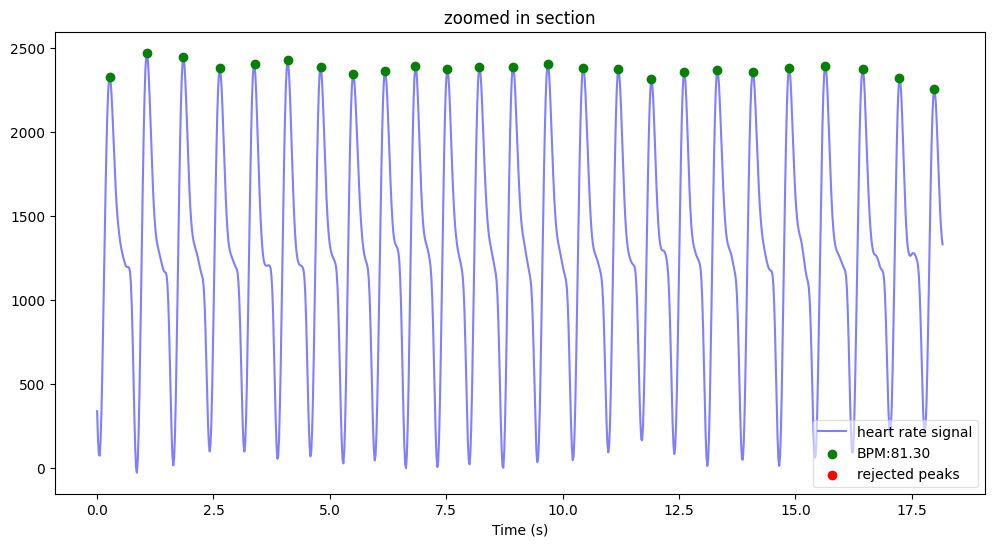

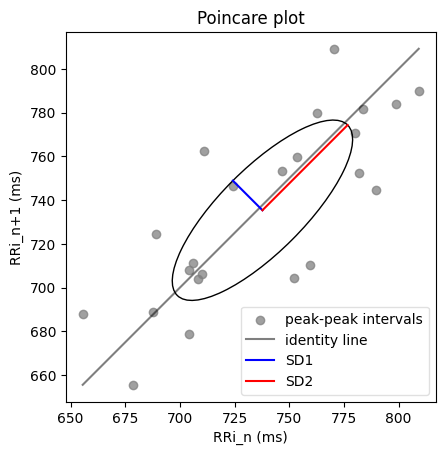

bpm: 81.300396
ibi: 738.003788
sdnn: 41.362000
sdsd: 16.553432
rmssd: 27.148320
pnn20: 0.478261
pnn50: 0.043478
hr_mad: 36.863636
sd1: 19.123376
sd2: 55.081844
s: 3309.199273
sd1/sd2: 0.347181
breathingrate: 0.169492


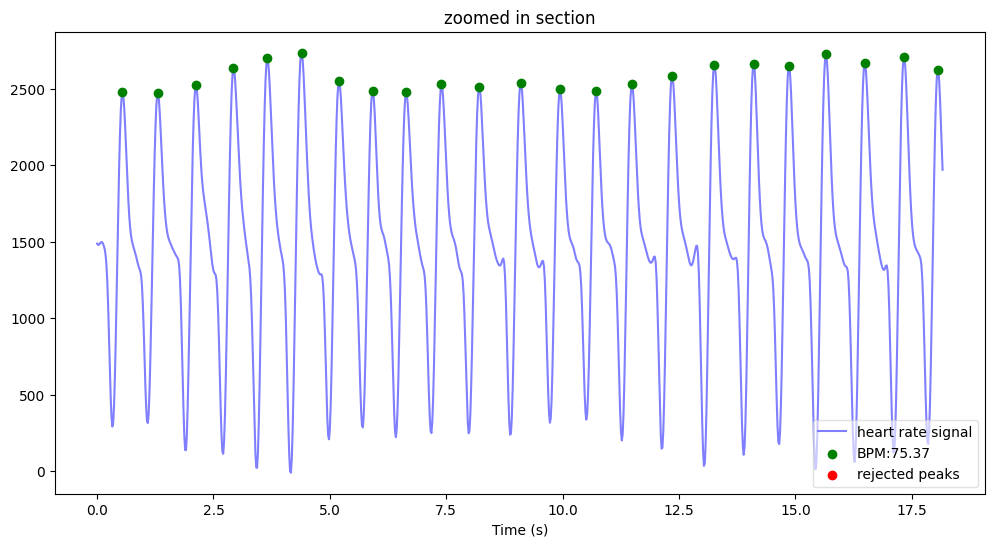

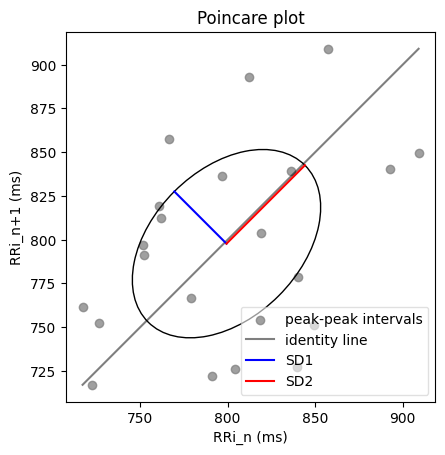

bpm: 75.372189
ibi: 796.049587
sdnn: 53.908169
sdsd: 29.158071
rmssd: 59.643487
pnn20: 0.809524
pnn50: 0.571429
hr_mad: 42.454545
sd1: 42.159349
sd2: 63.348260
s: 8390.318801
sd1/sd2: 0.665517
breathingrate: 0.228519


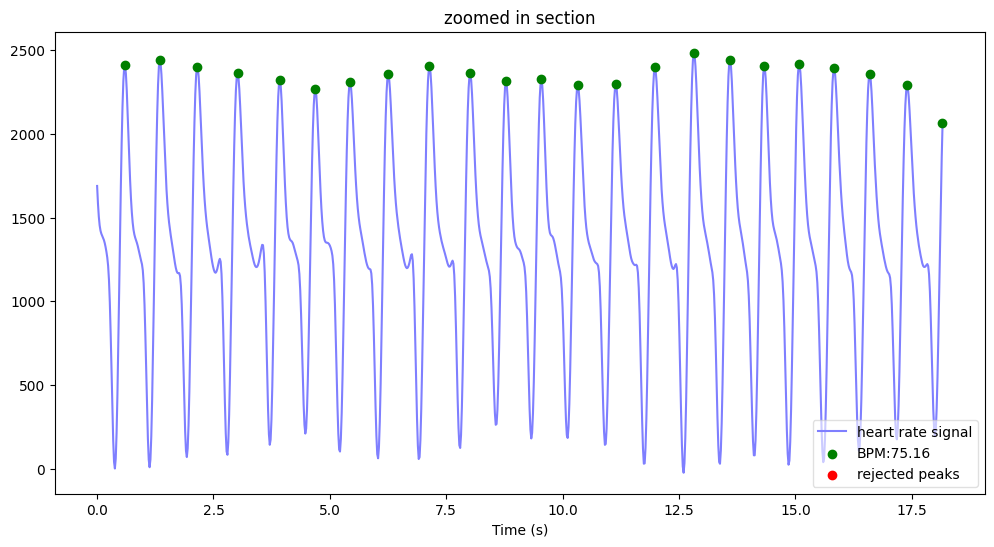

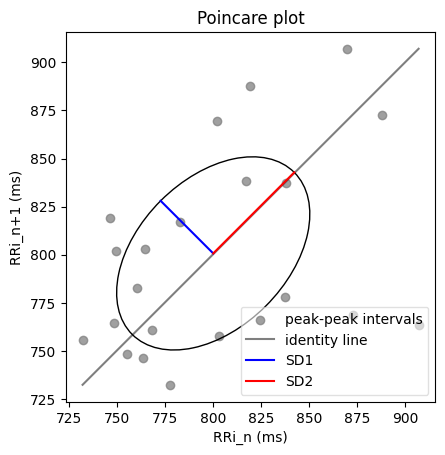

bpm: 75.159559
ibi: 798.301653
sdnn: 50.068198
sdsd: 33.954804
rmssd: 54.725331
pnn20: 0.714286
pnn50: 0.333333
hr_mad: 31.363636
sd1: 38.695672
sd2: 59.611340
s: 7246.714480
sd1/sd2: 0.649133
breathingrate: 0.227920


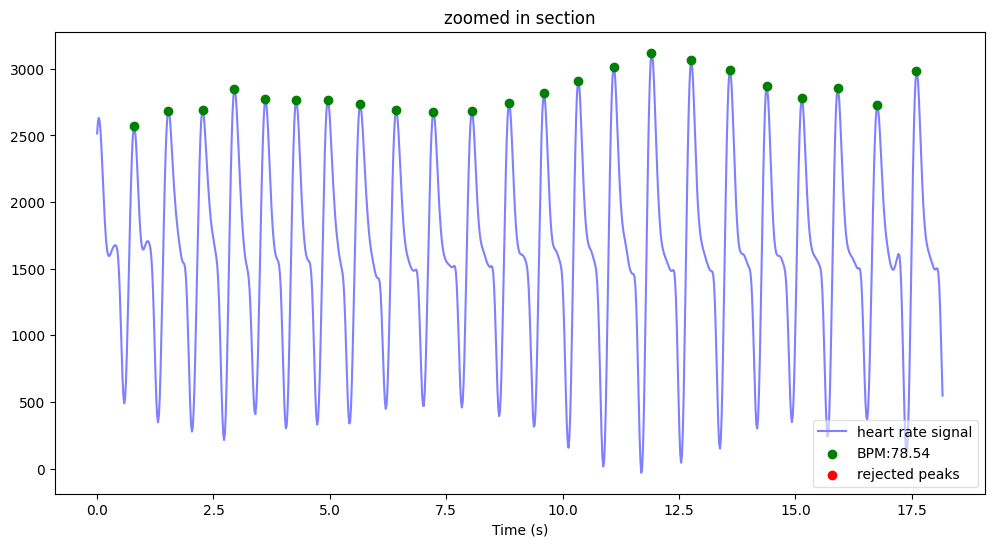

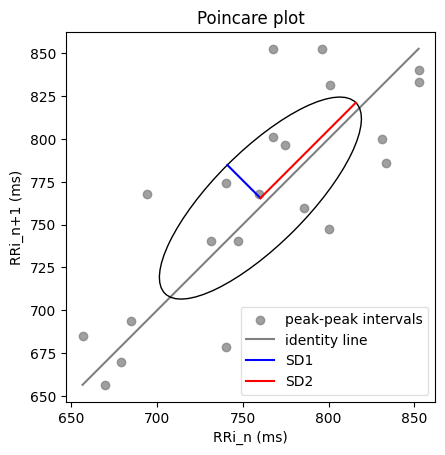

bpm: 78.543377
ibi: 763.909091
sdnn: 58.975902
sdsd: 22.396387
rmssd: 38.938412
pnn20: 0.619048
pnn50: 0.238095
hr_mad: 34.863636
sd1: 27.287487
sd2: 78.728789
s: 6749.117469
sd1/sd2: 0.346601
breathingrate: 0.178625
(H)036_20230506_125632_Verity.csv
인덱스 길이: 23072
안됨


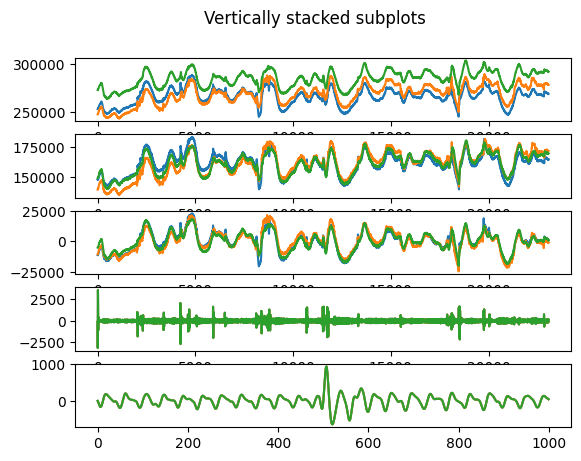

<Figure size 1200x800 with 0 Axes>

(H)037_20230506_123958_Verity.csv
인덱스 길이: 23134


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


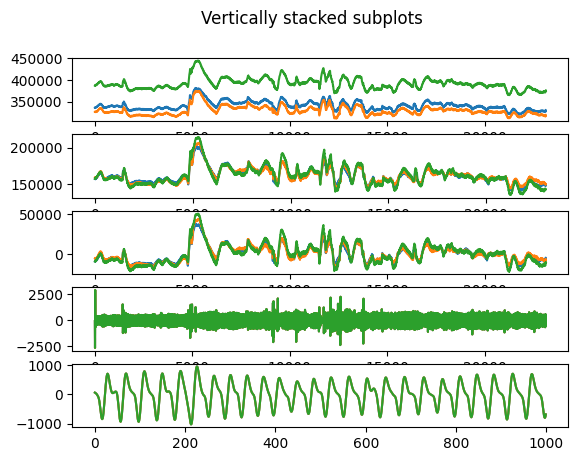

<Figure size 1200x800 with 0 Axes>

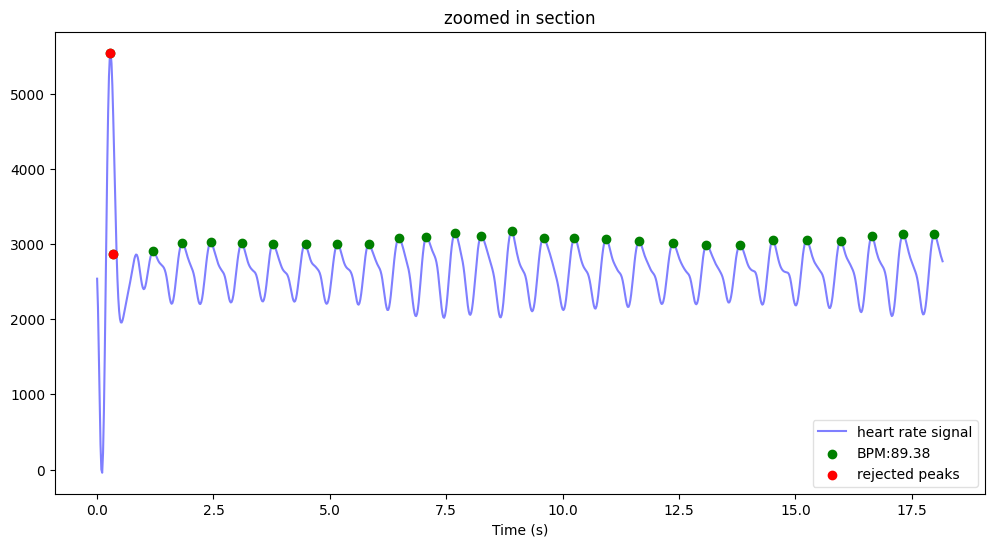

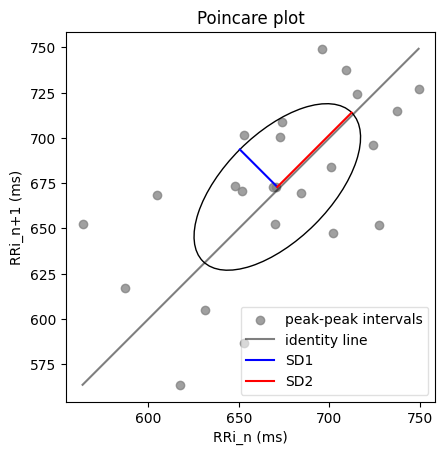

bpm: 89.382449
ibi: 671.272727
sdnn: 45.436389
sdsd: 22.599055
rmssd: 41.436262
pnn20: 0.708333
pnn50: 0.291667
hr_mad: 28.000000
sd1: 29.274506
sd2: 58.092616
s: 5342.695031
sd1/sd2: 0.503928
breathingrate: 0.119275


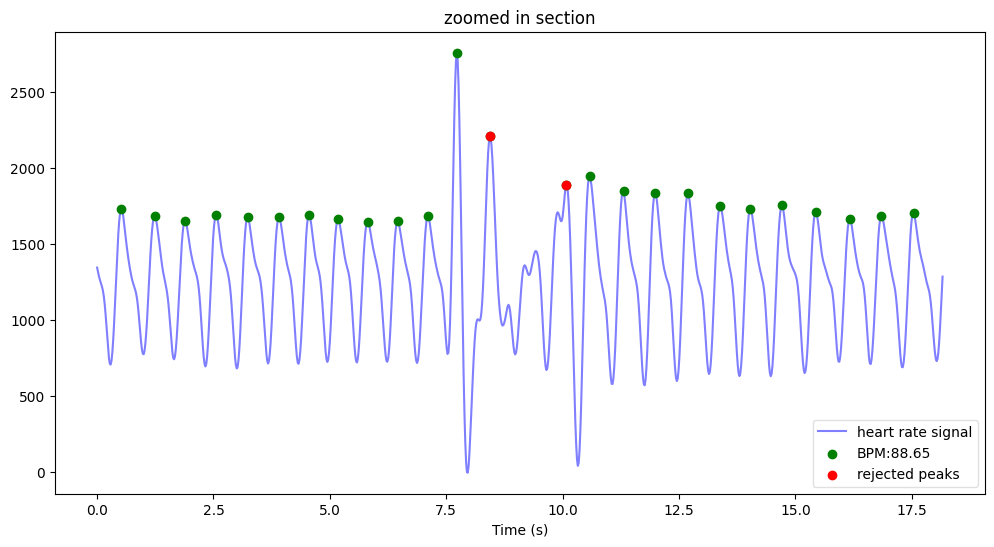

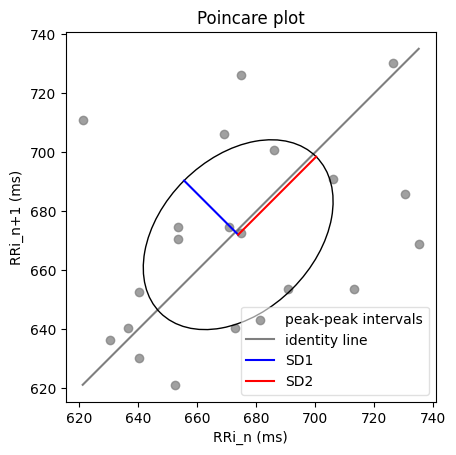

bpm: 88.652807
ibi: 676.797521
sdnn: 33.196600
sdsd: 23.742360
rmssd: 36.724899
pnn20: 0.500000
pnn50: 0.200000
hr_mad: 29.681818
sd1: 25.936580
sd2: 37.385608
s: 3046.260464
sd1/sd2: 0.693758
breathingrate: 0.201626


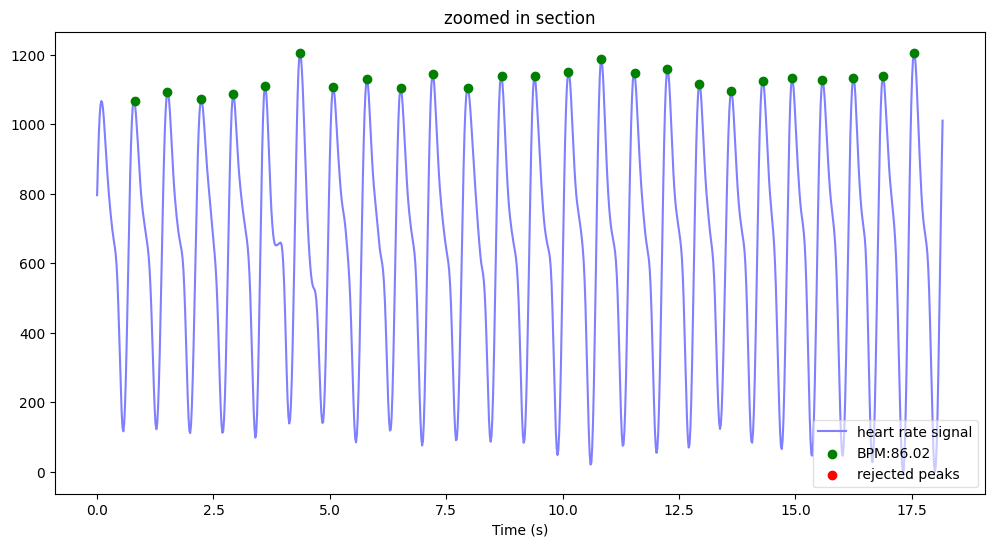

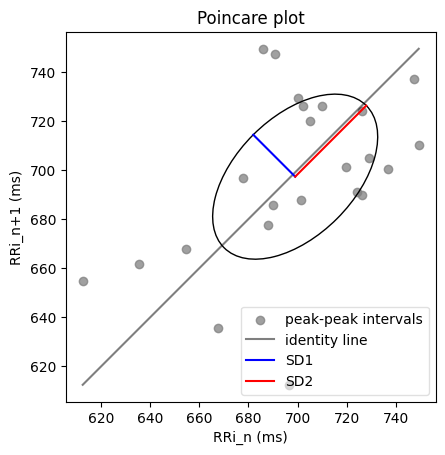

bpm: 86.023374
ibi: 697.484848
sdnn: 33.391324
sdsd: 19.348875
rmssd: 34.249901
pnn20: 0.565217
pnn50: 0.130435
hr_mad: 23.272727
sd1: 24.185948
sd2: 41.016043
s: 3116.497211
sd1/sd2: 0.589670
breathingrate: 0.358680


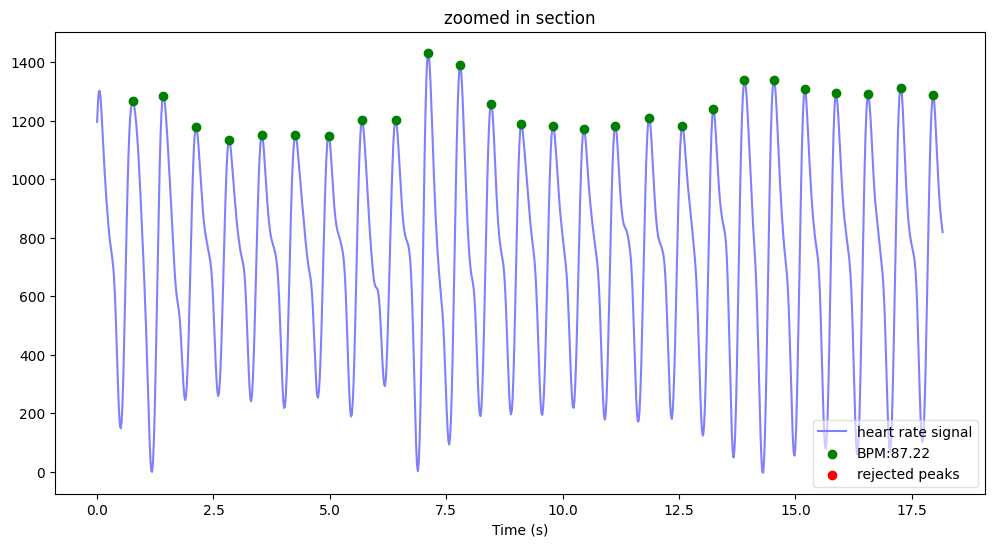

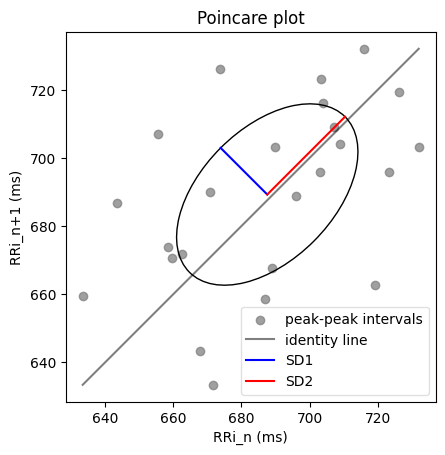

bpm: 87.219444
ibi: 687.920000
sdnn: 26.543329
sdsd: 15.526901
rmssd: 27.443518
pnn20: 0.500000
pnn50: 0.125000
hr_mad: 19.181818
sd1: 19.369024
sd2: 32.317004
s: 1966.476232
sd1/sd2: 0.599345
breathingrate: 0.174561


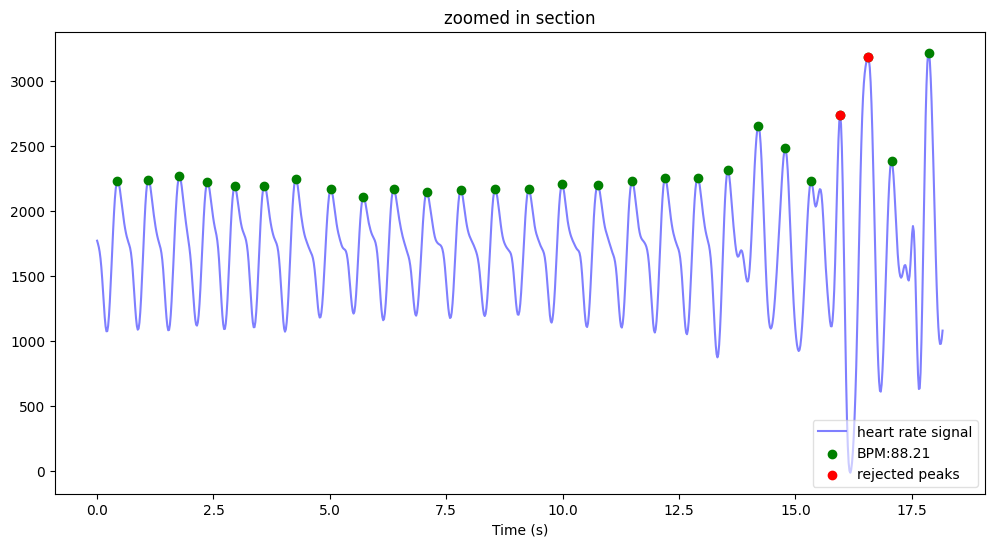

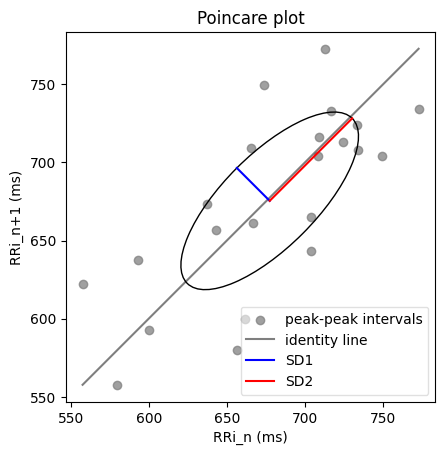

bpm: 88.212199
ibi: 680.178030
sdnn: 60.252159
sdsd: 23.587456
rmssd: 42.137748
pnn20: 0.636364
pnn50: 0.272727
hr_mad: 39.863636
sd1: 29.761468
sd2: 74.712400
s: 6985.490657
sd1/sd2: 0.398347
breathingrate: 0.122579
(H)038_20230506_124529_Verity.csv
인덱스 길이: 23071
안됨


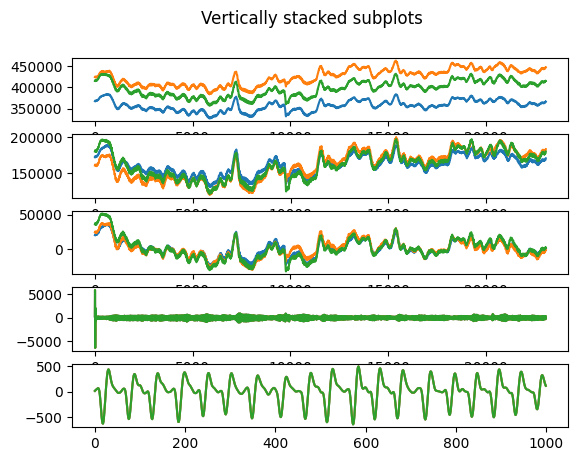

<Figure size 1200x800 with 0 Axes>

(H)039_20230506_122927_Verity.csv
인덱스 길이: 23047


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


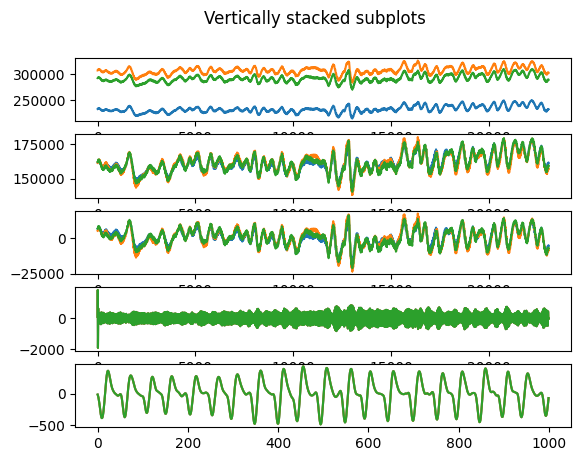

<Figure size 1200x800 with 0 Axes>

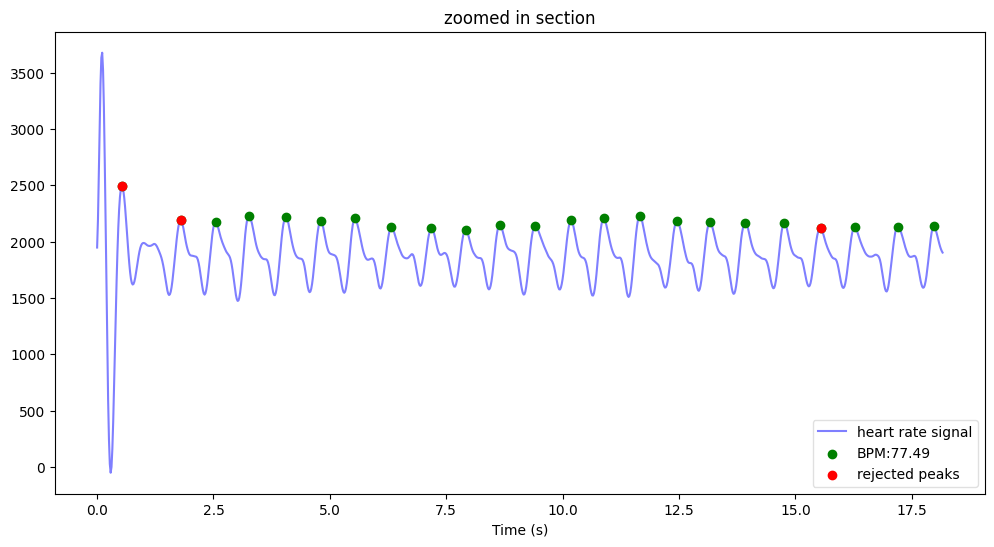

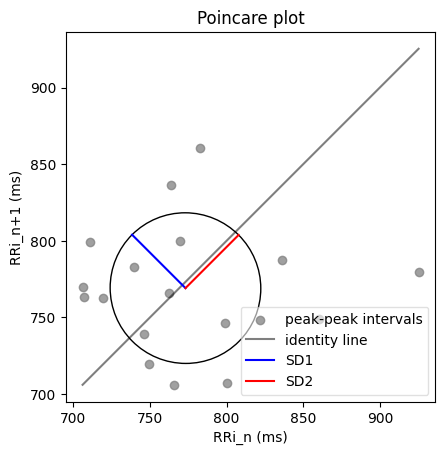

bpm: 77.488244
ibi: 774.311005
sdnn: 53.690066
sdsd: 35.047782
rmssd: 69.772796
pnn20: 0.882353
pnn50: 0.588235
hr_mad: 26.181818
sd1: 49.253489
sd2: 49.008665
s: 7583.326361
sd1/sd2: 1.004996
breathingrate: 0.340067


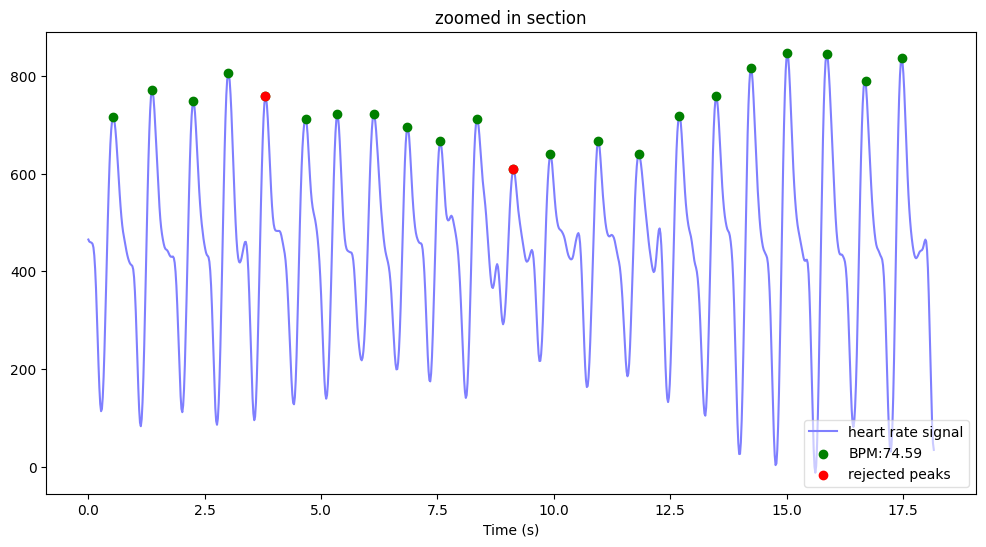

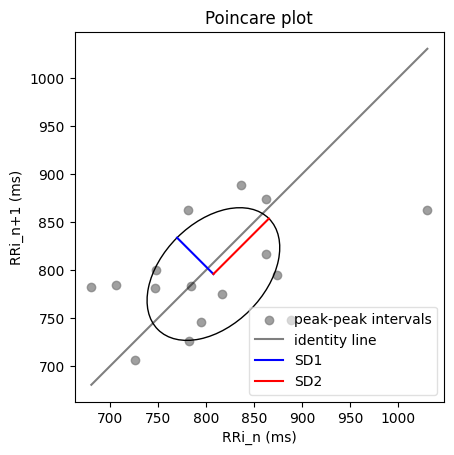

bpm: 74.594016
ibi: 804.354067
sdnn: 76.515984
sdsd: 43.072340
rmssd: 76.556004
pnn20: 0.875000
pnn50: 0.562500
hr_mad: 38.363636
sd1: 53.487489
sd2: 81.662515
s: 13722.234554
sd1/sd2: 0.654982
breathingrate: 0.130941


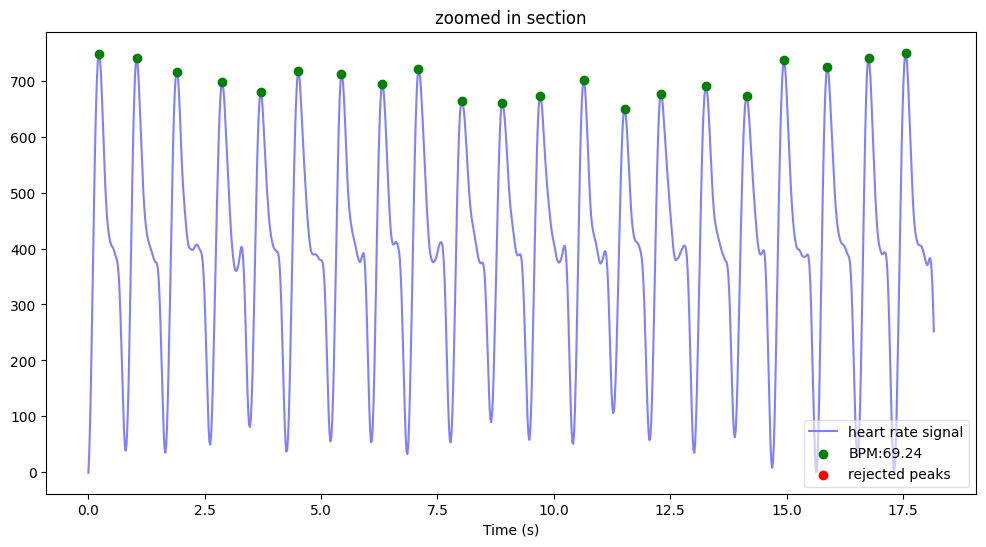

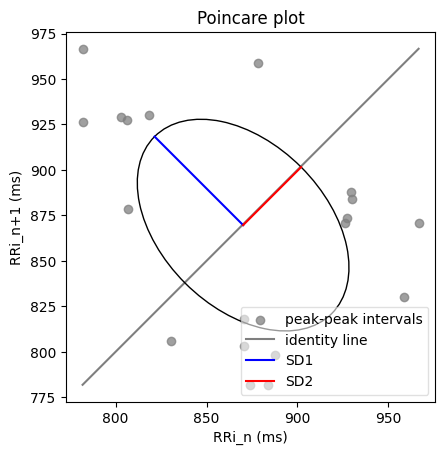

bpm: 69.242996
ibi: 866.513636
sdnn: 58.619711
sdsd: 39.609150
rmssd: 97.389812
pnn20: 1.000000
pnn50: 0.842105
hr_mad: 56.045455
sd1: 68.864182
sd2: 45.118626
s: 9761.108389
sd1/sd2: 1.526292
breathingrate: 0.346460


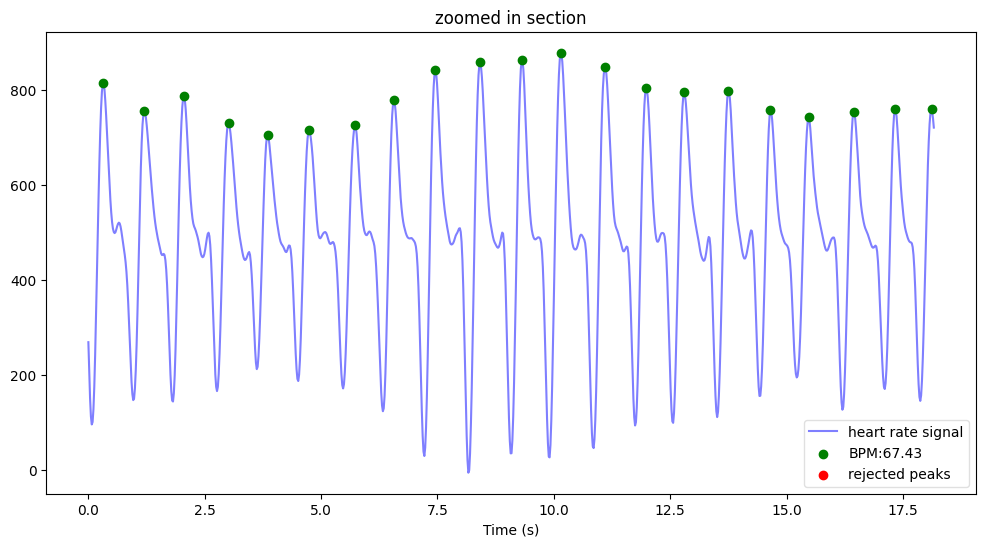

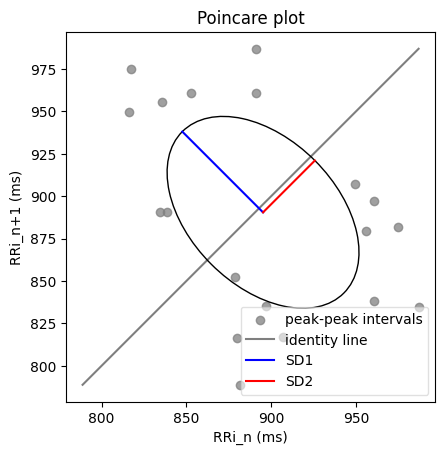

bpm: 67.427783
ibi: 889.840909
sdnn: 57.519970
sdsd: 35.766123
rmssd: 95.278797
pnn20: 1.000000
pnn50: 0.894737
hr_mad: 51.454545
sd1: 67.289140
sd2: 43.188936
s: 9129.928042
sd1/sd2: 1.558018
breathingrate: 0.337363


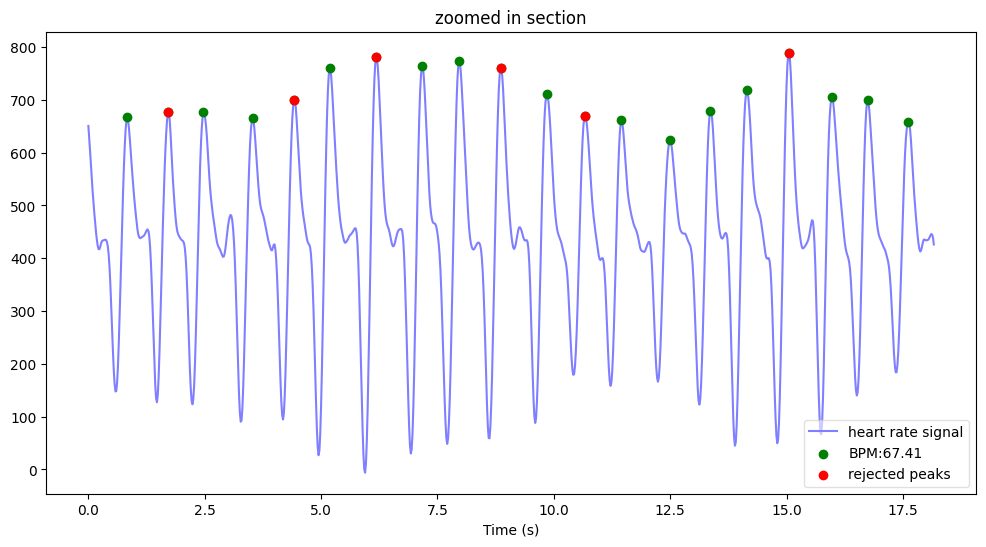

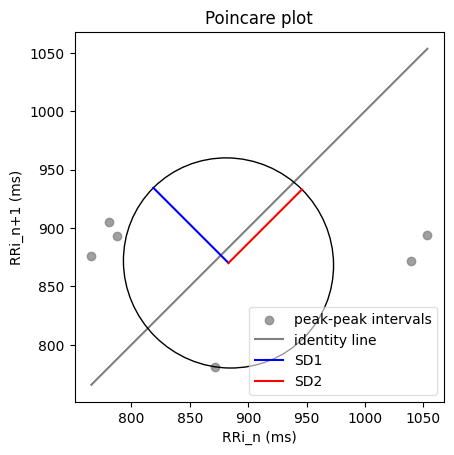

bpm: 67.412023
ibi: 890.048951
sdnn: 89.849600
sdsd: 28.252404
rmssd: 129.394745
pnn20: 1.000000
pnn50: 1.000000
hr_mad: 67.727273
sd1: 91.024265
sd2: 89.014717
s: 25454.752035
sd1/sd2: 1.022575
breathingrate: 0.259448


In [36]:
print('피험자 수:', len(resting_verity_dict), '명')
fs = VERITY_FS
#cutoff Wn
# cutoff = [fs*0.03,fs/2*0.97]
cutoff = [1.5,3.5]
ts = 1/ fs
Nyq = fs / 2
# 파라미터 계수 N
order = 2

sos = signal.butter(order, cutoff, btype='bandpass', output = 'sos', fs = fs)


for i in resting_verity_dict:
    print(i)
    print('인덱스 길이:',len(resting_verity_dict[i]))
    signals = resting_verity_dict[i][['ppg0', 'ppg1', 'ppg2', 'ambient']]

    # data resampling
    sample_rate = VERITY_FS
    resample_scale = 10
    resampled_signals = resample(signals, len(signals) * resample_scale)
    resample_length = len(resampled_signals)
    resample_rate = sample_rate * resample_scale
    
#     for j in resampled_signals:
#         #
#         resampled_signals[j]
    
    
    length = len(resting_verity_dict[i])
    f = np.linspace(-(fs / 2), fs / 2, length)

    
    # ambient = resting_verity_dict[i]['ambient'] - resting_verity_dict[i]['ambient'].mean()
    
    signal_0 = resting_verity_dict[i]['ppg0'] - resting_verity_dict[i]['ambient']
    signal_1 = resting_verity_dict[i]['ppg1'] - resting_verity_dict[i]['ambient']
    signal_2 = resting_verity_dict[i]['ppg2'] - resting_verity_dict[i]['ambient']
    
    signal_0_avdc = resting_verity_dict[i]['ppg0'] - resting_verity_dict[i]['ppg0'].mean() - ambient
    signal_1_avdc = resting_verity_dict[i]['ppg1'] - resting_verity_dict[i]['ppg1'].mean() - ambient
    signal_2_avdc = resting_verity_dict[i]['ppg2'] - resting_verity_dict[i]['ppg2'].mean() - ambient  
    
    signal_0_ffty=signal.detrend(signal_0)
    signal_1_ffty=signal.detrend(signal_1)
    signal_2_ffty=signal.detrend(signal_2)
    
    signal_0_filtered = signal.sosfilt(sos, signal_0_ffty)
    signal_1_filtered = signal.sosfilt(sos, signal_0_ffty)
    signal_2_filtered = signal.sosfilt(sos, signal_0_ffty)
    
    
    fig, axs = plt.subplots(5)
    fig.suptitle('Vertically stacked subplots')
    plt.figure(figsize=(15, 10), dpi=80)

    axs[0].plot(signal_0)
    axs[0].plot(signal_1)
    axs[0].plot(signal_2)
    
    axs[1].plot(signal_0_avdc)
    axs[1].plot(signal_1_avdc)
    axs[1].plot(signal_2_avdc)
    
    axs[2].plot(signal_0_ffty)
    axs[2].plot(signal_1_ffty)
    axs[2].plot(signal_2_ffty)
    
    axs[3].plot(signal_0_filtered)
    axs[3].plot(signal_1_filtered)
    axs[3].plot(signal_2_filtered)
    
    axs[4].plot(signal_0_filtered[6000:7000])
    axs[4].plot(signal_1_filtered[6000:7000])
    axs[4].plot(signal_2_filtered[6000:7000])
    
    try:
        for s in [[0, 1000], [1000, 2000], [2000, 3000], [3000, 4000], [4000, 5000]]:
            wd, m = hp.process(signal_0_filtered[s[0]:s[1]], sample_rate = 55, 
                               high_precision=True, clean_rr=True)
            hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
            hp.plot_poincare(wd, m)
            plt.show()
            for measure in m.keys():
                print('%s: %f' %(measure, m[measure]))
    except:
        print('안됨')
        pass
                
    
    plt.show()

In [34]:
sample_rate = VERITY_FS
for i in resting_verity_dict:
    print(i)
    print('인덱스 길이:',len(resting_verity_dict[i]))
    
    signals = resting_verity_dict[i][['ppg0', 'ppg1', 'ppg2', 'ambient']]
    # signal_0 = resting_verity_dict[i]['ppg0']
    # signal_1 = resting_verity_dict[i]['ppg1']
    # signal_2 = resting_verity_dict[i]['ppg2']
    
    # data resampling
    resample_scale = 10
    resampled_signals = resample(signals, len(signals) * resample_scale)
    resample_length = len(resampled_signals)
    resample_rate = sample_rate * resample_scale
    
    for j in resampled_signals:
        #
        resampled_signals[j]
    
    signal_0_q1 = np.percentile(signal_0, 25)
    signal_0_q3 = np.percentile(signal_0, 75)
    signal_0_iqr = (signal_0_q3 - signal_0_q1)*1.5
    low0 = signal_0_q1 - signal_0_iqr
    high0 = signal_0_q3 + signal_0_iqr
    outlier_index = signal_0[(signal_0<low0) | (signal_0>high0)].index

    fig, axs = plt.subplots(2)
    fig.suptitle('Vertically stacked subplots')
    plt.figure(figsize=(15, 10), dpi=80)

    axs[0].plot(signal_0)
    print(len(outlier_index))
    signal_0.drop(outlier_index, axis = 0, inplace = True)
    print(len(signal_0))
    axs[1].plot(signal_0)
#     enhanced_signal_0 = hp.enhance_peaks(signal_0, iterations=3)
#     enhanced_signal_1 = hp.enhance_peaks(signal_1, iterations=3)
#     enhanced_signal_2 = hp.enhance_peaks(signal_2, iterations=3)
    
#     filtered_signal_0 = hp.filter_signal(signal_0, [0.05, 0.1 ], sample_rate=sample_rate, 
#                                          order=3, filtertype='bandpass')
    
# #     wd, m = hp.process(resampled, sample_rate = new_sample_rate, 
# #                        high_precision=True, clean_rr=True)

#     wd, m = hp.process(filtered_signal_0, sample_rate = sample_rate,
#                        high_precision = True, clean_rr = True)
#     hp.plotter(wd, m, figsize=(12,6))
#     hp.plot_poincare(wd, m)
#     plt.show()
#     for measure in m.keys():
#         print('%s: %f' %(measure, m[measure]))
    
#     # for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
#     #     wd, m = hp.process(resampled[s[0]:s[1]], sample_rate = new_sample_rate, 
#     #                        high_precision=True, clean_rr=True)
#     #     hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
#     #     hp.plot_poincare(wd, m)
#     #     plt.show()
#     #     for measure in m.keys():
#     #         print('%s: %f' %(measure, m[measure]))
#     # plt.plot(filtered_signal_0)
# #     plt.plot(filtered_signal_0[0:int(sample_rate*60)])    
    
    plt.show()
    # filtered = hp.filtering.butter_bandpass(lowcut = 0.4, highcut = 3.7, sample_rate=55.0, order=3)

(H)021_20230506_091434_Verity.csv
인덱스 길이: 23842


IndexError: arrays used as indices must be of integer (or boolean) type

In [35]:
for i in resting_verity_dict:
    print(i)
    print('인덱스 길이:',len(resting_verity_dict[i]))
    
    signal_0 = resting_verity_dict[i]['ppg0']
    signal_1 = resting_verity_dict[i]['ppg1']
    signal_2 = resting_verity_dict[i]['ppg2']
    
    # enhanced_signal_0 = hp.enhance_peaks(signal_0, iterations=2)
    # enhanced_signal_1 = hp.enhance_peaks(signal_1, iterations=2)
    # enhanced_signal_2 = hp.enhance_peaks(signal_2, iterations=2)
    
    filtered_signal_0 = hp.filter_signal(signal_0, [1.5, 3.5], sample_rate=VERITY_FS, 
                                         order=2, filtertype='bandpass')
    
    resampled = resample(filtered_signal_0, len(filtered_signal_0) * 10)

    #don't forget to compute the new sampling rate
    new_sample_rate = sample_rate * 10
    
    for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
        wd, m = hp.process(resampled[s[0]:s[1]], sample_rate = new_sample_rate, 
                           high_precision=True, clean_rr=True)
        hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
        hp.plot_poincare(wd, m)
        plt.show()
        for measure in m.keys():
            print('%s: %f' %(measure, m[measure]))

(H)021_20230506_091434_Verity.csv
인덱스 길이: 23842


ValueError: invalid number of data points (0) specified